In [ ]:
# Required columns on input dataframe: 
#['timestamp', 'series_id', 'Brand', 'Resource ID', 'ADD', 'sin_week', 'cos_week', 'week_number']


# Libraries
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

from modules.features import load_data, series_exog, train_test_split, calculate_stats_train, normalize_series, create_time_series_dicts, get_series_preds, get_split_col

from modules.plotting import plot_series, plot_train_test_split, plot_results, plot_results_dual_scale

from modules.lgbm_architecture import create_forecaster, tune_forecaster, create_final_forecaster, backtest_forecaster, fit_predict

from modules.metrics import format_results, get_full_metrics, residuals

c:\Users\maria.diazalba\OneDrive - Cordis US Corp\0 MARIA\SKU Demand\venv_psr\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
filepath="./features_py.xlsx"

features = load_data(filepath)

series, exog = series_exog(features)

series_train, series_test, exog_train, exog_test = train_test_split(series, exog, test_weeks=8)

series_train, series_test = normalize_series(series_train, series_test)

series_dict_train, series_dict_test, exog_dict_train, exog_dict_test = create_time_series_dicts(
    series_train, series_test, exog_train, exog_test
)

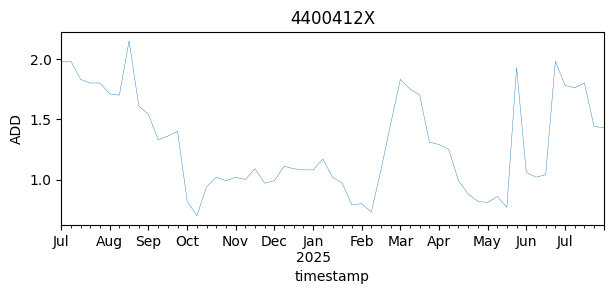

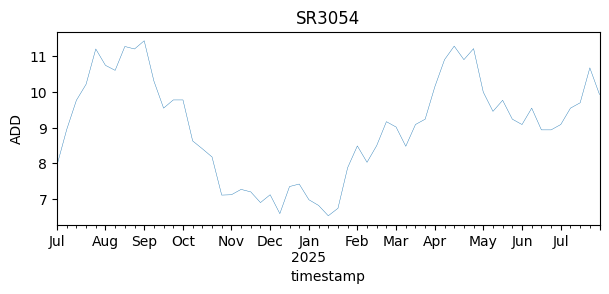

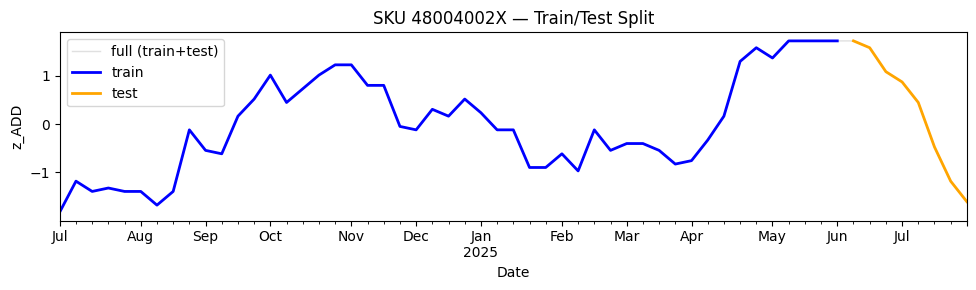

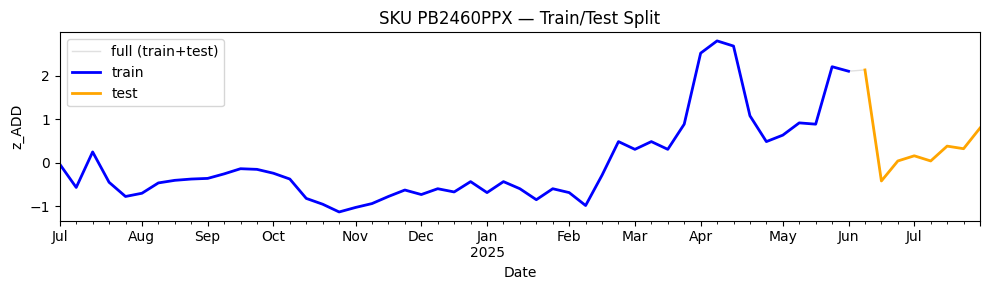

In [3]:
plot_series(series, column='ADD')
plot_train_test_split(series_dict_train, series_dict_test, ylabel='z_ADD')

In [4]:
forecaster = create_forecaster()
forecaster

============================== 
ForecasterRecursiveMultiSeries 
============================== 
Regressor: LGBMRegressor 
Lags: [1 2 3 4] 
Window features: None 
Window size: 4 
Series encoding: ordinal 
Series names (levels): None 
Exogenous included: False 
Exogenous names: None 
Transformer for series: None 
Transformer for exog: None 
Weight function included: False 
Series weights: None 
Differentiation order: None 
Training range: None 
Training index type: None 
Training index frequency: None 
Regressor parameters: 
    {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 0.8,
    'importance_type': 'split', 'learning_rate': 0.05, 'max_depth': -1,
    'min_child_samples': 20, 'min_child_weight': 0.001, 'min_split_gain': 0.0,
    'n_estimators': 600, 'n_jobs': -1, 'num_leaves': 63, 'objective': None,
    'random_state': 42, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 0.8,
    'subsample_for_bin': 200000, 'subsample_freq': 0} 
fit_kwargs: {} 
Creation date: 2025-09-29 10:53:28 
Last fit date: None 
Skforecast version: 0.17.0 
Python version: 3.13.5 
Forecaster id: None

In [ ]:
# best_params, best_lags = tune_forecaster(series_dict_train, exog_dict_train)

  0%|          | 0/20 [00:00<?, ?it/s]

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=1.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0
[LightGBM] [Warning] lambda_l2 is set=0.9, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.8 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=1.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0
[LightGBM] [Warning] lambda_l2 is set=0.9, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.8 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003644 seconds.


Best trial: 0. Best value: 0.326383:   5%|▌         | 1/20 [00:13<04:17, 13.55s/it]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.8 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.8 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000735 seconds.


Best trial: 0. Best value: 0.326383:  10%|█         | 2/20 [00:26<03:53, 12.99s/it]

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.7000000000000001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7000000000000001
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.8 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.1, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1
[LightGBM] [Warning] lambda_l2 is set=0.7000000000000001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7000000000000001
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.8 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Info] Auto-choosing col-wise mul

Best trial: 0. Best value: 0.326383:  15%|█▌        | 3/20 [00:39<03:43, 13.15s/it]

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=1.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.8 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=1.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.8 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002709 seconds.


Best trial: 0. Best value: 0.326383:  20%|██        | 4/20 [00:52<03:29, 13.09s/it]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current valu

Best trial: 4. Best value: 0.321332:  25%|██▌       | 5/20 [01:06<03:21, 13.44s/it]

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000661 seconds.


Best trial: 4. Best value: 0.321332:  30%|███       | 6/20 [01:22<03:19, 14.26s/it]

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] lambda_l1 is set=0.5, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002500 seconds.


Best trial: 4. Best value: 0.321332:  35%|███▌      | 7/20 [01:35<03:00, 13.88s/it]

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise

Best trial: 4. Best value: 0.321332:  40%|████      | 8/20 [01:48<02:44, 13.74s/it]

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.9, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.007912 seconds.


Best trial: 4. Best value: 0.321332:  45%|████▌     | 9/20 [02:04<02:36, 14.23s/it]

[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=1.0, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=1.0
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006157 seconds.


Best trial: 4. Best value: 0.321332:  50%|█████     | 10/20 [02:21<02:32, 15.20s/it]

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current valu

Best trial: 4. Best value: 0.321332:  55%|█████▌    | 11/20 [02:38<02:22, 15.79s/it]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8
[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.8, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8
[LightGBM] [Warning] lambda_l2 is set=1.0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005035 seconds.


Best trial: 4. Best value: 0.321332:  60%|██████    | 12/20 [02:58<02:16, 17.02s/it]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.7000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.5, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise mul

Best trial: 4. Best value: 0.321332:  65%|██████▌   | 13/20 [03:17<02:03, 17.62s/it]

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing row-wise

Best trial: 4. Best value: 0.321332:  70%|███████   | 14/20 [03:37<01:49, 18.29s/it]

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Auto-choosing row-wise

Best trial: 4. Best value: 0.321332:  75%|███████▌  | 15/20 [03:57<01:33, 18.72s/it]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.4, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise

Best trial: 4. Best value: 0.321332:  80%|████████  | 16/20 [04:18<01:18, 19.50s/it]

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.2, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.8 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003523 seconds.


Best trial: 4. Best value: 0.321332:  85%|████████▌ | 17/20 [04:35<00:55, 18.64s/it]

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.6000000000000001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6000000000000001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] lambda_l1 is set=0.2, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2
[LightGBM] [Warning] lambda_l2 is set=0.6000000000000001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6000000000000001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing row-wise mul

Best trial: 4. Best value: 0.321332:  90%|█████████ | 18/20 [04:52<00:36, 18.20s/it]

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.4, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Info] Auto-choosing col-wise

Best trial: 4. Best value: 0.321332:  95%|█████████▌| 19/20 [05:12<00:18, 18.75s/it]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.6000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.6000000000000001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.8 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing col-wise mul

Best trial: 4. Best value: 0.321332: 100%|██████████| 20/20 [05:26<00:00, 16.34s/it]
c:\Users\maria.diazalba\OneDrive - Cordis US Corp\0 MARIA\SKU Demand\venv_psr\Lib\site-packages\optuna\distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 2, 3, 4] which is of type list.
  warnings.warn(message)
c:\Users\maria.diazalba\OneDrive - Cordis US Corp\0 MARIA\SKU Demand\venv_psr\Lib\site-packages\optuna\distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains [1, 2, 3, 4, 8] which is of type list.
  warnings.warn(message)
c:\Users\maria.diazalba\OneDrive - Cordis US Corp\0 MARIA\SKU Demand\venv_psr\Lib\site-packages\optuna\distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but cont

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=0.8 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=0.8 will be ignored. Current valu

In [ ]:
## MANUAL SELECTION FOR FASTER RUNNING (TEMPORAL)
best_lags= [1, 2, 3, 4]
best_params={'n_estimators': 200, 'max_depth': 4, 'num_leaves': 15, 'min_child_samples': 70, 'learning_rate': 0.08384868504100158, 'feature_fraction': 0.7, 'bagging_fraction': 1.0, 'lambda_l1': 0.30000000000000004, 'lambda_l2': 0.30000000000000004}


In [6]:
final_forecaster = create_final_forecaster(best_params, best_lags)
final_forecaster

============================== 
ForecasterRecursiveMultiSeries 
============================== 
Regressor: LGBMRegressor 
Lags: [1 2 3 4] 
Window features: ['roll_mean_4', 'roll_mean_7'] 
Window size: 7 
Series encoding: ordinal 
Series names (levels): None 
Exogenous included: False 
Exogenous names: None 
Transformer for series: None 
Transformer for exog: None 
Weight function included: False 
Series weights: None 
Differentiation order: None 
Training range: None 
Training index type: None 
Training index frequency: None 
Regressor parameters: 
    {'boosting_type': 'gbdt', 'class_weight': None, 'colsample_bytree': 1.0,
    'importance_type': 'split', 'learning_rate': 0.08384868504100158,
    'max_depth': 4, 'min_child_samples': 70, 'min_child_weight': 0.001,
    'min_split_gain': 0.0, 'n_estimators': 200, 'n_jobs': None, 'num_leaves':
    15, 'objective': None, 'random_state': 42, 'reg_alpha': 0.0, 'reg_lambda':
    0.0, 'subsample': 1.0, 'subsample_for_bin': 200000, 'subsample_freq': 0,
    'feature_fraction': 0.7, 'bagging_fraction': 1.0, 'lambda_l1':
    0.30000000000000004, 'lambda_l2': 0.30000000000000004} 
fit_kwargs: {} 
Creation date: 2025-09-29 11:06:28 
Last fit date: None 
Skforecast version: 0.17.0 
Python version: 3.13.5 
Forecaster id: None

In [7]:
metrics_levels, backtest_predictions = backtest_forecaster(final_forecaster, series_dict_train, exog_dict_train)

Backtesting setup:
- Steps: 4
- Folds: 3
- Validation weeks: 12
- Initial train size: 37
Information of folds
--------------------
Number of observations used for initial training: 37
Number of observations used for backtesting: 12
    Number of folds: 3
    Number skipped folds: 0 
    Number of steps per fold: 4
    Number of steps to exclude between last observed data (last window) and predictions (gap): 0

Fold: 0
    Training:   2024-07-03 00:00:00 -- 2025-03-12 00:00:00  (n=37)
    Validation: 2025-03-19 00:00:00 -- 2025-04-09 00:00:00  (n=4)
Fold: 1
    Training:   2024-07-31 00:00:00 -- 2025-04-09 00:00:00  (n=37)
    Validation: 2025-04-16 00:00:00 -- 2025-05-07 00:00:00  (n=4)
Fold: 2
    Training:   2024-08-28 00:00:00 -- 2025-05-07 00:00:00  (n=37)
    Validation: 2025-05-14 00:00:00 -- 2025-06-04 00:00:00  (n=4)

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=

 33%|███▎      | 1/3 [00:05<00:11,  5.70s/it]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current valu

 67%|██████▋   | 2/3 [00:18<00:09,  9.96s/it]

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current valu

100%|██████████| 3/3 [00:34<00:00, 11.39s/it]



Backtesting Results:
             series_id  mean_absolute_error
0             12000210             0.451966
1             12000235             0.205274
2             12000236             0.263470
3             12000237             0.234843
4             12000249             0.593823
...                ...                  ...
4287         ZE-8-100P             1.088916
4288          ZE-8-120             0.990425
4289           average             0.471604
4290  weighted_average             0.471604
4291           pooling             0.471604

[4292 rows x 2 columns]

Predictions Sample:
           series_id      pred
2025-03-19  12000210 -1.016511
2025-03-19  12000235 -0.560154
2025-03-19  12000236 -0.661661
2025-03-19  12000237 -1.195942
2025-03-19  12000249  0.939941


- y_z = ADD_z
- y = ADD

In [8]:
stats_train = calculate_stats_train(series_train)
stats_train

,series_id,mu,sigma
0,12000210,6.957347,2.579300
1,12000235,0.928776,0.851845
2,12000236,2.822857,3.062371
3,12000237,1.014490,0.840209
4,12000249,5.312245,2.062533
...,...,...,...
4284,ZE-6-120,1.562245,0.405514
4285,ZE-6-200,0.220408,0.051546
4286,ZE-6-250,0.080816,0.035389
4287,ZE-8-100P,8.517347,0.695985


In [9]:
f_backtest_predictions = format_results(backtest_predictions, 
                                        series_dict_train,
                                        stats_train, 
                                        'v1')
f_backtest_predictions

Global Errors:
Scaled MAE global: 0.4716
MAE global: 2.8282


,timestamp,series_id,pred_z,y_z,abs_error_z,mae_z,pred,y,abs_error,mae
0,2025-03-19,12000210,-1.016511,-1.227987,0.211476,0.451966,4.335460,3.79,0.545460,1.165755
1,2025-03-19,12000235,-0.560154,-0.644220,0.084066,0.205274,0.451611,0.38,0.071611,0.174862
2,2025-03-19,12000236,-0.661661,-0.673614,0.011953,0.263470,0.796605,0.76,0.036605,0.806842
3,2025-03-19,12000237,-1.195942,-1.207425,0.011484,0.234843,0.009649,0.00,0.009649,0.197317
4,2025-03-19,12000249,0.939941,1.099500,0.159559,0.593823,7.250904,7.58,0.329096,1.224780
...,...,...,...,...,...,...,...,...,...,...
51463,2025-06-04,ZE-6-120,1.035284,1.424746,0.389462,0.399516,1.982067,2.14,0.157933,0.162010
51464,2025-06-04,ZE-6-200,0.150773,-1.559934,1.710708,0.980544,0.228180,0.14,0.088180,0.050543
51465,2025-06-04,ZE-6-250,0.201052,-1.435928,1.636980,0.529782,0.087931,0.03,0.057931,0.018749
51466,2025-06-04,ZE-8-100P,-0.257727,-2.941654,2.683927,1.088916,8.337973,6.47,1.867973,0.757869


Serie: 4204020S
          y      pred  abs_error
265    0.03  0.083472   0.053472
4554   0.00  0.129487   0.129487
8843   0.00  0.131785   0.131785
13132  0.00  0.137431   0.137431
17421  0.00  0.016255   0.016255
21710  0.03  0.029122   0.000878
25999  0.03  0.055526   0.025526
30288  0.03  0.081299   0.051299
34577  0.03  0.047419   0.017419
38866  0.03  0.048039   0.018039
43155  0.03  0.064962   0.034962
47444  0.03  0.087754   0.057754
MAE 0.05619218531666332


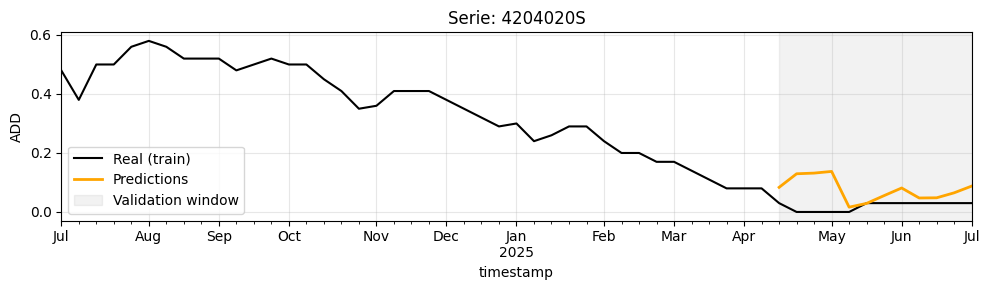

In [ ]:
plot_results(predictions_df=f_backtest_predictions, 
             n_val_weeks = 24, 
             real_serie=series_train,
             specific_series='4204020S',
             n_plots=2,
             col='ADD')

In [12]:
predictions = fit_predict(final_forecaster, 
                          series_dict_train, series_dict_test, 
                          exog_dict_train= exog_dict_train, exog_dict_test=exog_dict_test,
                          steps=8)
predictions

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.30000000000000004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.30000000000000004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30000000000000004
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current valu

,series_id,pred
2025-06-11,12000210,0.266799
2025-06-11,12000235,-1.070444
2025-06-11,12000236,-0.017972
2025-06-11,12000237,-1.190652
2025-06-11,12000249,-1.050011
...,...,...
2025-07-30,ZE-6-120,0.687719
2025-07-30,ZE-6-200,-1.126121
2025-07-30,ZE-6-250,-1.306281
2025-07-30,ZE-8-100P,-0.924944


In [13]:
f_predictions = format_results(predictions,
                               series_dict_test,
                               stats_train,
                               'v1')
f_predictions

Global Errors:
Scaled MAE global: 0.6877
MAE global: 4.5548


,timestamp,series_id,pred_z,y_z,abs_error_z,mae_z,pred,y,abs_error,mae
0,2025-06-11,12000210,0.266799,-0.200577,0.467375,0.397960,7.645501,6.440000e+00,1.205501,1.026459
1,2025-06-11,12000235,-1.070444,-1.090311,0.019867,0.215650,0.016923,-1.110223e-16,0.016923,0.183700
2,2025-06-11,12000236,-0.017972,-0.056446,0.038473,0.674685,2.767820,2.650000e+00,0.117820,2.066135
3,2025-06-11,12000237,-1.190652,-1.207425,0.016773,0.316483,0.014093,0.000000e+00,0.014093,0.265912
4,2025-06-11,12000249,-1.050011,-1.838635,0.788624,1.554253,3.146563,1.520000e+00,1.626563,3.205697
...,...,...,...,...,...,...,...,...,...,...
34307,2025-07-30,ZE-6-120,0.687719,-0.622037,1.309756,0.583612,1.841125,1.310000e+00,0.531125,0.236663
34308,2025-07-30,ZE-6-200,-1.126121,-2.723946,1.597825,1.245516,0.162361,8.000000e-02,0.082361,0.064201
34309,2025-07-30,ZE-6-250,-1.306281,-2.283644,0.977364,0.700740,0.034588,-1.387779e-17,0.034588,0.024799
34310,2025-07-30,ZE-8-100P,-0.924944,1.943509,2.868453,1.624435,7.873600,9.870000e+00,1.996400,1.130582


Serie: SRD6988
          y      pred  abs_error
4141   0.06  0.058034   0.001966
8430   0.06  0.055337   0.004663
12719  0.06  0.058304   0.001696
17008  0.06  0.057426   0.002574
21297  0.06  0.055763   0.004237
25586  0.06  0.053945   0.006055
29875  0.06  0.059053   0.000947
34164  0.06  0.060939   0.000939
MAE 0.0028847388930229164


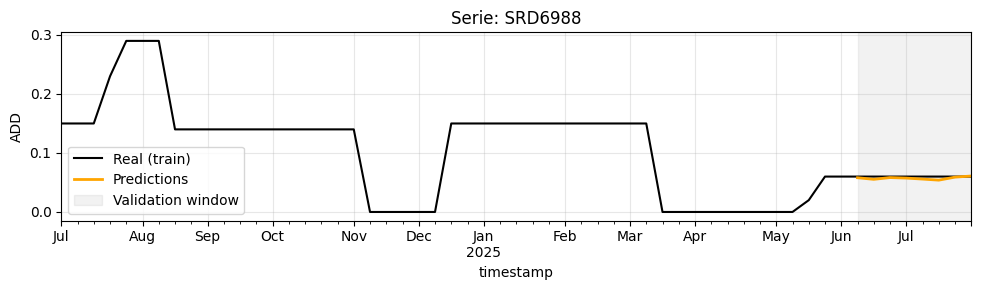

Serie: 504300L
           y       pred  abs_error
1483   28.40  29.997925   1.597925
5772   28.55  29.396207   0.846207
10061  29.58  28.904072   0.675928
14350  29.17  28.255808   0.914192
18639  29.21  27.764729   1.445271
22928  28.99  26.951183   2.038817
27217  28.09  27.155508   0.934492
31506  23.24  27.095263   3.855263
MAE 1.538511832569621


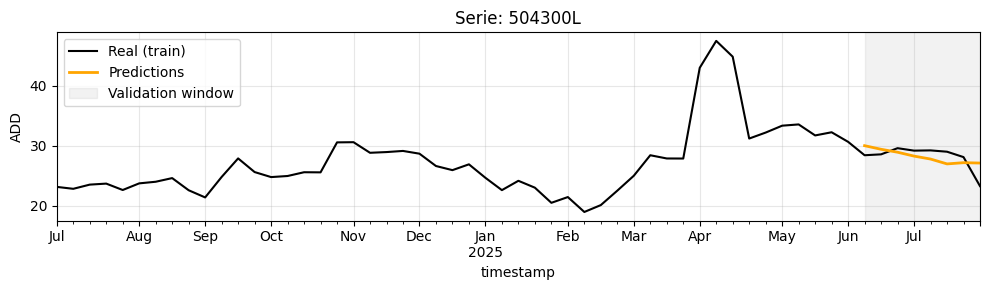

In [14]:
plot_results(predictions_df=f_predictions, 
             n_val_weeks = 8, 
             real_serie=series,
             #specific_series='4204020S',
             n_plots=2,
             col='ADD')

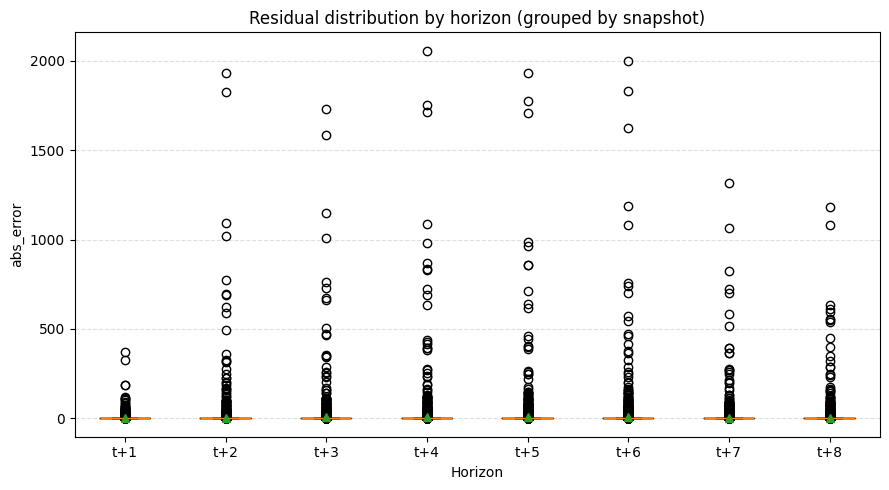

            n      mean    median        std
horizon                                     
t+1      4289  1.300665  0.033326  10.497993
t+2      4289  4.666522  0.059660  54.897786
t+3      4289  4.854906  0.078008  52.057771
t+4      4289  5.844508  0.104394  64.127285
t+5      4289  5.680375  0.110880  61.307751
t+6      4289  5.839605  0.117709  62.152611
t+7      4289  4.119716  0.158690  38.946147
t+8      4289  4.132064  0.168793  37.113921


In [15]:
residuals(f_predictions, error_col='abs_error')

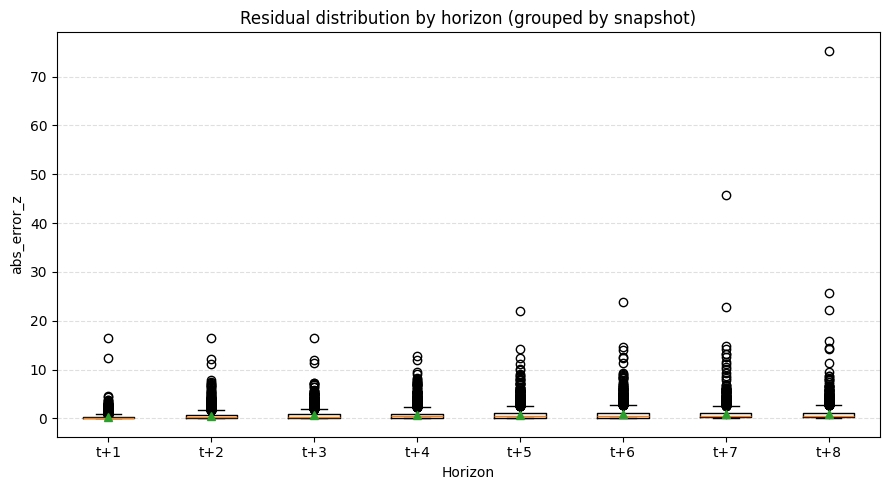

            n      mean    median       std
horizon                                    
t+1      4289  0.297326  0.122136  0.533066
t+2      4289  0.521535  0.238290  0.826145
t+3      4289  0.609272  0.309635  0.871584
t+4      4289  0.706131  0.385764  0.962807
t+5      4289  0.777542  0.441407  1.086882
t+6      4289  0.839071  0.493759  1.150622
t+7      4289  0.853047  0.513176  1.306701
t+8      4289  0.897695  0.548708  1.619393


In [16]:
residuals(f_predictions, error_col ='abs_error_z')

In [23]:
get_full_metrics(f_predictions)


Macro-MAE (original):
S              4289.000000
mean_macro        2.927644
std_between      27.889133
se_between        0.425850
tcrit             1.960517
ci_lo             2.092757
ci_hi             3.762531
dtype: float64

Macro-MAE (z):
S              4289.000000
mean_macro        0.524395
std_between       0.825442
se_between        0.012604
tcrit             1.960517
ci_lo             0.499684
ci_hi             0.549105
dtype: float64


In [27]:
series_preds = get_series_preds(f_predictions, series_test)
series_preds

,timestamp,series_id,pred,Brand,Resource ID
0,2025-07-09,12000210,7.240535,ARC ROYAL,EM_O01_NL
1,2025-07-09,12000235,0.000000,ARC ROYAL,EM_O01_NL
2,2025-07-09,12000236,1.405082,ARC ROYAL,EM_O01_NL
3,2025-07-09,12000237,0.000690,ARC ROYAL,EM_O02_NL
4,2025-07-09,12000249,0.210400,ARC ROYAL,EM_O02_NL
...,...,...,...,...,...
17151,2025-07-30,ZE-6-120,1.964354,IKAZUCHI ZERO,EM_O84_NL_CN
17152,2025-07-30,ZE-6-200,0.148905,IKAZUCHI ZERO,EM_O84_NL_CN
17153,2025-07-30,ZE-6-250,0.036231,IKAZUCHI ZERO,EM_O84_NL_CN
17154,2025-07-30,ZE-8-100P,9.022955,IKAZUCHI ZERO,EM_O84_NL_CN


In [28]:
split_preds = get_split_col(series_preds, demand_col="pred")
split_preds

,timestamp,Brand,Resource ID,split,series_id
0,2025-07-09,ADROIT,E00A,0.006462,ADROIT||E00A
1,2025-07-09,ADROIT,E00B,0.993538,ADROIT||E00B
2,2025-07-09,ANGIOGUARD,EM_L81,1.000000,ANGIOGUARD||EM_L81
3,2025-07-09,AQUATRACK,EM_L71,1.000000,AQUATRACK||EM_L71
4,2025-07-09,ARC ROYAL,EM_O01_NL,0.102077,ARC ROYAL||EM_O01_NL
...,...,...,...,...,...
551,2025-07-30,VISTA BRITE TIP (MODIFIED),A01,0.002429,VISTA BRITE TIP (MODIFIED)||A01
552,2025-07-30,VISTA BRITE TIP (MODIFIED),E00D,0.996678,VISTA BRITE TIP (MODIFIED)||E00D
553,2025-07-30,WIZDOM,EM_K60,0.992971,WIZDOM||EM_K60
554,2025-07-30,WIZDOM,EM_K60_NL,0.007029,WIZDOM||EM_K60_NL


In [ ]:
split_test = get_split_col(series_test)
split_test

,timestamp,Brand,Resource ID,split,series_id
0,2025-07-09,ADROIT,E00A,0.004532,ADROIT||E00A
1,2025-07-09,ADROIT,E00B,0.995468,ADROIT||E00B
2,2025-07-09,ANGIOGUARD,EM_L81,1.000000,ANGIOGUARD||EM_L81
3,2025-07-09,AQUATRACK,EM_L71,1.000000,AQUATRACK||EM_L71
4,2025-07-09,ARC ROYAL,EM_O01_NL,0.101198,ARC ROYAL||EM_O01_NL
...,...,...,...,...,...
551,2025-07-30,VISTA BRITE TIP (MODIFIED),A01,0.000000,VISTA BRITE TIP (MODIFIED)||A01
552,2025-07-30,VISTA BRITE TIP (MODIFIED),E00D,1.000000,VISTA BRITE TIP (MODIFIED)||E00D
553,2025-07-30,WIZDOM,EM_K60,1.000000,WIZDOM||EM_K60
554,2025-07-30,WIZDOM,EM_K60_NL,0.000000,WIZDOM||EM_K60_NL


In [38]:
final_df = split_preds[['timestamp', 'series_id', 'split']].copy()
final_df = final_df.rename(columns= {'split': 'pred'})

final_df = final_df.merge(
        split_test[["timestamp", "series_id", "split"]],
        on=["timestamp", "series_id"],
        how="left"
    ).rename(columns={'split': 'y'})

final_df["abs_error"] = (final_df["pred"] - final_df["y"]).abs()
    
mae_by_series = final_df.groupby('series_id')['abs_error'].mean()
final_df['mae'] = final_df['series_id'].map(mae_by_series)
final_df
    

,timestamp,series_id,pred,y,abs_error,mae
0,2025-07-09,ADROIT||E00A,0.006462,0.004532,0.001930,0.007806
1,2025-07-09,ADROIT||E00B,0.993538,0.995468,0.001930,0.007806
2,2025-07-09,ANGIOGUARD||EM_L81,1.000000,1.000000,0.000000,0.000000
3,2025-07-09,AQUATRACK||EM_L71,1.000000,1.000000,0.000000,0.000000
4,2025-07-09,ARC ROYAL||EM_O01_NL,0.102077,0.101198,0.000879,0.023599
...,...,...,...,...,...,...
551,2025-07-30,VISTA BRITE TIP (MODIFIED)||A01,0.002429,0.000000,0.002429,0.002510
552,2025-07-30,VISTA BRITE TIP (MODIFIED)||E00D,0.996678,1.000000,0.003322,0.002978
553,2025-07-30,WIZDOM||EM_K60,0.992971,1.000000,0.007029,0.004093
554,2025-07-30,WIZDOM||EM_K60_NL,0.007029,0.000000,0.007029,0.004093


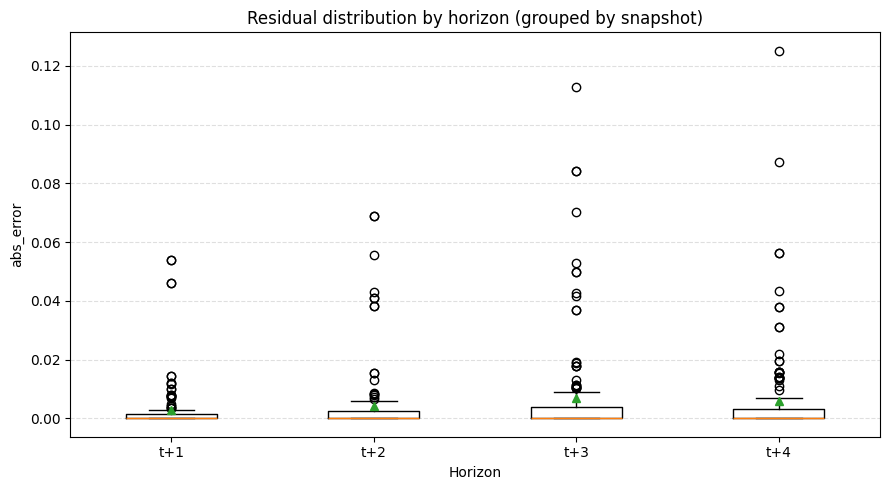

           n      mean  median       std
horizon                                 
t+1      139  0.002867     0.0  0.008713
t+2      139  0.004164     0.0  0.011944
t+3      139  0.006861     0.0  0.017577
t+4      139  0.006013     0.0  0.016069


In [ ]:
residuals(final_df)

In [56]:
mae_global = final_df["mae"].mean()
mae_global

np.float64(0.004976107479000522)

In [54]:
all_skus = df_full["series_id"].unique().tolist()
all_skus

['ADROIT||E00A',
 'ADROIT||E00B',
 'ANGIOGUARD||EM_L81',
 'AQUATRACK||EM_L71',
 'ARC ROYAL||EM_O01_NL',
 'ARC ROYAL||EM_O02',
 'ARC ROYAL||EM_O02_NL',
 'ATW WIRE||EM_L51',
 'ATW WIRE||EM_L51_NL',
 'ATW WIRE MARKER||EM_L51',
 'ATW WIRE MARKER||EM_L51_NL',
 'AVANTI PLUS||A00B',
 'AVANTI PLUS||A02B',
 'AVANTI PLUS||A02C',
 'AVIATOR PLUS||EM_D03',
 'BIOPSY FORCEPS STD||EM_F20',
 'BIPAL||EM_F10',
 'BLUE on AVIATOR||EM_D03',
 'BLUE on SLALOM||EM_D03',
 'BRITE TIP||A00A',
 'BRITE TIP||A02A',
 'BRITE TIP (MODIFIED)||A00B',
 'BRITE TIP (MODIFIED)||A02C',
 'BRITE TIP RADIANZ||T03',
 'BriteCross Support Catheters||EM_O92',
 'CATH EXT||C05',
 'CORPACK||C04B',
 'CORPACK (MODIFIED)||C04B',
 'ELITECROSS||EM_X12',
 'EMERALD||EM_L01',
 'EMERALD||EM_L01_NL',
 'ENROUTE||T02B',
 'EXOSEAL||V00',
 'FRONTRUNNER||X00',
 'GENESIS UNMOUNTED||EM_D03',
 'GENESIS UNMOUNTED||EM_U90',
 'GENESIS on PRO||EM_D01',
 'GENESIS on SLALOM||EM_D03',
 'HIGH FLOW||C04D',
 'IKAZUCHI ZERO||EM_O84_NL_CN',
 'INCRAFT||N03A',
 'INCR


Serie: ADROIT||E00A
            y      pred  abs_error
0    0.004532  0.006462   0.001930
139  0.004033  0.009098   0.005065
278  0.003920  0.014428   0.010508
417  0.004038  0.017760   0.013723
MAE 0.007806


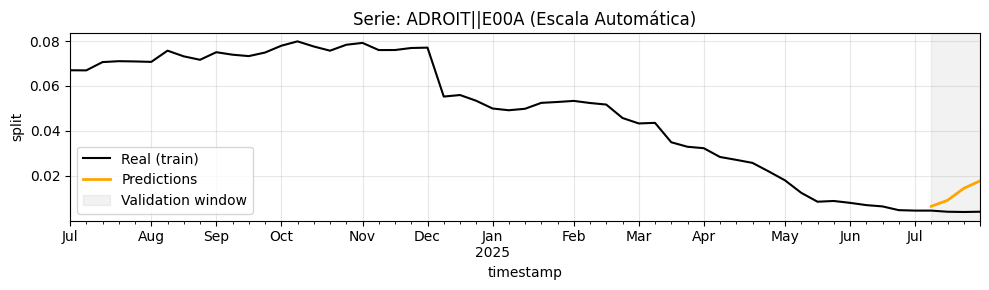

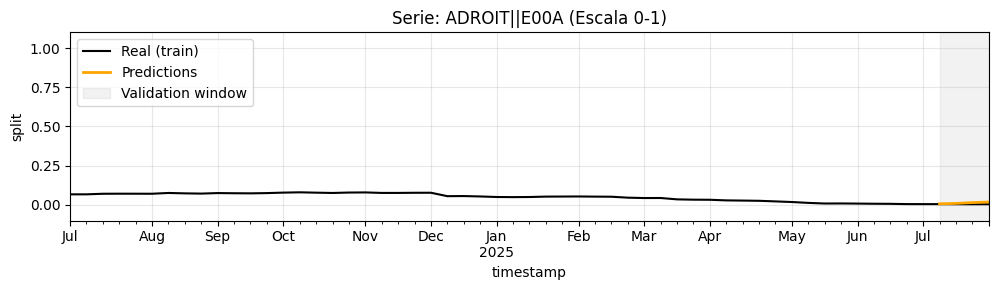


Serie: ADROIT||E00B
            y      pred  abs_error
1    0.995468  0.993538   0.001930
140  0.995967  0.990902   0.005065
279  0.996080  0.985572   0.010508
418  0.995962  0.982240   0.013723
MAE 0.007806


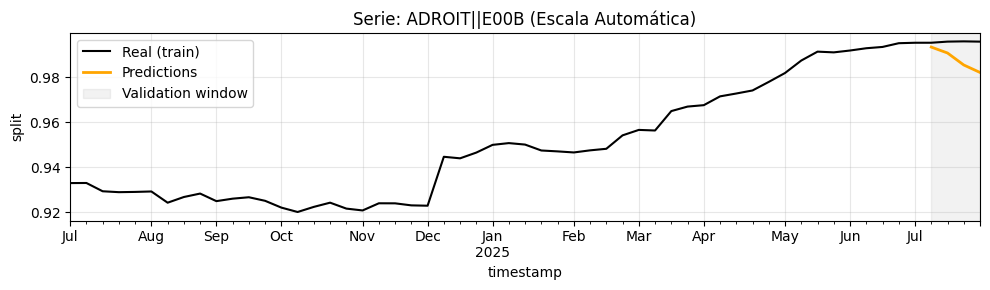

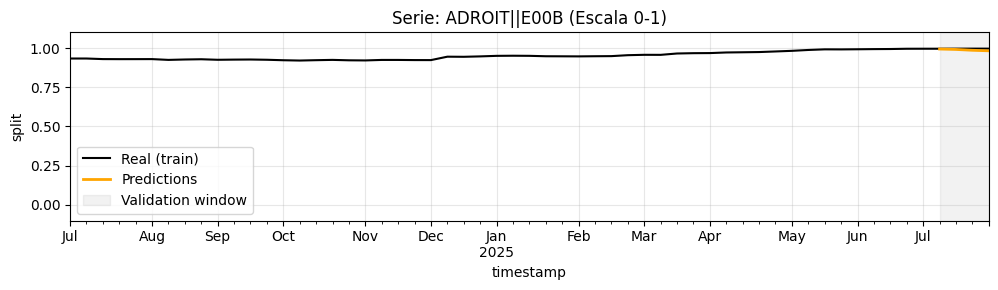


Serie: ANGIOGUARD||EM_L81
       y  pred  abs_error
2    1.0   1.0        0.0
141  1.0   1.0        0.0
280  1.0   1.0        0.0
419  1.0   1.0        0.0
MAE 0.000000


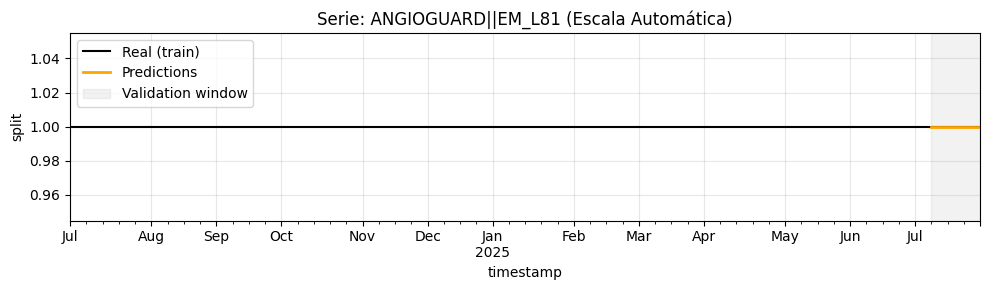

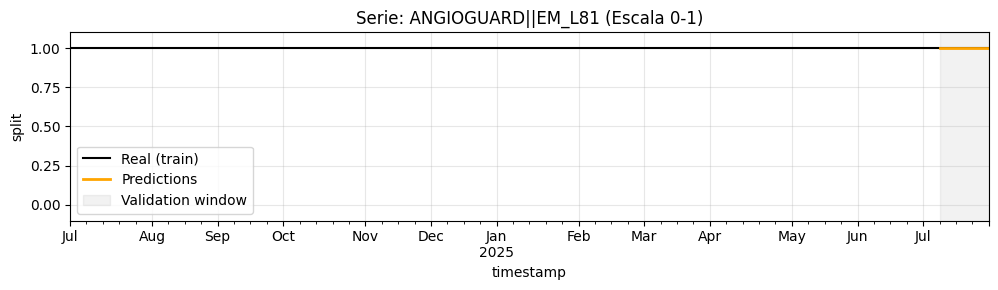


Serie: AQUATRACK||EM_L71
       y  pred  abs_error
3    1.0   1.0        0.0
142  1.0   1.0        0.0
281  1.0   1.0        0.0
420  1.0   1.0        0.0
MAE 0.000000


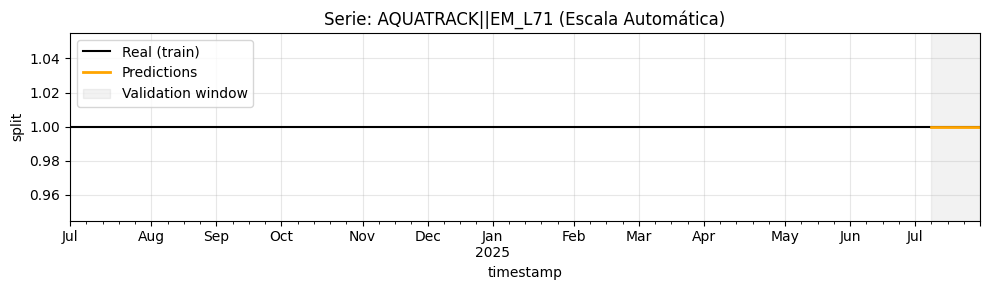

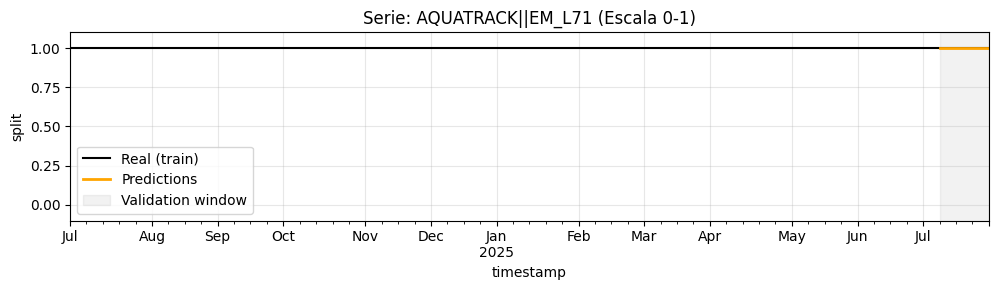


Serie: ARC ROYAL||EM_O01_NL
            y      pred  abs_error
4    0.101198  0.102077   0.000879
143  0.090374  0.103263   0.012889
282  0.071060  0.113717   0.042657
421  0.077606  0.115579   0.037972
MAE 0.023599


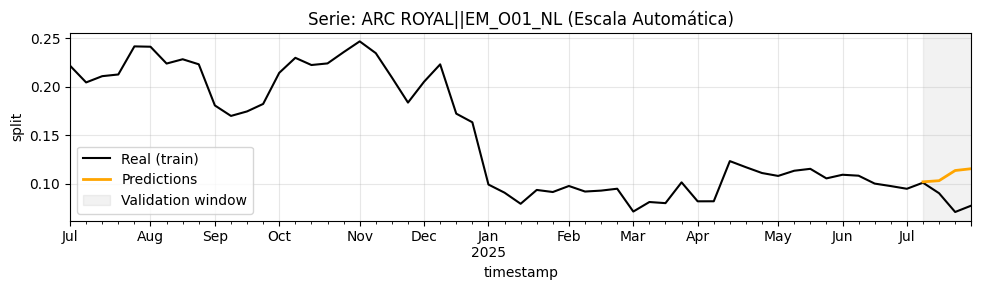

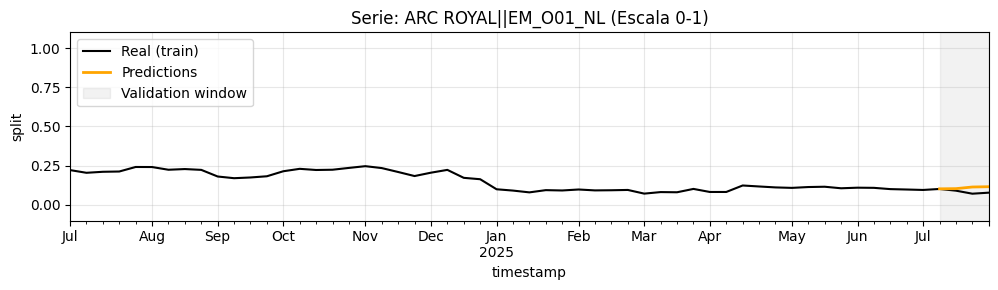


Serie: ARC ROYAL||EM_O02
            y      pred  abs_error
5    0.302728  0.303842   0.001114
144  0.252586  0.295481   0.042895
283  0.212242  0.282547   0.070305
422  0.191411  0.278639   0.087228
MAE 0.050385


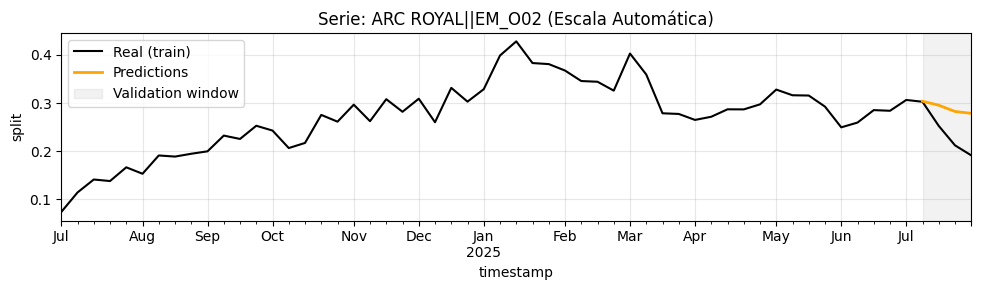

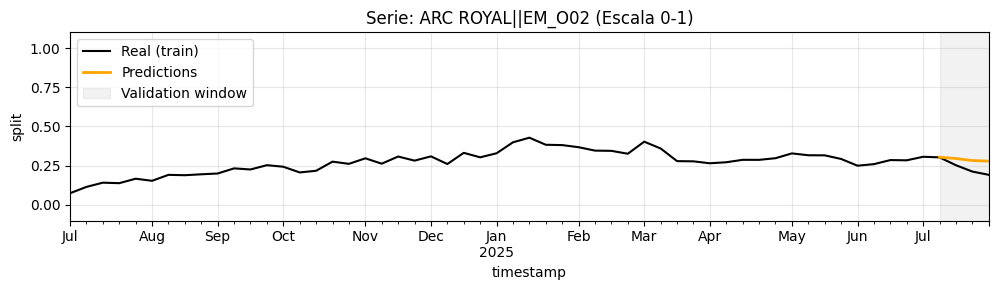


Serie: ARC ROYAL||EM_O02_NL
            y      pred  abs_error
6    0.596073  0.594080   0.001993
145  0.657041  0.601257   0.055784
284  0.716698  0.603737   0.112961
423  0.730983  0.605783   0.125200
MAE 0.073985


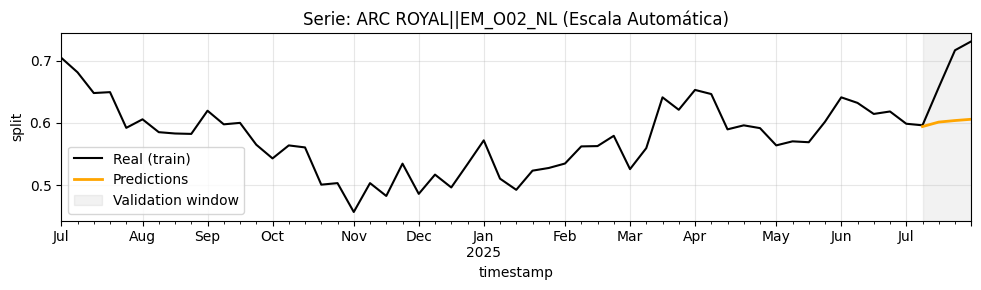

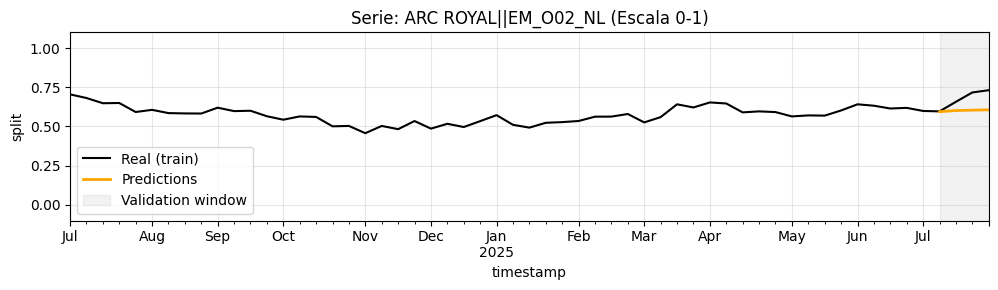


Serie: ATW WIRE||EM_L51
            y      pred  abs_error
7    0.999594  0.999514   0.000080
146  0.999619  0.999554   0.000065
285  0.999499  0.999237   0.000262
424  0.999568  0.999109   0.000459
MAE 0.000217


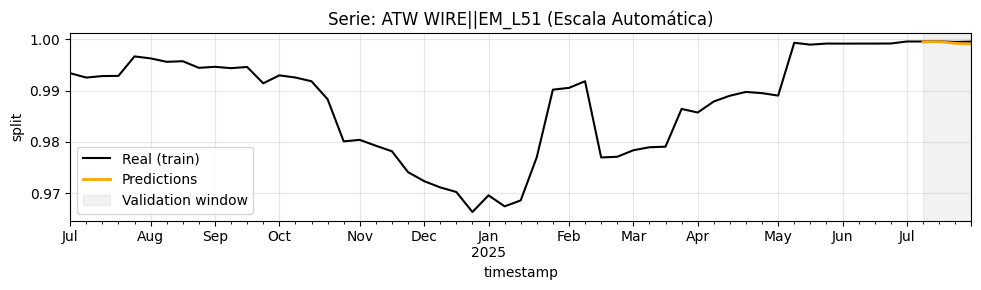

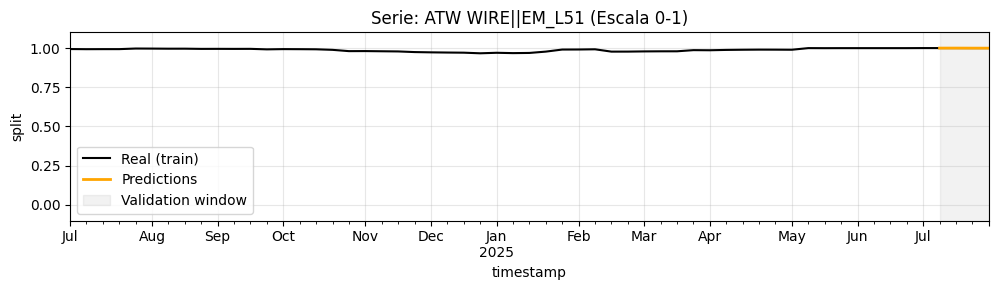


Serie: ATW WIRE||EM_L51_NL
            y      pred  abs_error
8    0.000406  0.000486   0.000080
147  0.000381  0.000446   0.000065
286  0.000501  0.000763   0.000262
425  0.000432  0.000891   0.000459
MAE 0.000217


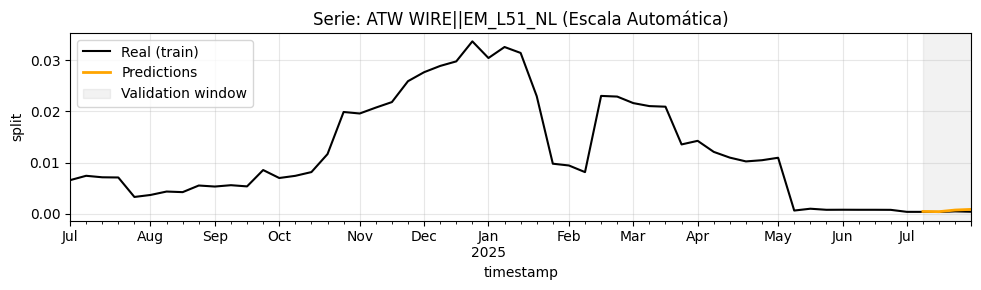

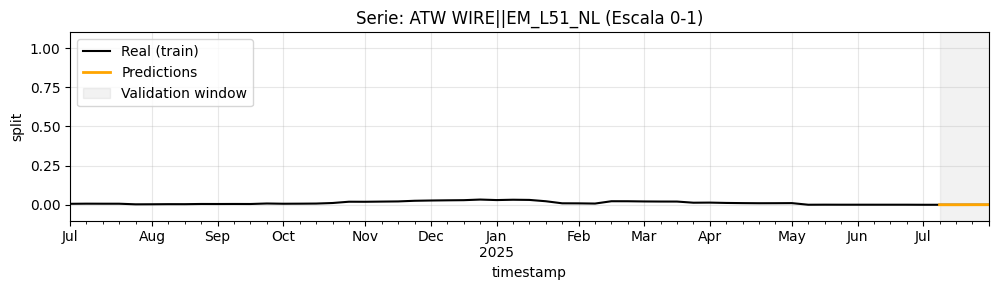


Serie: ATW WIRE MARKER||EM_L51
       y      pred  abs_error
9    1.0  0.999963   0.000037
148  1.0  0.999947   0.000053
287  1.0  0.999889   0.000111
426  1.0  0.999833   0.000167
MAE 0.000092


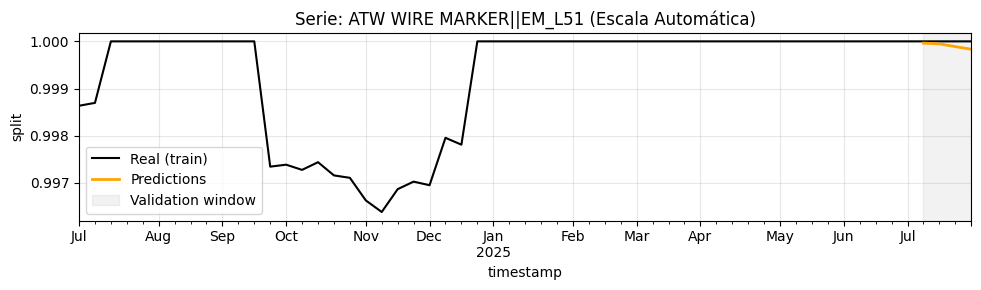

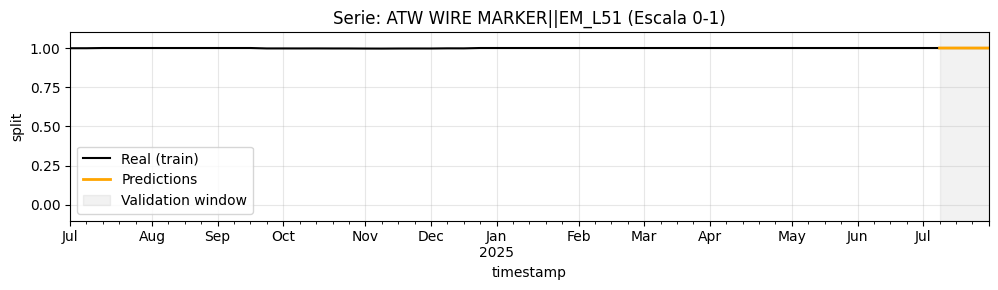


Serie: ATW WIRE MARKER||EM_L51_NL
       y      pred  abs_error
10   0.0  0.000037   0.000037
149  0.0  0.000053   0.000053
288  0.0  0.000111   0.000111
427  0.0  0.000167   0.000167
MAE 0.000092


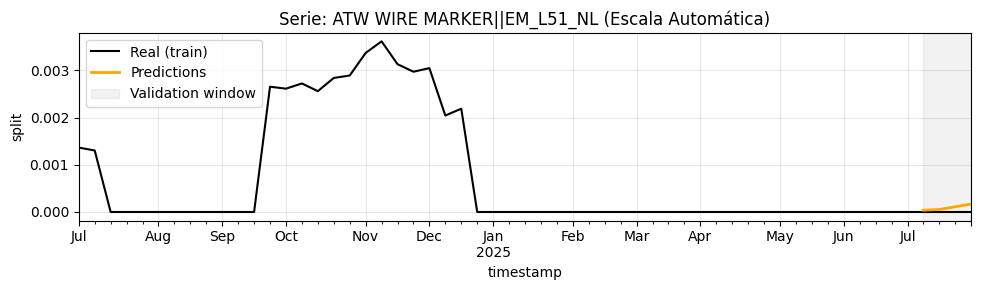

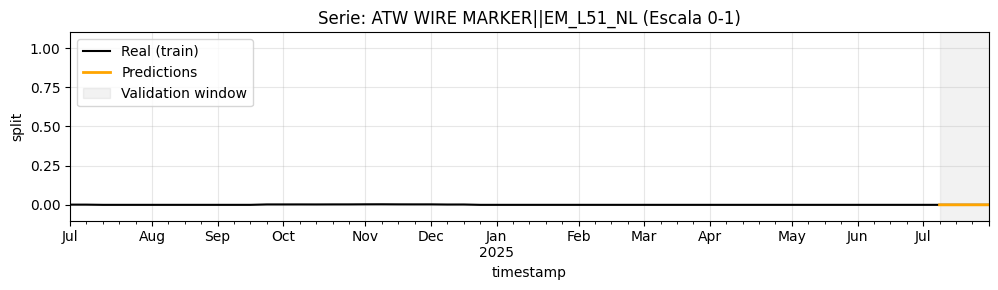


Serie: AVANTI PLUS||A00B
            y      pred  abs_error
11   0.014227  0.014035   0.000192
150  0.014022  0.014261   0.000239
289  0.015969  0.014786   0.001183
428  0.015682  0.014835   0.000846
MAE 0.000615


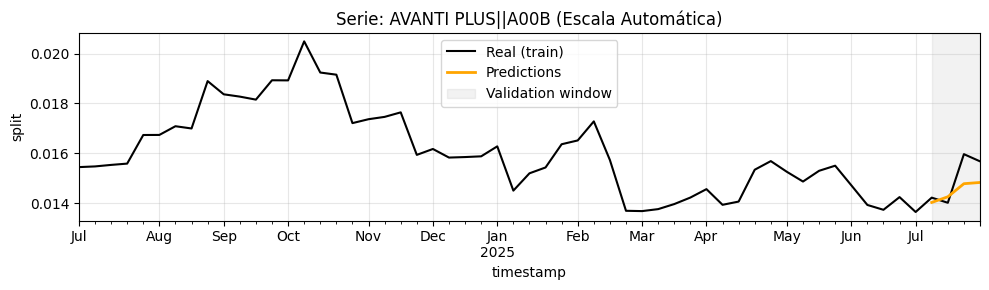

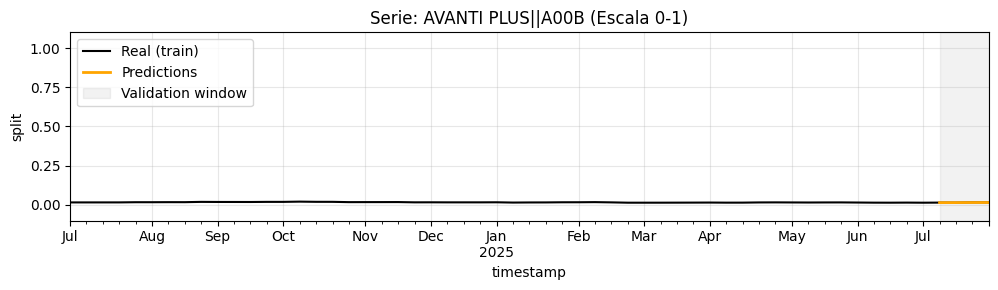


Serie: AVANTI PLUS||A02B
            y      pred  abs_error
12   0.232230  0.217959   0.014271
151  0.226759  0.218168   0.008591
290  0.218484  0.211081   0.007403
429  0.225330  0.212123   0.013207
MAE 0.010868


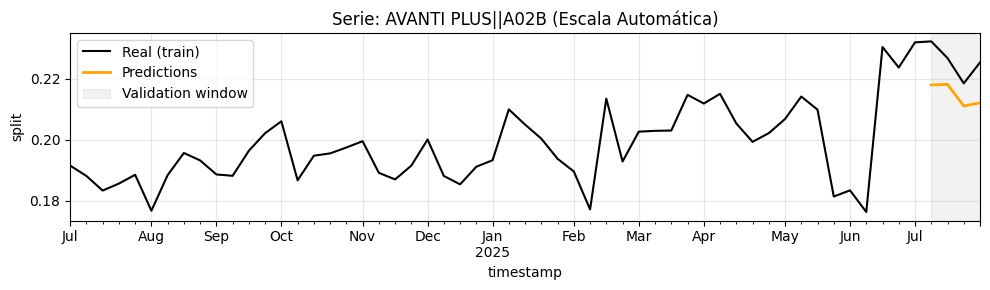

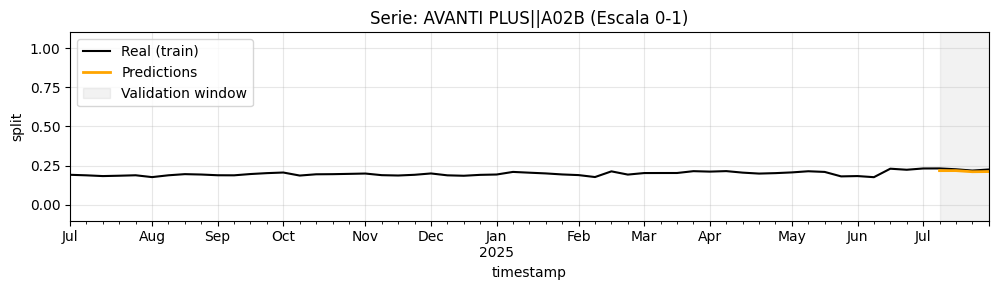


Serie: AVANTI PLUS||A02C
            y      pred  abs_error
13   0.753543  0.768006   0.014463
152  0.759219  0.767571   0.008352
291  0.765547  0.774133   0.008586
430  0.758989  0.773042   0.014054
MAE 0.011364


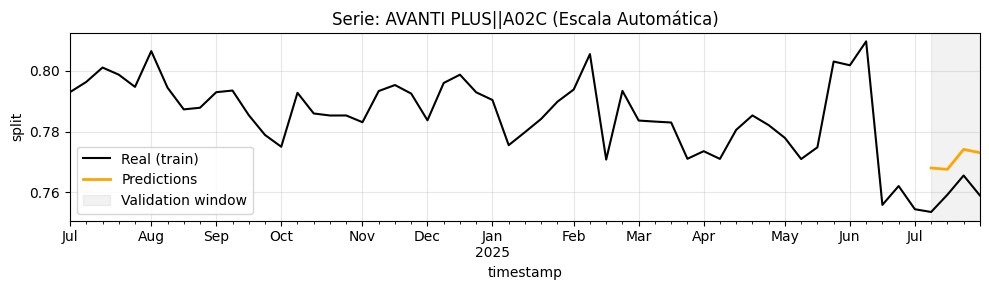

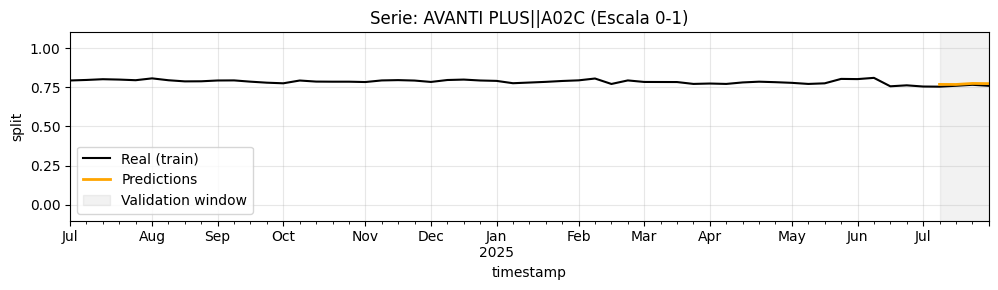


Serie: AVIATOR PLUS||EM_D03
       y  pred  abs_error
14   1.0   1.0        0.0
153  1.0   1.0        0.0
292  1.0   1.0        0.0
431  1.0   1.0        0.0
MAE 0.000000


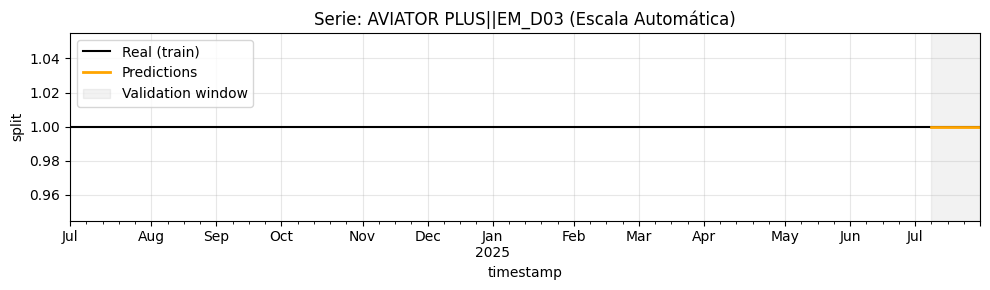

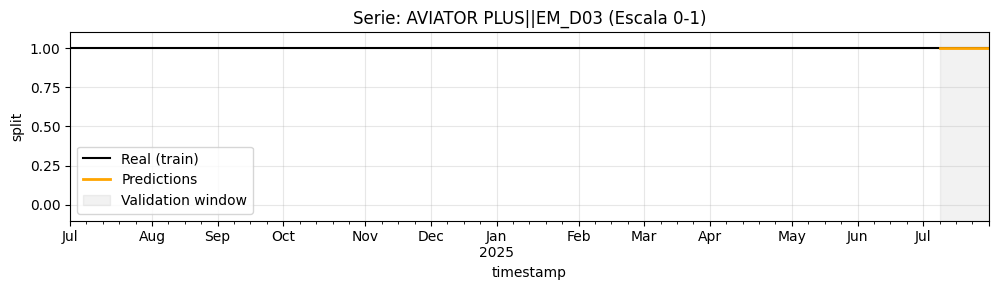


Serie: BIOPSY FORCEPS STD||EM_F20
       y  pred  abs_error
15   1.0   1.0        0.0
154  1.0   1.0        0.0
293  1.0   1.0        0.0
432  1.0   1.0        0.0
MAE 0.000000


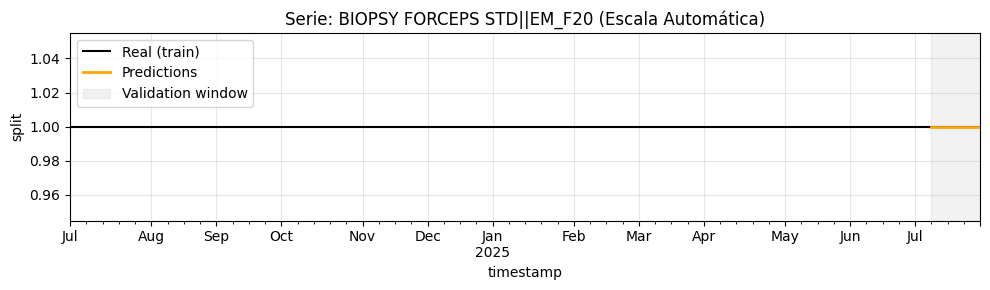

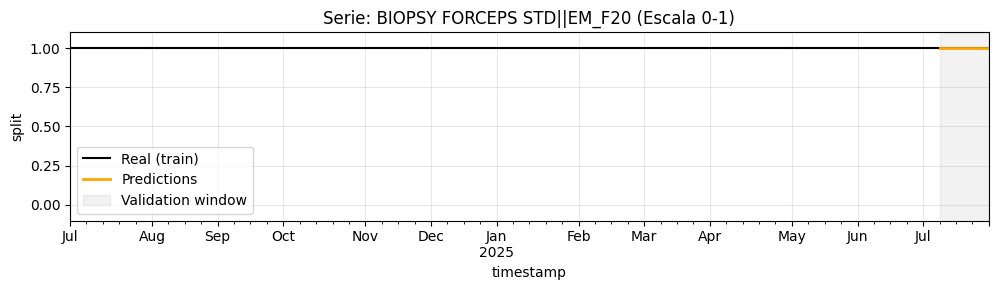


Serie: BIPAL||EM_F10
       y  pred  abs_error
16   1.0   1.0        0.0
155  1.0   1.0        0.0
294  1.0   1.0        0.0
433  1.0   1.0        0.0
MAE 0.000000


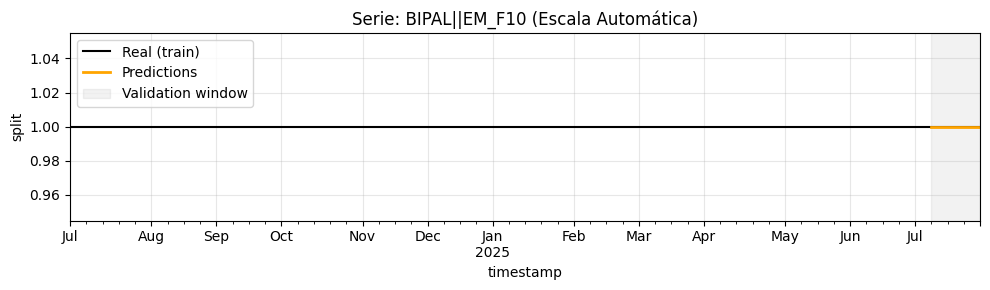

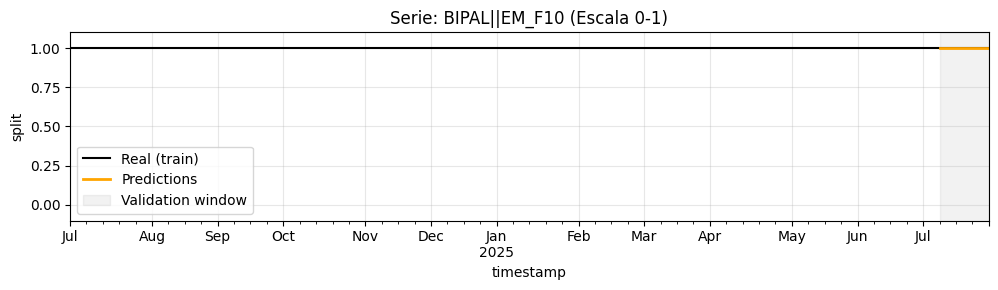


Serie: BLUE on AVIATOR||EM_D03
       y  pred  abs_error
17   1.0   1.0        0.0
156  1.0   1.0        0.0
295  1.0   1.0        0.0
434  1.0   1.0        0.0
MAE 0.000000


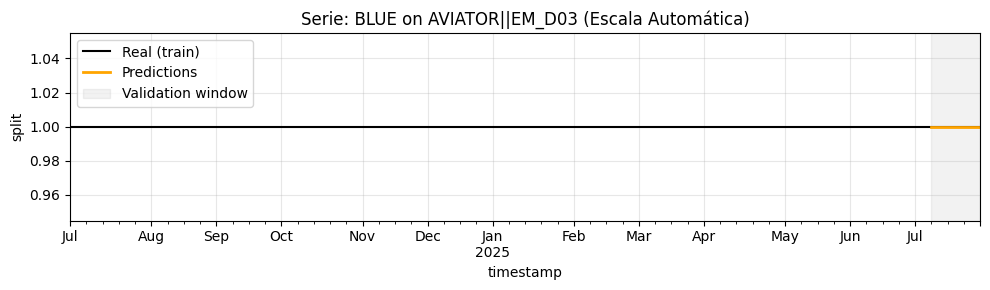

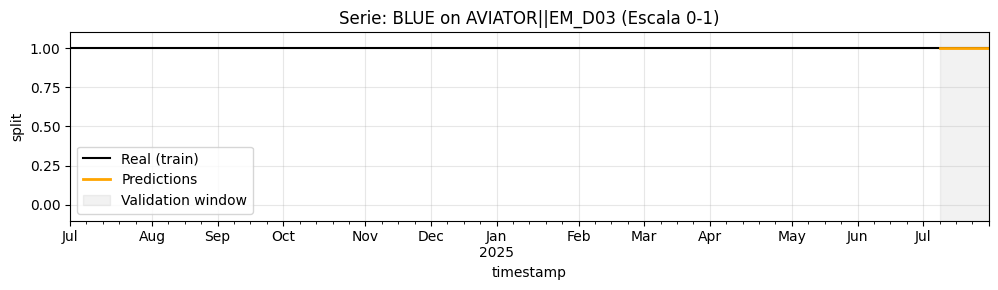


Serie: BLUE on SLALOM||EM_D03
       y  pred  abs_error
18   1.0   1.0        0.0
157  1.0   1.0        0.0
296  1.0   1.0        0.0
435  1.0   1.0        0.0
MAE 0.000000


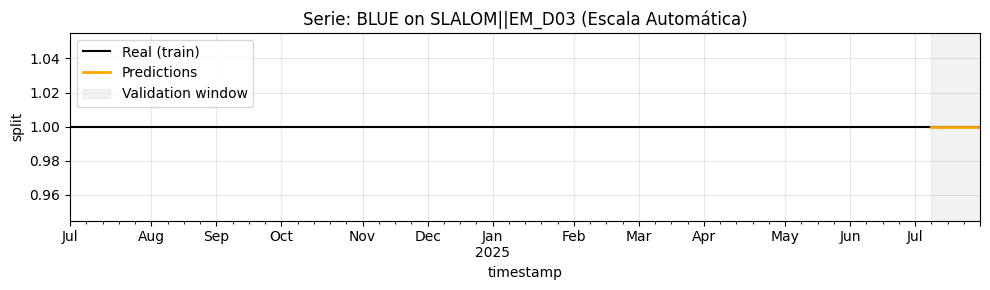

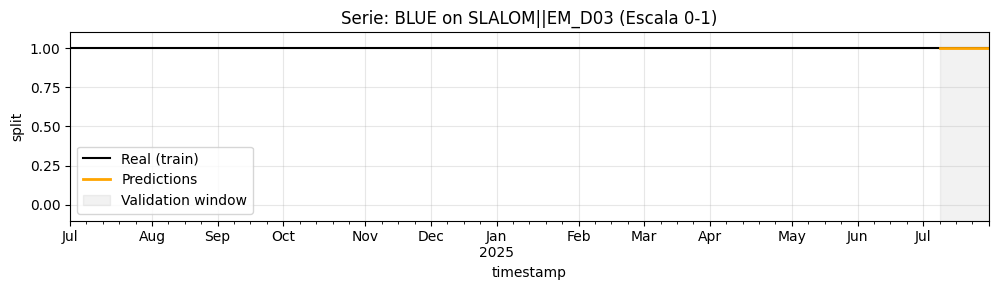


Serie: BRITE TIP||A00A
            y      pred  abs_error
19   0.271136  0.267481   0.003655
158  0.269281  0.267429   0.001852
297  0.270696  0.267562   0.003134
436  0.267288  0.267307   0.000019
MAE 0.002165


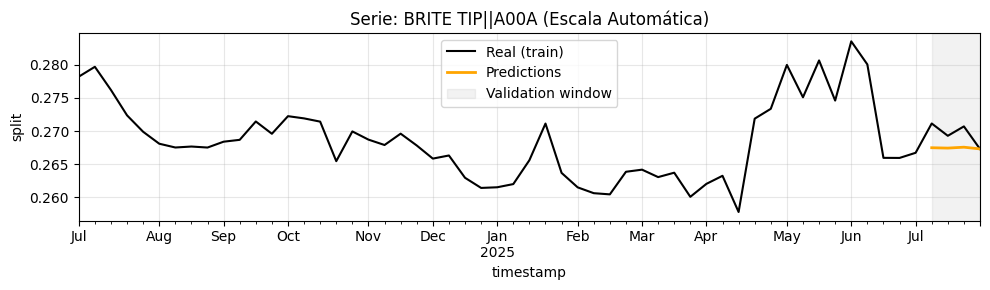

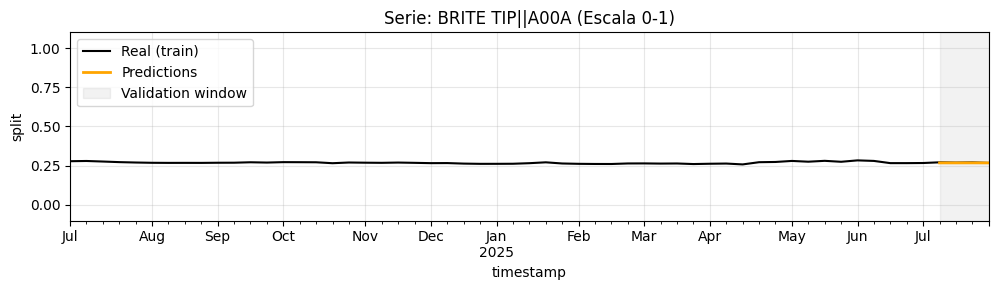


Serie: BRITE TIP||A02A
            y      pred  abs_error
20   0.728864  0.732519   0.003655
159  0.730719  0.732571   0.001852
298  0.729304  0.732438   0.003134
437  0.732712  0.732693   0.000019
MAE 0.002165


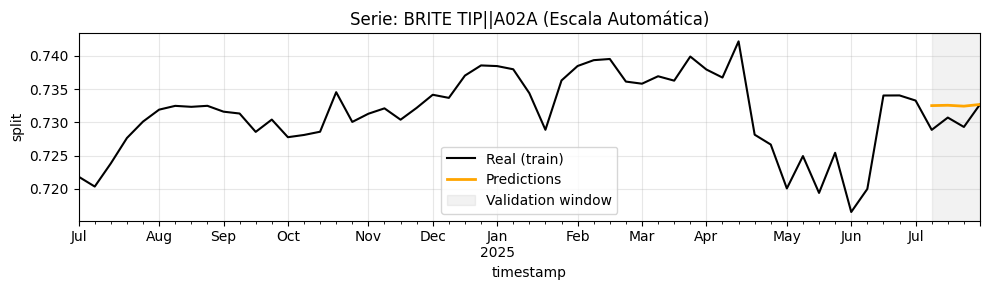

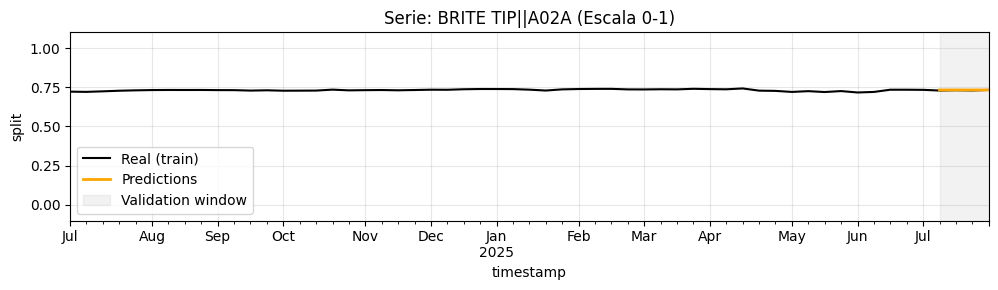


Serie: BRITE TIP (MODIFIED)||A00B
            y      pred  abs_error
21   0.973289  0.919492   0.053797
160  0.974277  0.905367   0.068909
299  0.974882  0.890814   0.084068
438  0.863905  0.879815   0.015910
MAE 0.055671


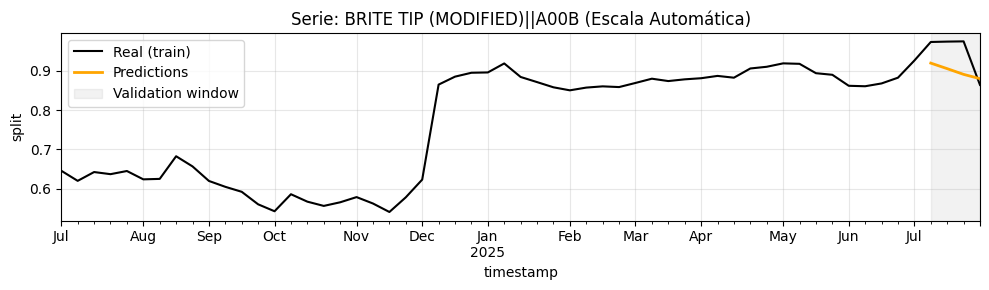

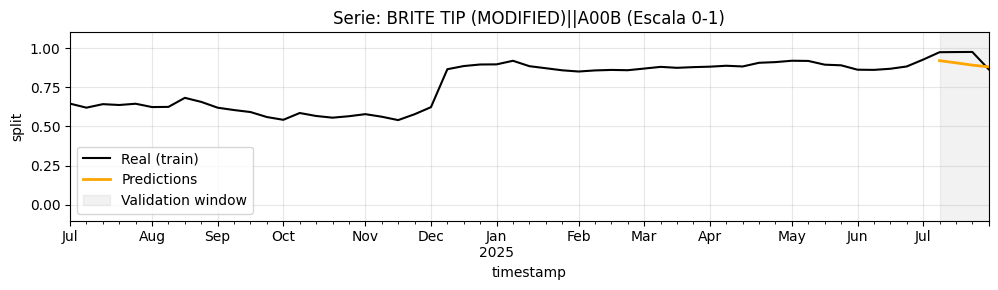


Serie: BRITE TIP (MODIFIED)||A02C
            y      pred  abs_error
22   0.026711  0.080508   0.053797
161  0.025723  0.094633   0.068909
300  0.025118  0.109186   0.084068
439  0.136095  0.120185   0.015910
MAE 0.055671


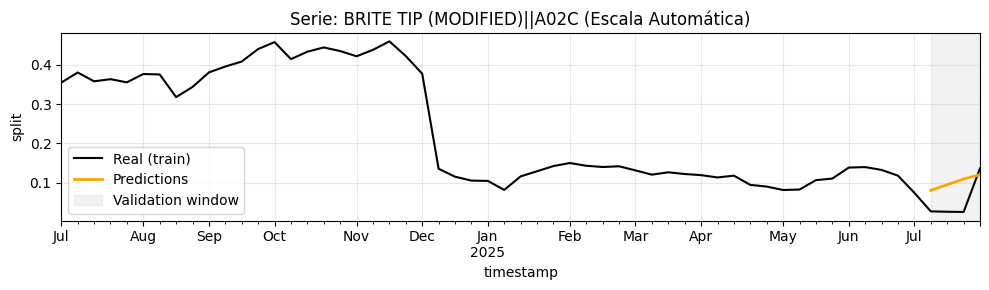

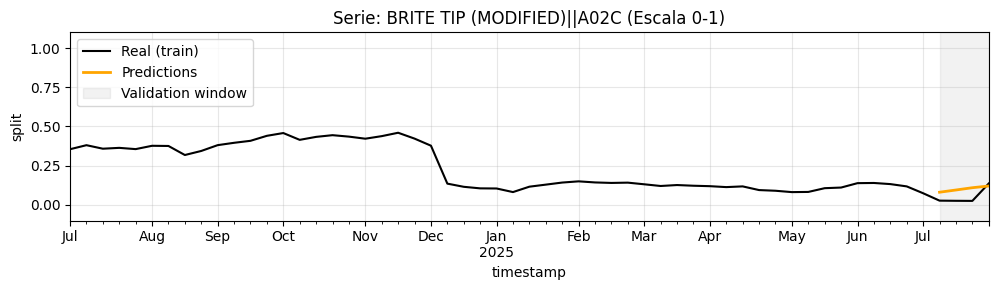


Serie: BRITE TIP RADIANZ||T03
       y  pred  abs_error
23   1.0   1.0        0.0
162  1.0   1.0        0.0
301  1.0   1.0        0.0
440  1.0   1.0        0.0
MAE 0.000000


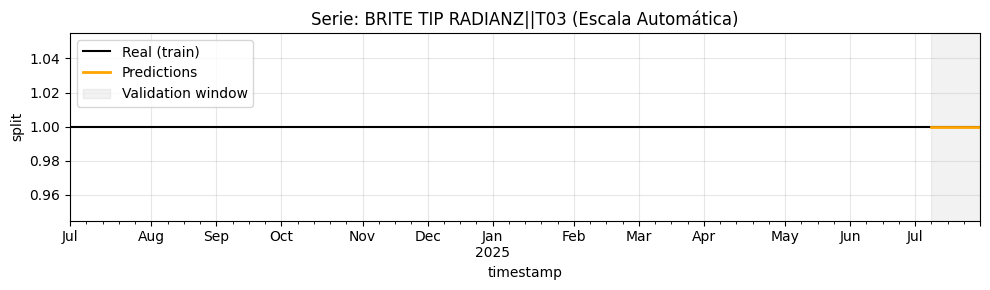

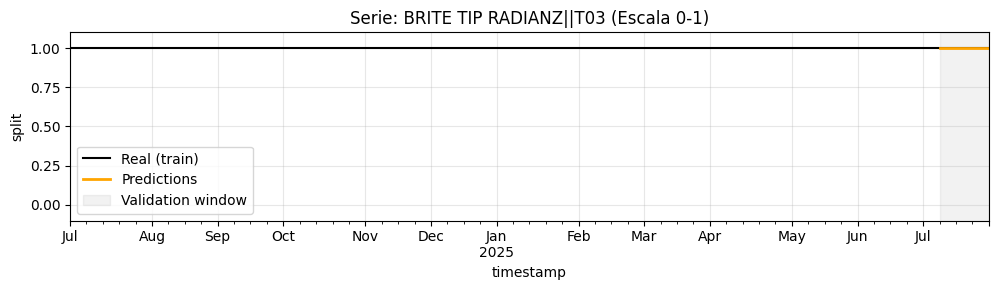


Serie: BriteCross Support Catheters||EM_O92
       y  pred  abs_error
24   1.0   1.0        0.0
163  1.0   1.0        0.0
302  1.0   1.0        0.0
441  1.0   1.0        0.0
MAE 0.000000


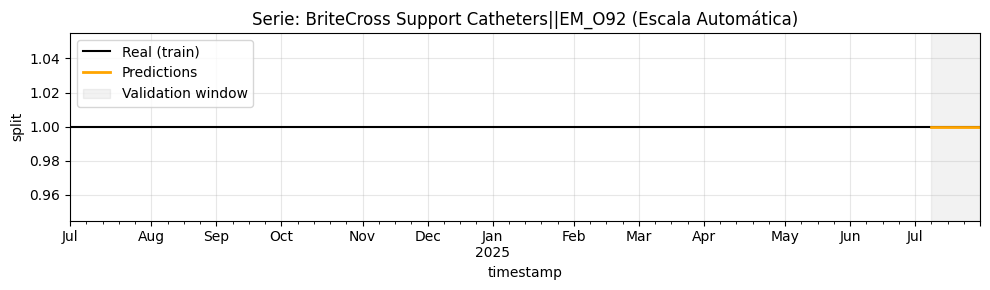

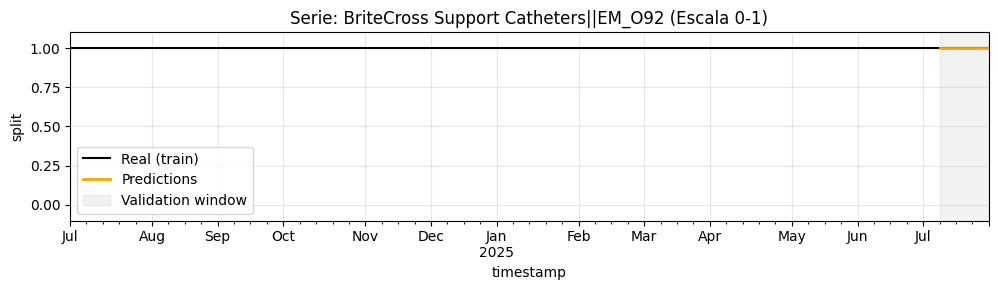


Serie: CATH EXT||C05
       y  pred  abs_error
25   1.0   1.0        0.0
164  1.0   1.0        0.0
303  1.0   1.0        0.0
442  1.0   1.0        0.0
MAE 0.000000


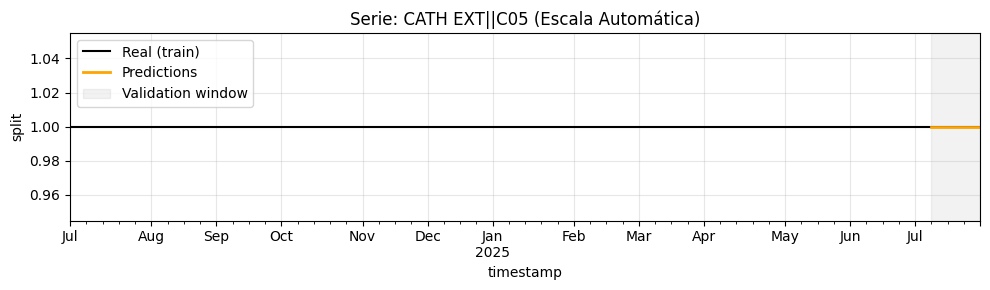

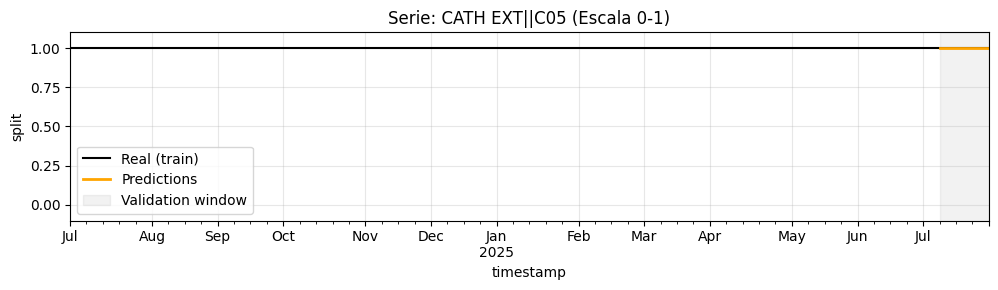


Serie: CORPACK||C04B
       y  pred  abs_error
26   1.0   1.0        0.0
165  1.0   1.0        0.0
304  1.0   1.0        0.0
443  1.0   1.0        0.0
MAE 0.000000


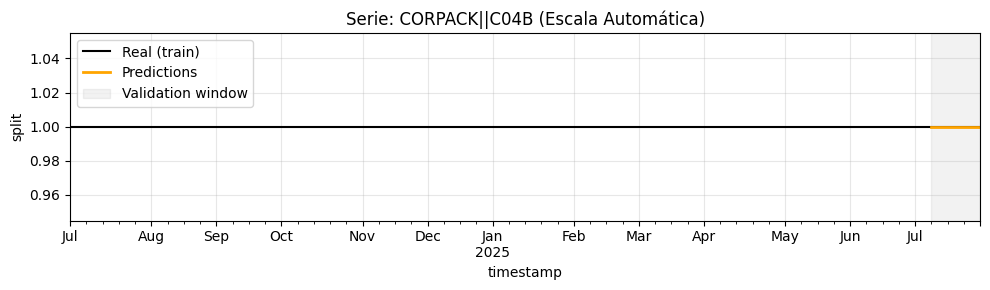

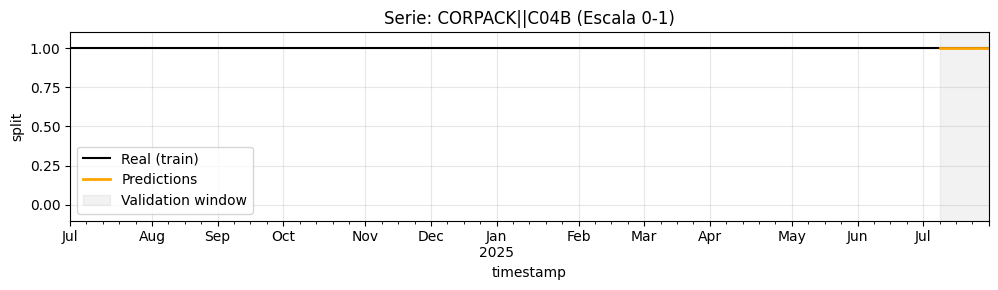


Serie: CORPACK (MODIFIED)||C04B
       y  pred  abs_error
27   1.0   1.0        0.0
166  1.0   1.0        0.0
305  1.0   1.0        0.0
444  1.0   1.0        0.0
MAE 0.000000


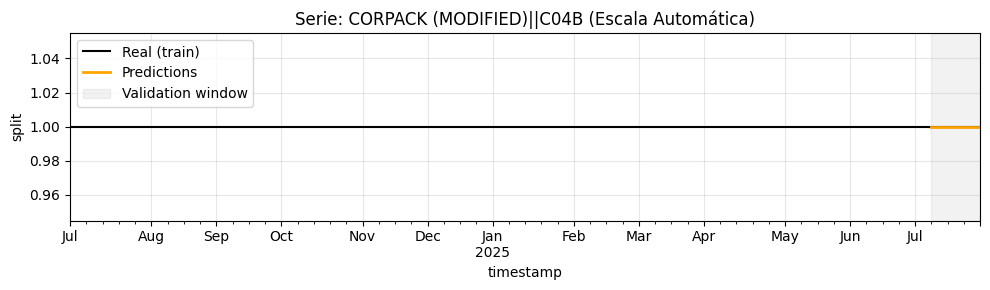

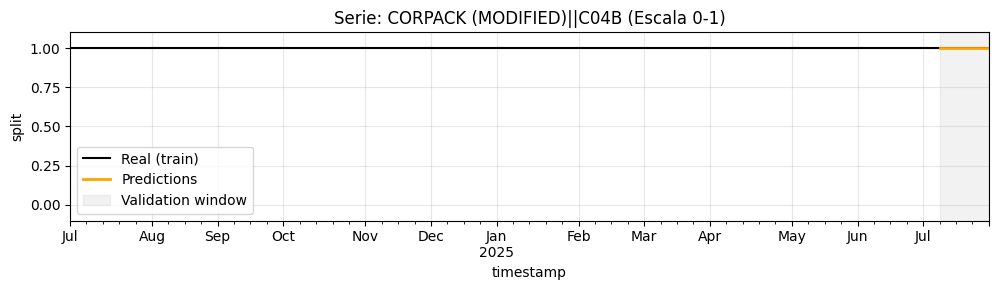


Serie: ELITECROSS||EM_X12
       y  pred  abs_error
28   1.0   1.0        0.0
167  1.0   1.0        0.0
306  1.0   1.0        0.0
445  1.0   1.0        0.0
MAE 0.000000


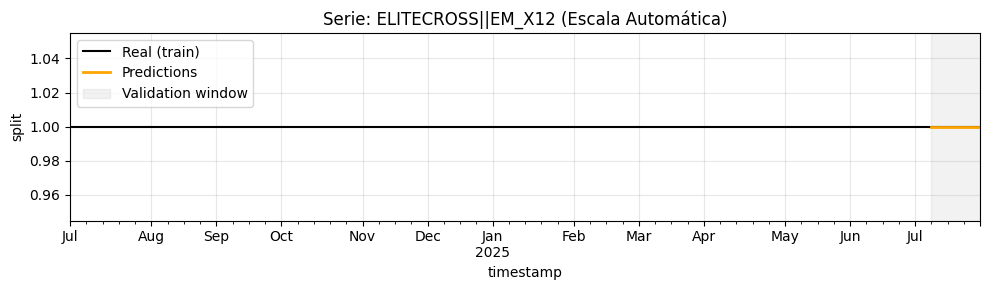

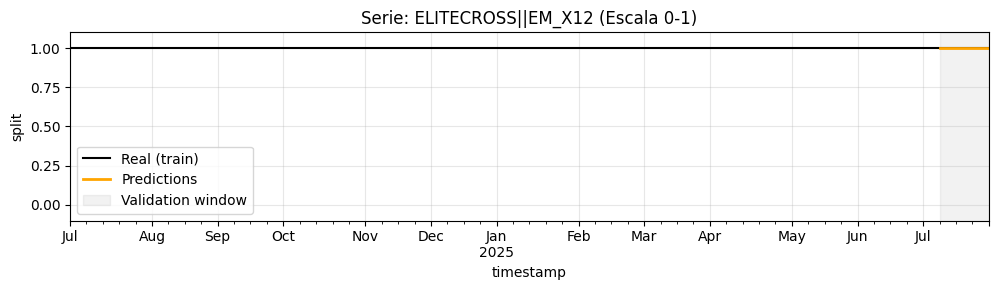


Serie: EMERALD||EM_L01
            y      pred  abs_error
29   0.854299  0.850210   0.004089
168  0.850974  0.848447   0.002527
307  0.840776  0.844751   0.003975
446  0.842447  0.844366   0.001919
MAE 0.003127


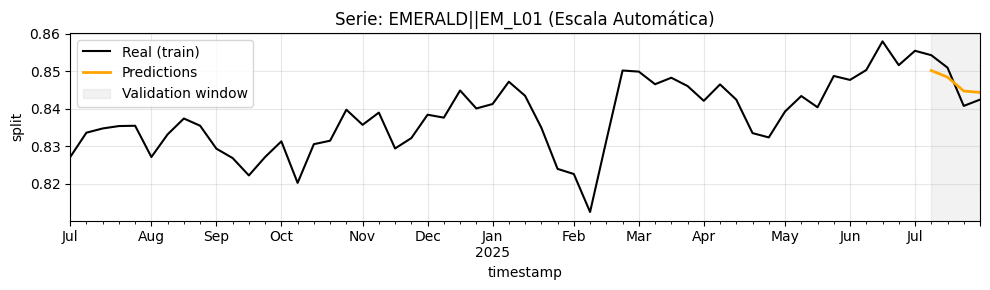

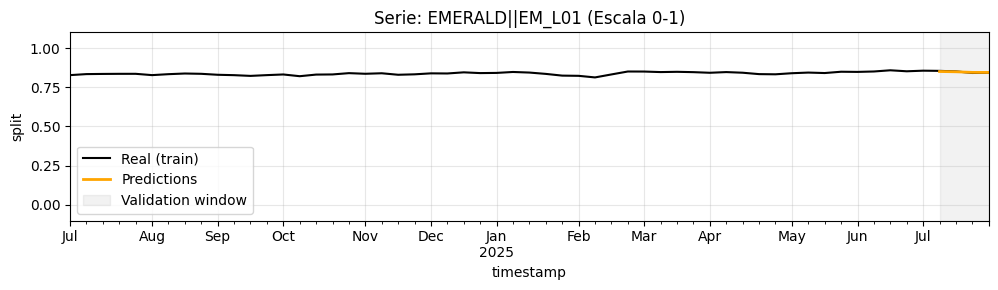


Serie: EMERALD||EM_L01_NL
            y      pred  abs_error
30   0.145701  0.149790   0.004089
169  0.149026  0.151553   0.002527
308  0.159224  0.155249   0.003975
447  0.157553  0.155634   0.001919
MAE 0.003127


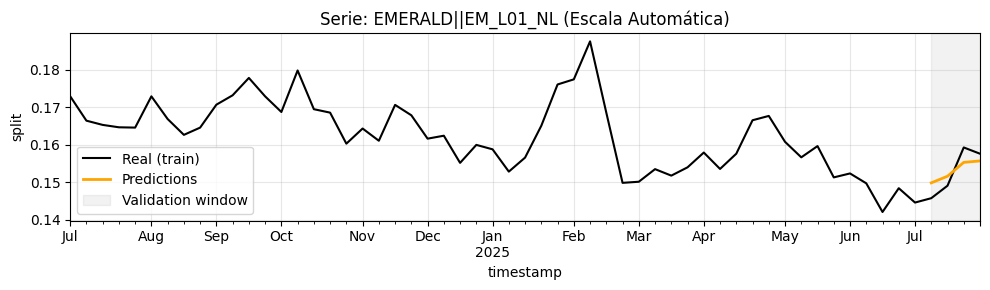

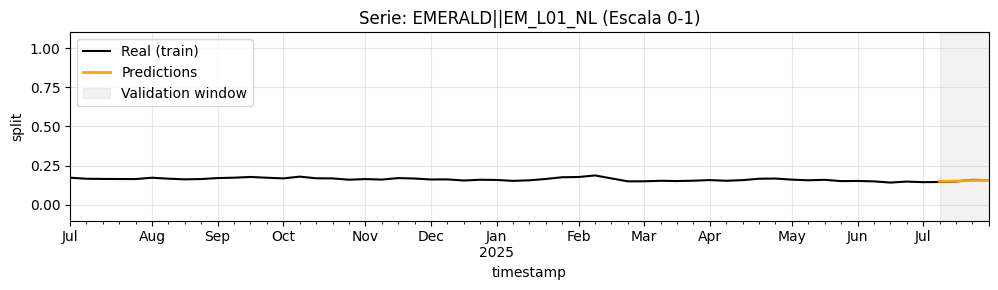


Serie: ENROUTE||T02B
       y  pred  abs_error
31   1.0   1.0        0.0
170  1.0   1.0        0.0
309  1.0   1.0        0.0
448  1.0   1.0        0.0
MAE 0.000000


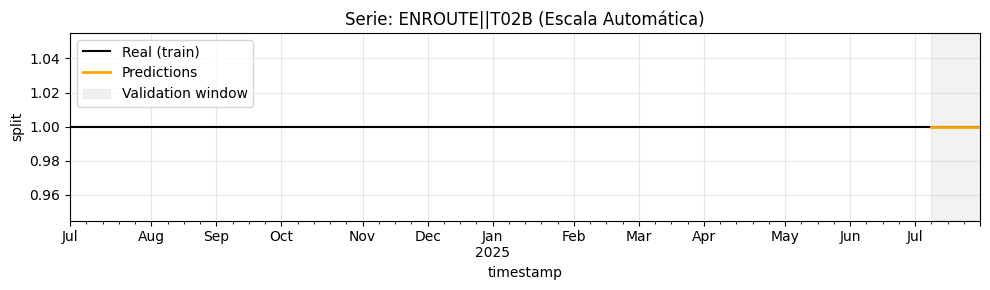

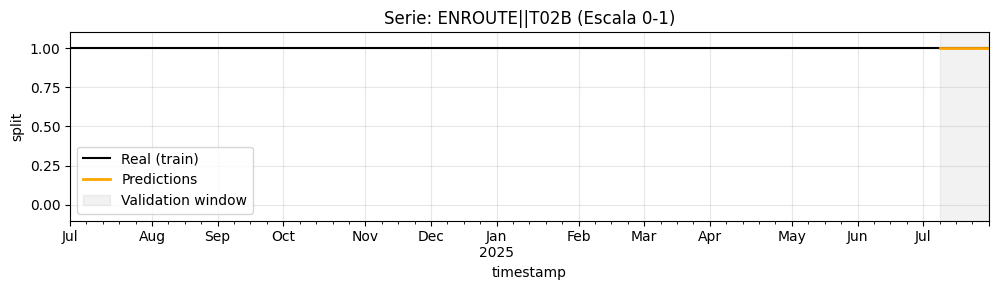


Serie: EXOSEAL||V00
       y  pred  abs_error
32   1.0   1.0        0.0
171  1.0   1.0        0.0
310  1.0   1.0        0.0
449  1.0   1.0        0.0
MAE 0.000000


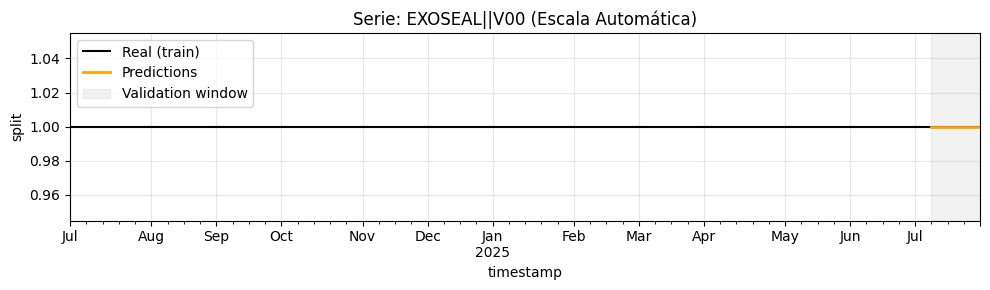

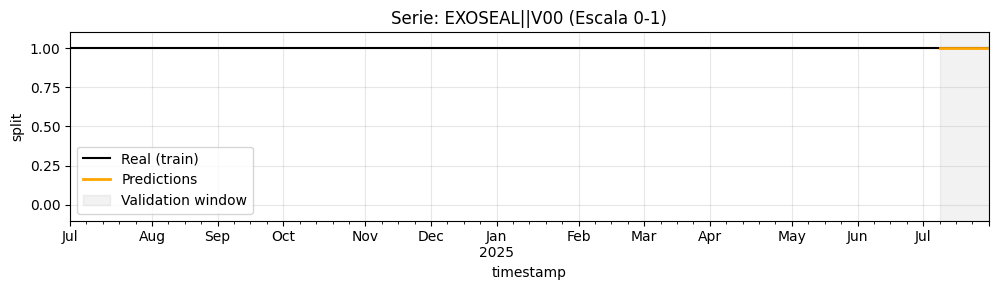


Serie: FRONTRUNNER||X00
       y  pred  abs_error
33   1.0   1.0        0.0
172  1.0   1.0        0.0
311  1.0   1.0        0.0
450  1.0   1.0        0.0
MAE 0.000000


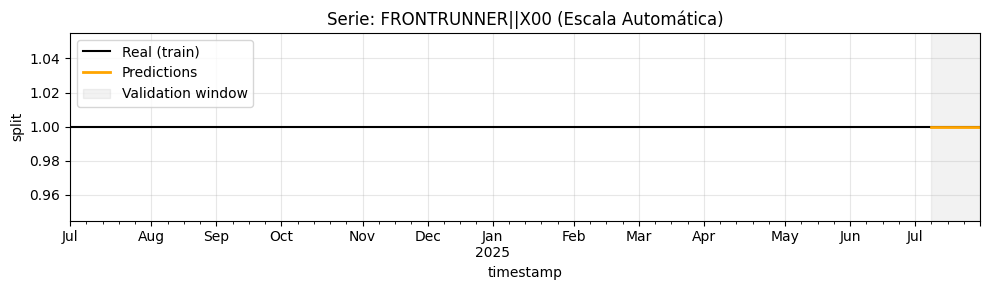

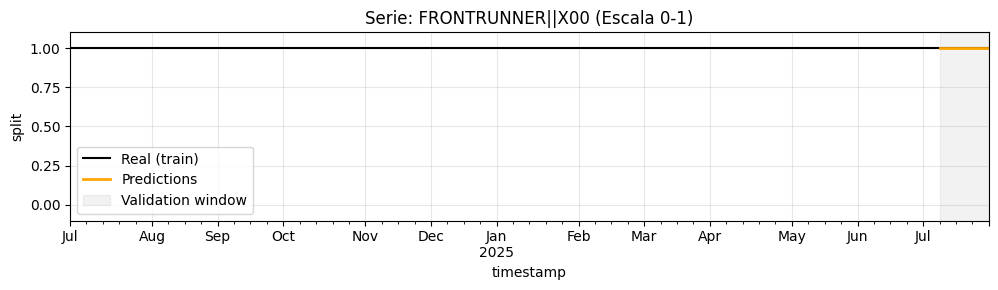


Serie: GENESIS UNMOUNTED||EM_D03
            y      pred  abs_error
34   0.344231  0.334194   0.010036
173  0.324165  0.330008   0.005843
312  0.267477  0.317437   0.049959
451  0.251170  0.307607   0.056437
MAE 0.030569


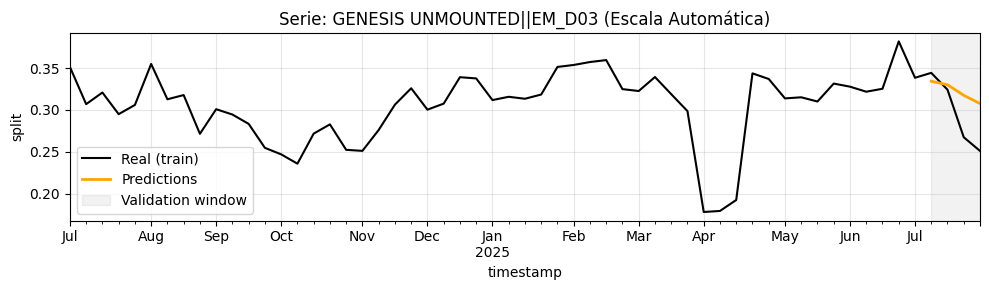

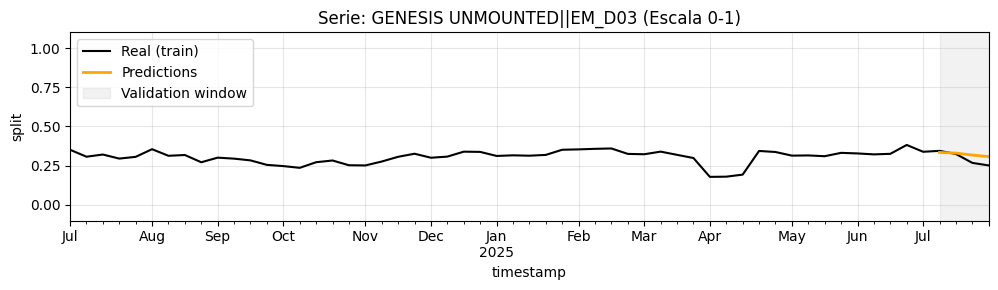


Serie: GENESIS UNMOUNTED||EM_U90
            y      pred  abs_error
35   0.655769  0.665806   0.010036
174  0.675835  0.669992   0.005843
313  0.732523  0.682563   0.049959
452  0.748830  0.692393   0.056437
MAE 0.030569


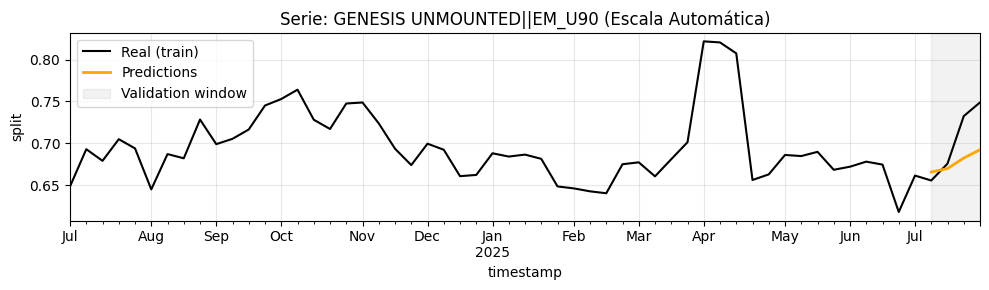

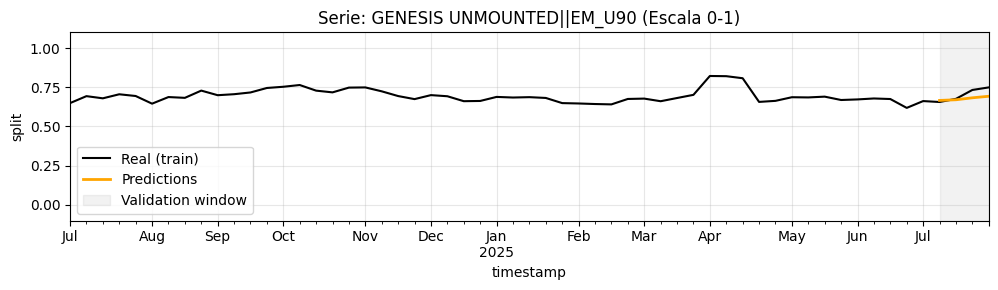


Serie: GENESIS on PRO||EM_D01
       y  pred  abs_error
36   1.0   1.0        0.0
175  1.0   1.0        0.0
314  1.0   1.0        0.0
453  1.0   1.0        0.0
MAE 0.000000


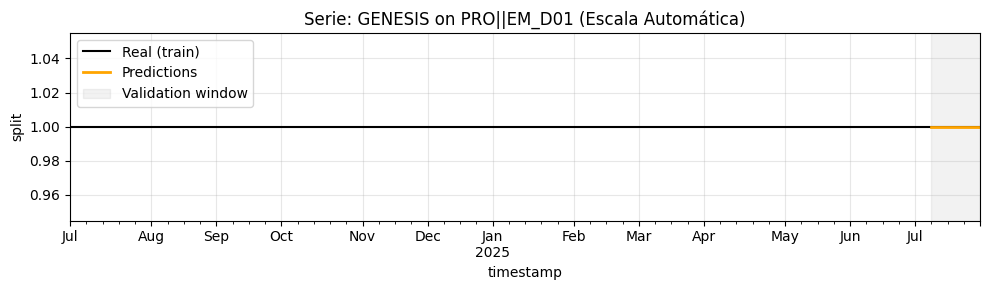

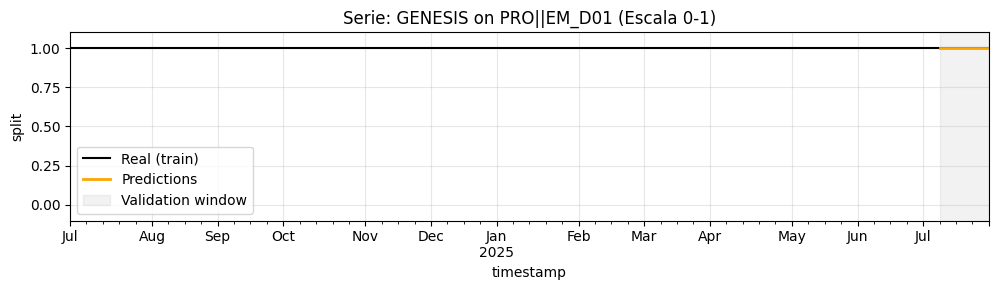


Serie: GENESIS on SLALOM||EM_D03
       y  pred  abs_error
37   1.0   1.0        0.0
176  1.0   1.0        0.0
315  1.0   1.0        0.0
454  1.0   1.0        0.0
MAE 0.000000


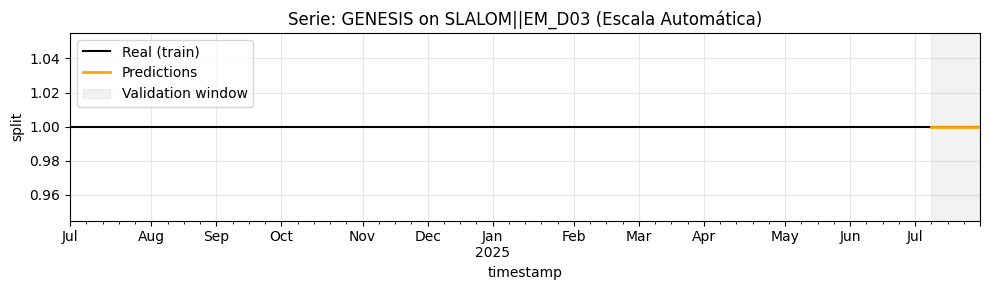

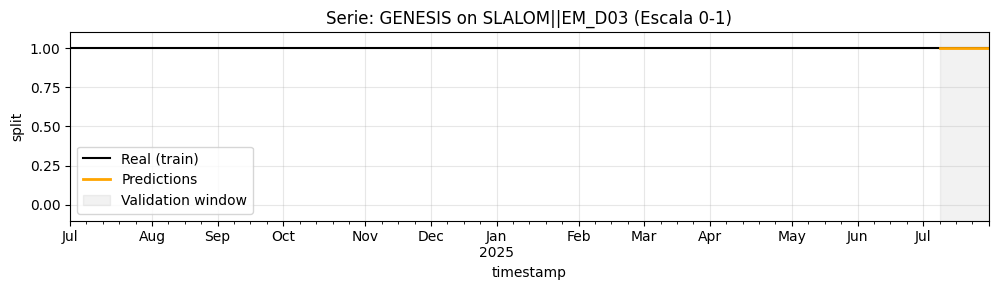


Serie: HIGH FLOW||C04D
       y  pred  abs_error
38   1.0   1.0        0.0
177  1.0   1.0        0.0
316  1.0   1.0        0.0
455  1.0   1.0        0.0
MAE 0.000000


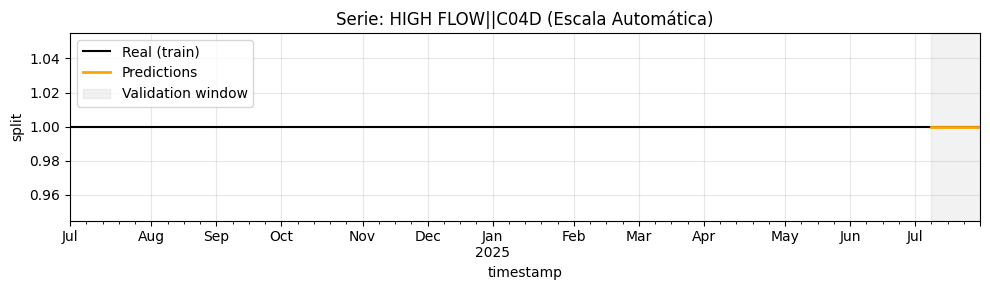

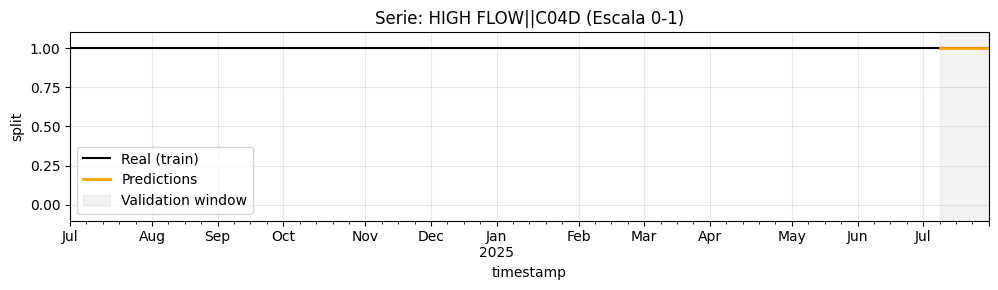


Serie: IKAZUCHI ZERO||EM_O84_NL_CN
       y  pred  abs_error
39   1.0   1.0        0.0
178  1.0   1.0        0.0
317  1.0   1.0        0.0
456  1.0   1.0        0.0
MAE 0.000000


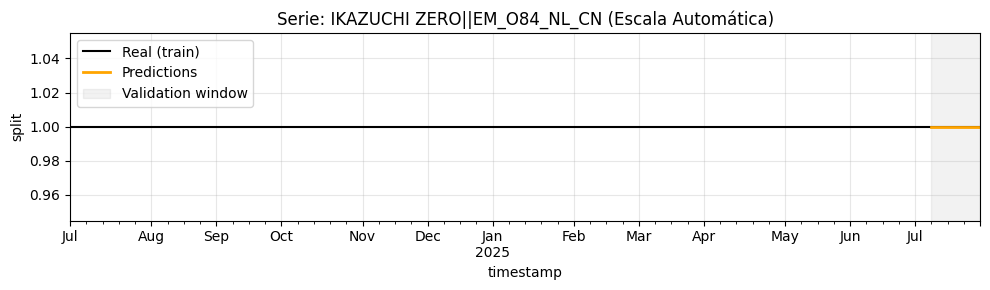

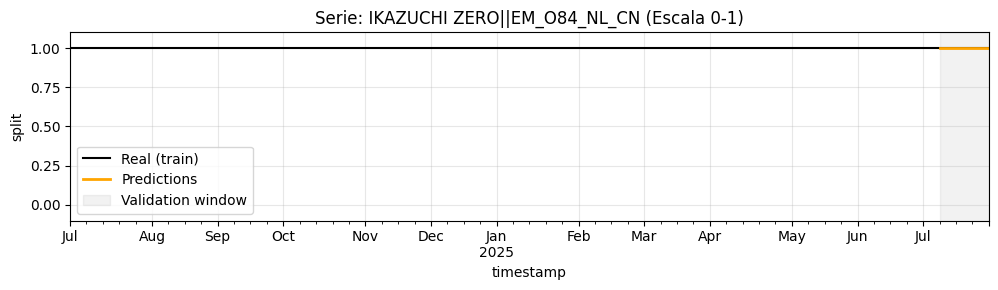


Serie: INCRAFT||N03A
            y      pred  abs_error
40   0.257504  0.258876   0.001372
179  0.264777  0.259674   0.005103
318  0.264750  0.263465   0.001286
457  0.268632  0.269687   0.001054
MAE 0.002204


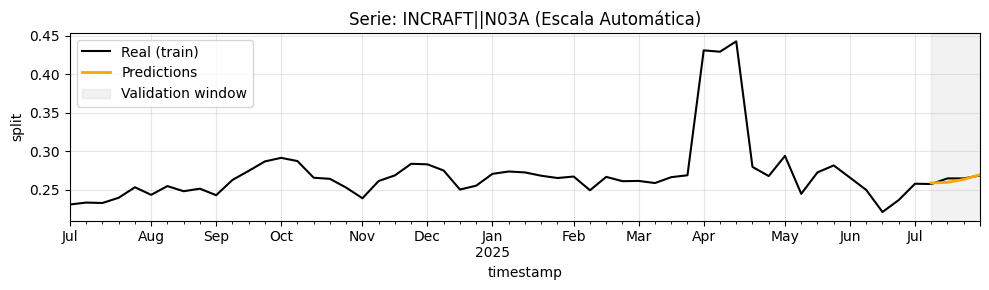

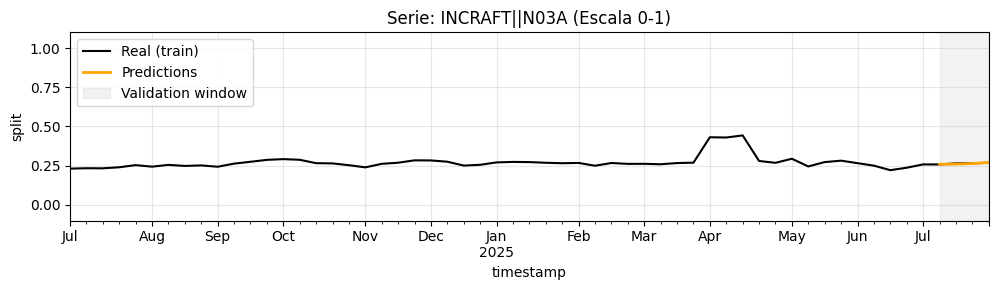


Serie: INCRAFT||N03B
            y      pred  abs_error
41   0.742496  0.741124   0.001372
180  0.735223  0.740326   0.005103
319  0.735250  0.736535   0.001286
458  0.731368  0.730313   0.001054
MAE 0.002204


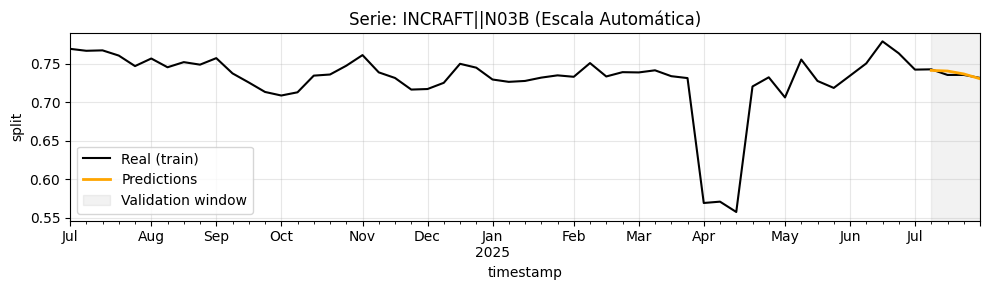

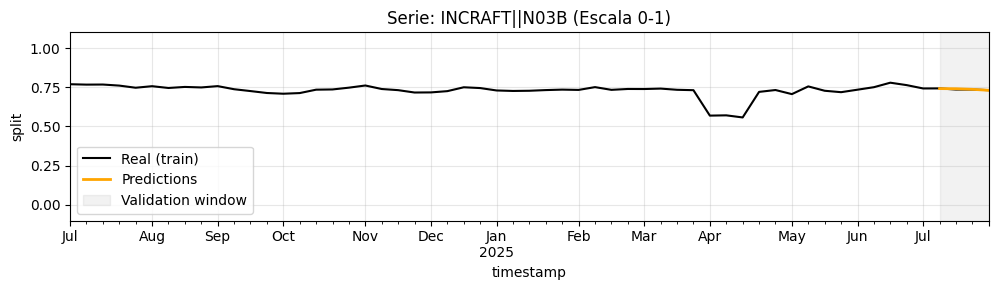


Serie: INFINITI||C04A
            y      pred  abs_error
42   0.006026  0.006420   0.000394
181  0.006091  0.006511   0.000419
320  0.006686  0.006773   0.000087
459  0.005415  0.007086   0.001671
MAE 0.000643


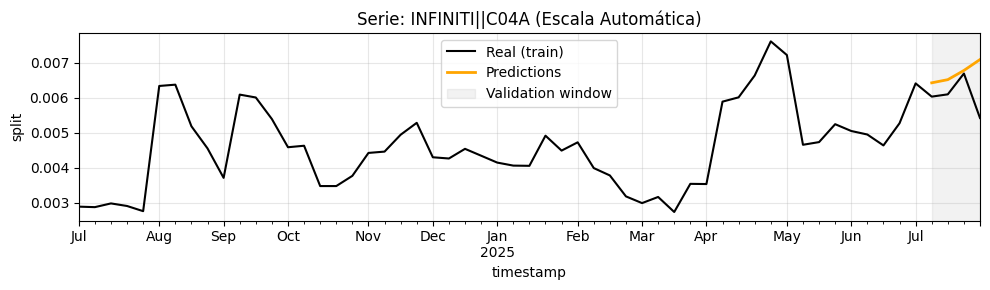

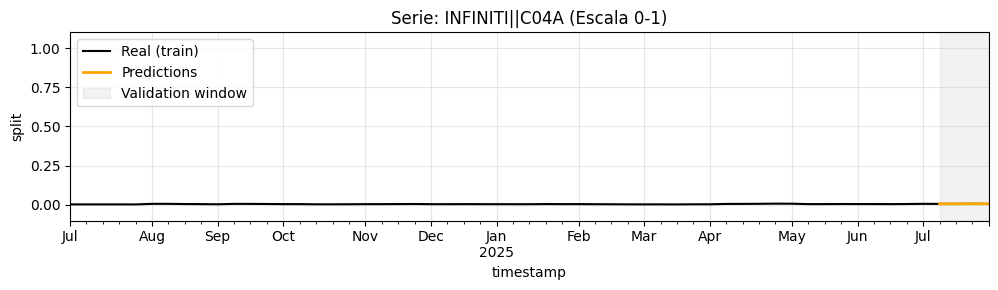


Serie: INFINITI||C04C
            y      pred  abs_error
43   0.027274  0.026269   0.001005
182  0.027117  0.025628   0.001489
321  0.026703  0.025338   0.001364
460  0.025613  0.025374   0.000238
MAE 0.001024


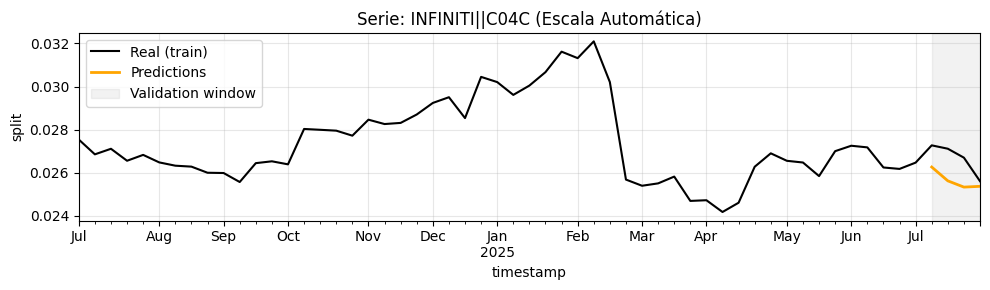

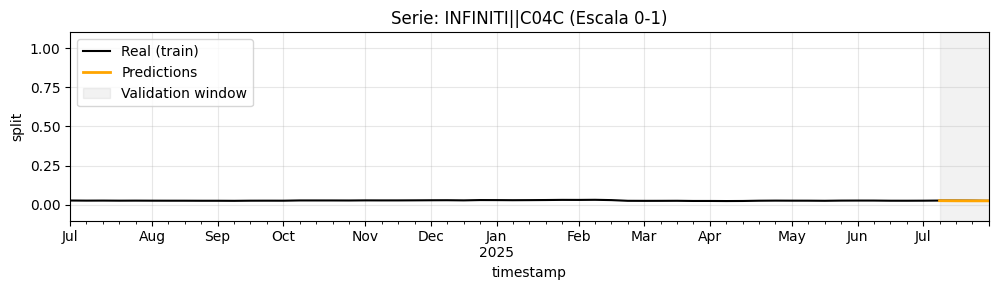


Serie: INFINITI||C04D
            y      pred  abs_error
44   0.067172  0.066180   0.000991
183  0.068949  0.066317   0.002631
322  0.077593  0.067405   0.010188
461  0.074152  0.067501   0.006652
MAE 0.005115


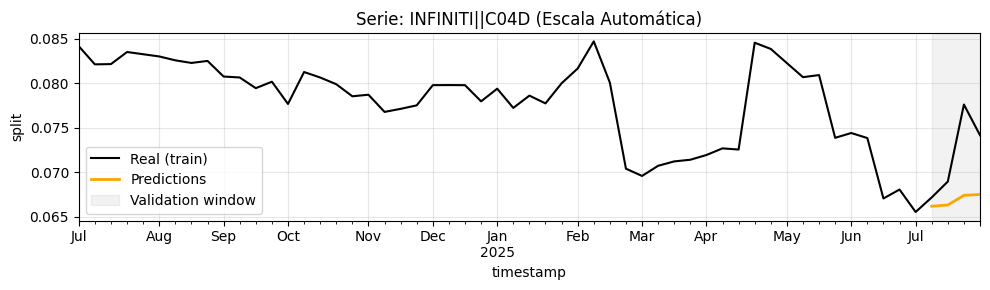

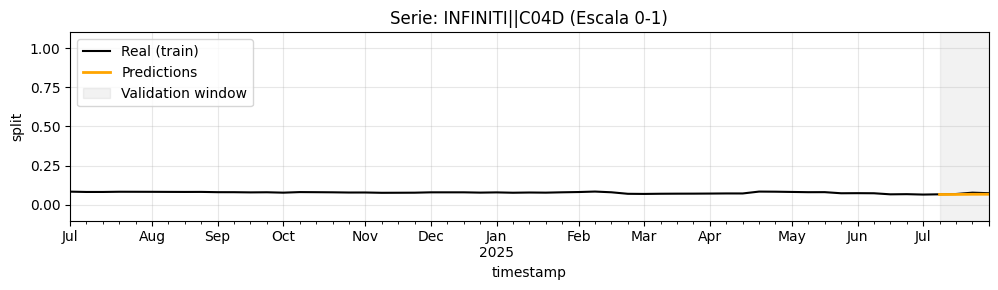


Serie: INFINITI||C12A
            y      pred  abs_error
45   0.499995  0.502029   0.002034
184  0.503136  0.505428   0.002292
323  0.553382  0.511886   0.041496
462  0.551599  0.513561   0.038038
MAE 0.020965


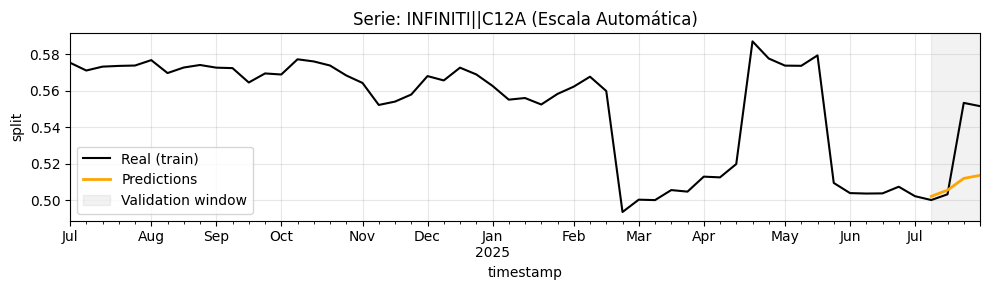

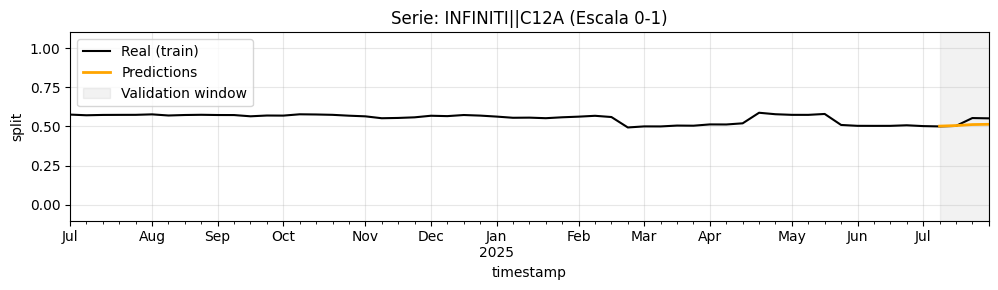


Serie: INFINITI||C12B
            y      pred  abs_error
46   0.399534  0.399102   0.000432
185  0.394707  0.396115   0.001409
324  0.335636  0.388598   0.052962
463  0.343221  0.386478   0.043257
MAE 0.024515


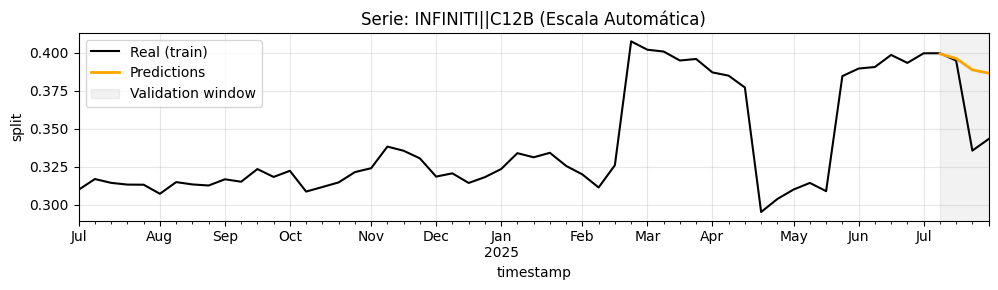

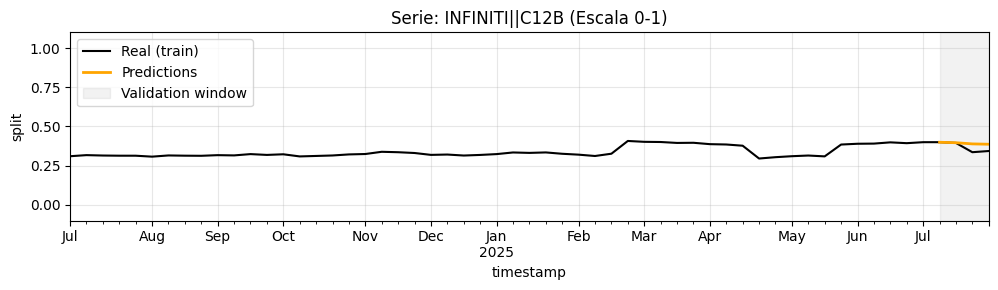


Serie: INFINITI (MODIFIED)||C05
       y  pred  abs_error
47   1.0   1.0        0.0
186  1.0   1.0        0.0
325  1.0   1.0        0.0
464  1.0   1.0        0.0
MAE 0.000000


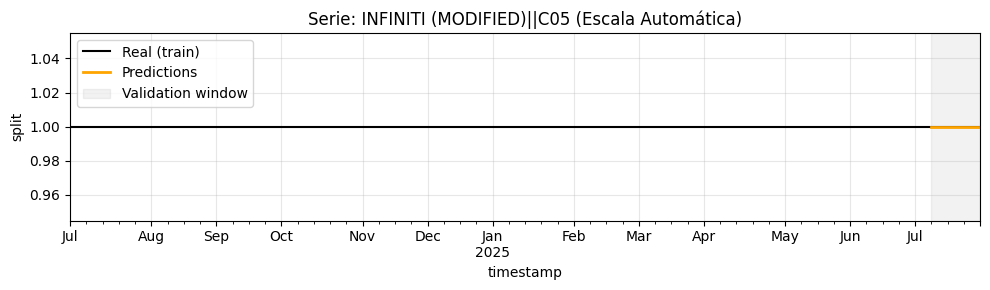

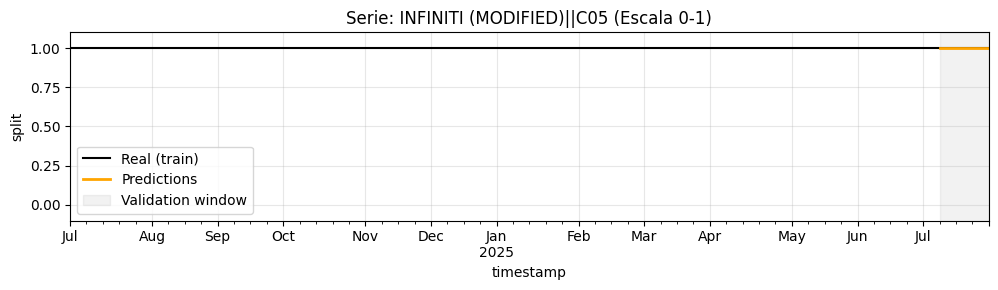


Serie: INFINITI AMBI||C12A
            y      pred  abs_error
48   0.701517  0.747457   0.045940
187  0.716949  0.755288   0.038338
326  0.761832  0.765596   0.003763
465  0.763758  0.758342   0.005417
MAE 0.023365


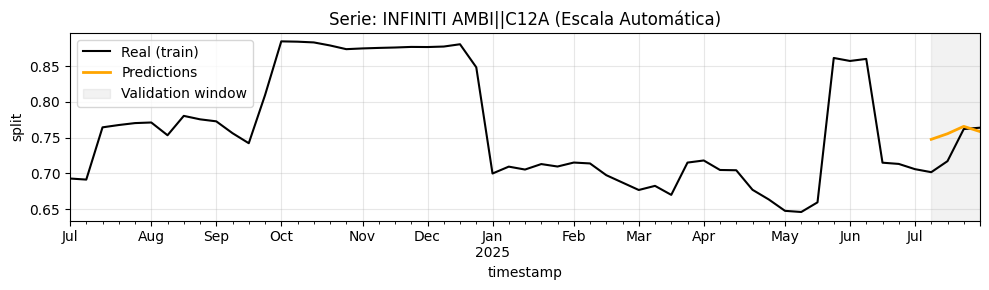

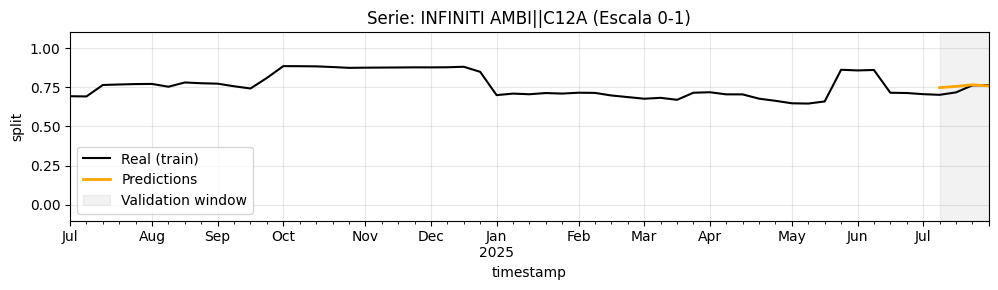


Serie: INFINITI AMBI||C12B
            y      pred  abs_error
49   0.298483  0.252543   0.045940
188  0.283051  0.244712   0.038338
327  0.238168  0.234404   0.003763
466  0.236242  0.241658   0.005417
MAE 0.023365


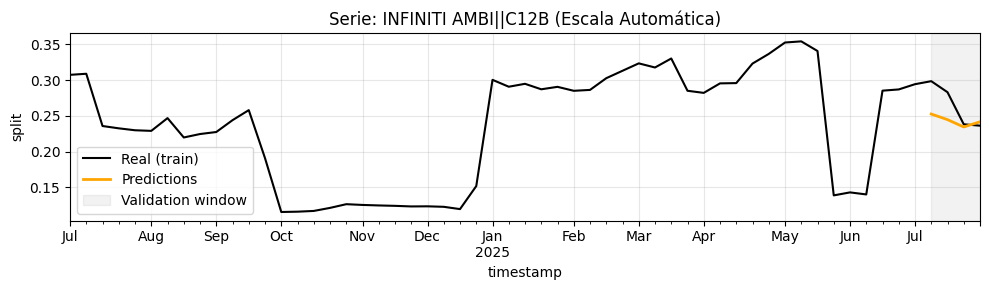

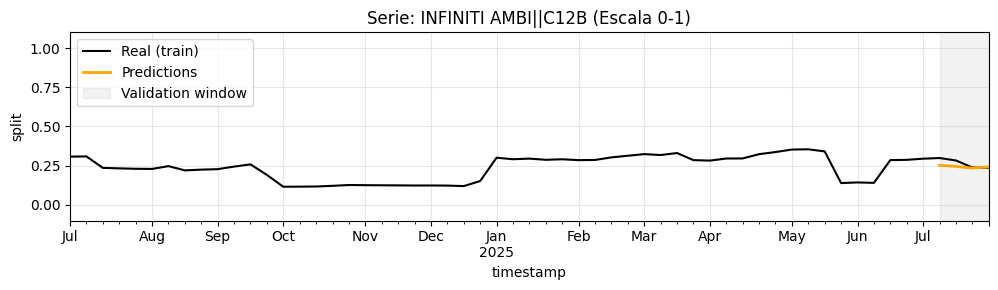


Serie: KOBI CAROTID||T02B
       y  pred  abs_error
50   1.0   1.0        0.0
189  1.0   1.0        0.0
328  1.0   1.0        0.0
467  1.0   1.0        0.0
MAE 0.000000


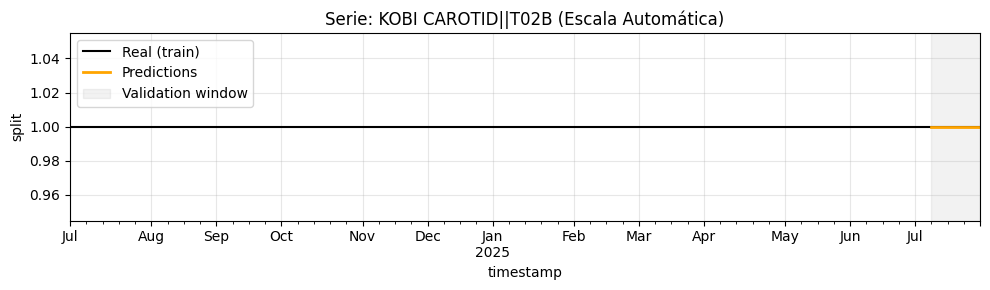

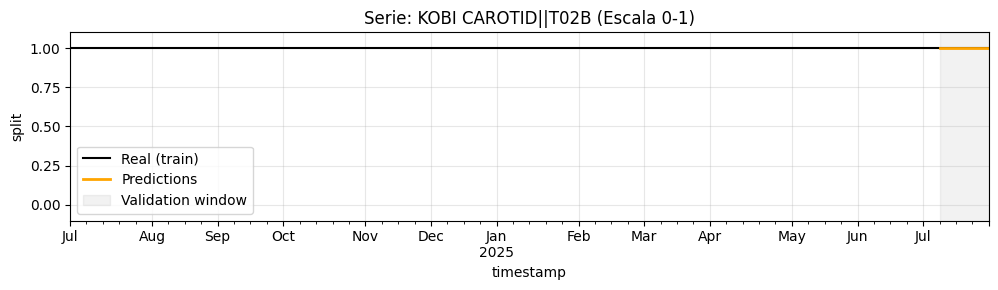


Serie: Long Sheath||A00A
       y  pred  abs_error
51   1.0   1.0        0.0
190  1.0   1.0        0.0
329  1.0   1.0        0.0
468  1.0   1.0        0.0
MAE 0.000000


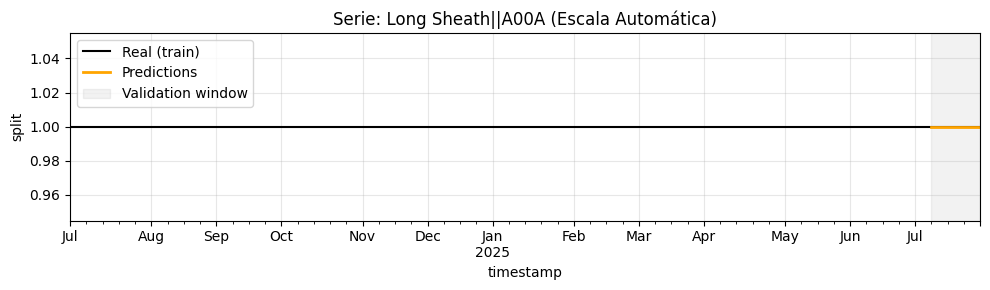

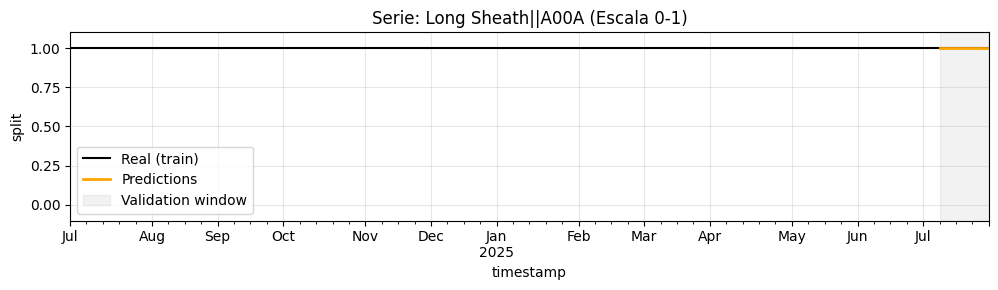


Serie: MAXI||EM_D05
       y  pred  abs_error
52   1.0   1.0        0.0
191  1.0   1.0        0.0
330  1.0   1.0        0.0
469  1.0   1.0        0.0
MAE 0.000000


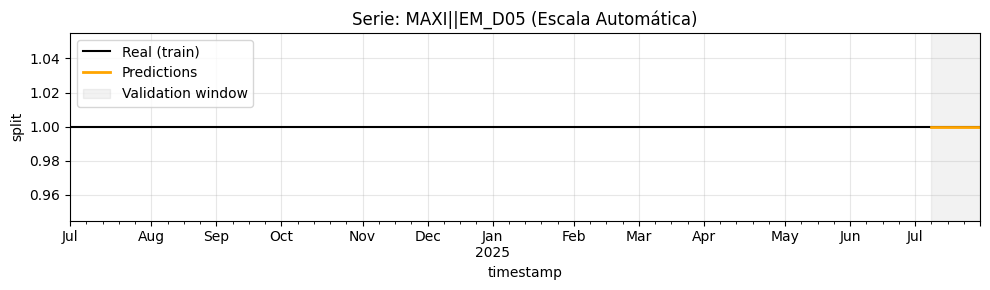

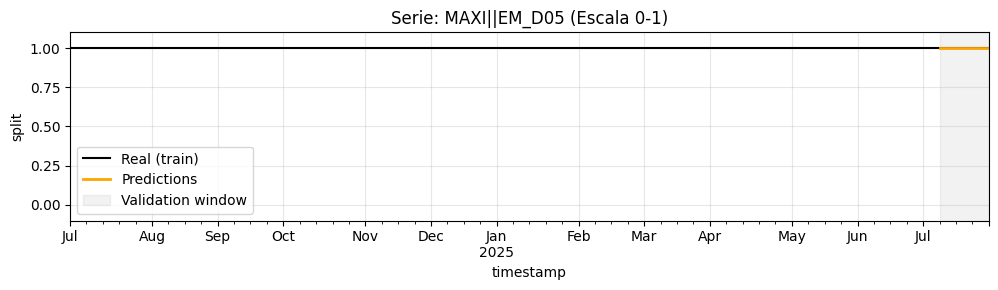


Serie: MULTIPACK||C04B
       y  pred  abs_error
53   1.0   1.0        0.0
192  1.0   1.0        0.0
331  1.0   1.0        0.0
470  1.0   1.0        0.0
MAE 0.000000


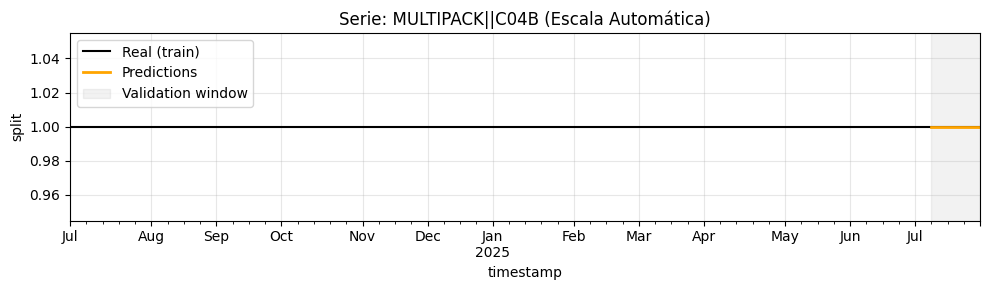

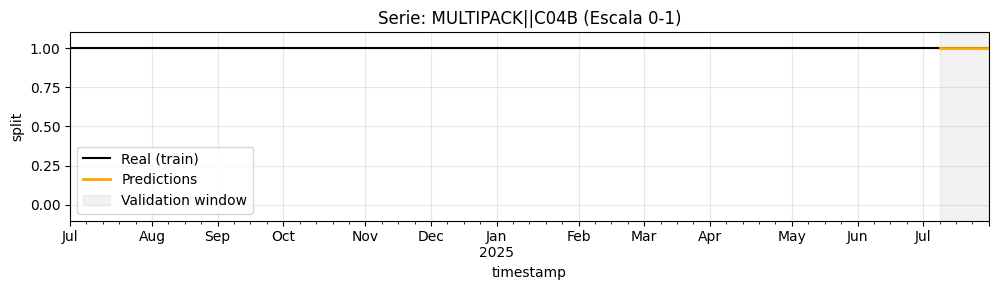


Serie: MULTIPACK (MODIFIED)||C04B
       y      pred  abs_error
54   1.0  1.000000   0.000000
193  1.0  1.000000   0.000000
332  1.0  0.999941   0.000059
471  1.0  0.999905   0.000095
MAE 0.000039


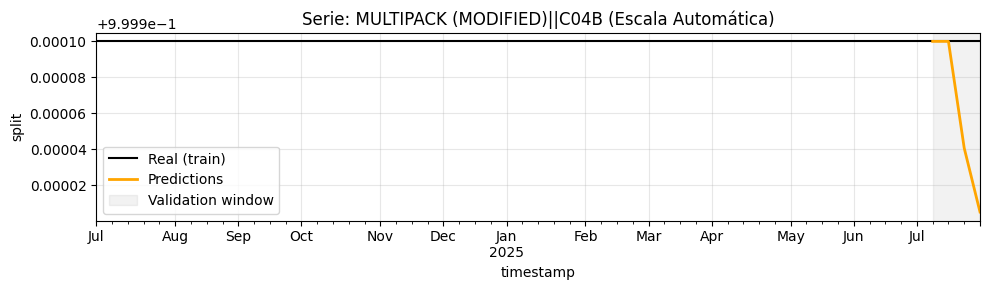

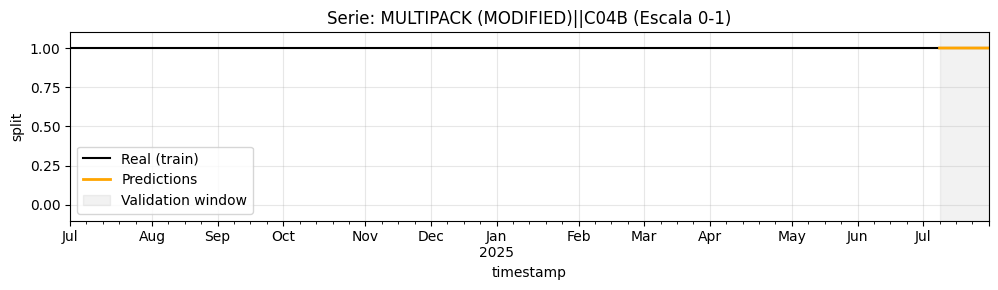


Serie: MULTIPACK (MODIFIED)||C05
       y      pred  abs_error
55   0.0  0.000000   0.000000
194  0.0  0.000000   0.000000
333  0.0  0.000059   0.000059
472  0.0  0.000095   0.000095
MAE 0.000039


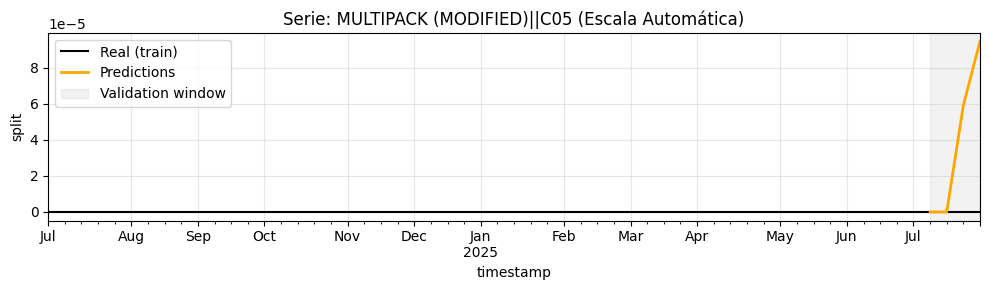

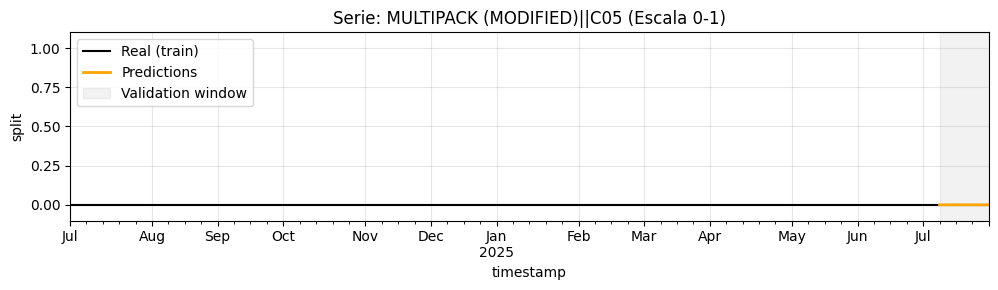


Serie: MYNX Control||ERR
       y  pred  abs_error
56   1.0   1.0        0.0
195  1.0   1.0        0.0
334  1.0   1.0        0.0
473  1.0   1.0        0.0
MAE 0.000000


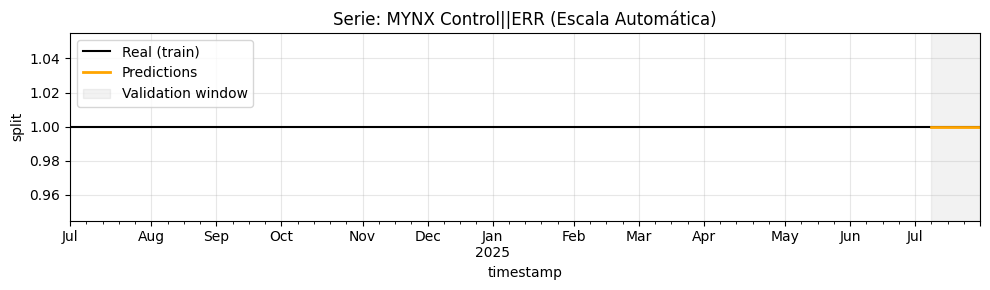

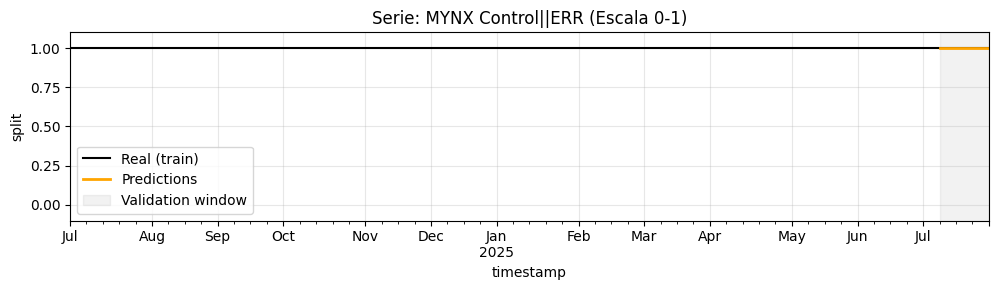


Serie: MYNX Control Venous||ERR
       y  pred  abs_error
57   1.0   1.0        0.0
196  1.0   1.0        0.0
335  1.0   1.0        0.0
474  1.0   1.0        0.0
MAE 0.000000


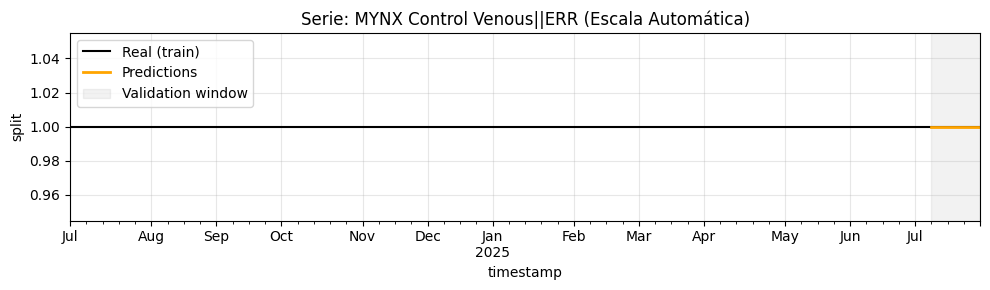

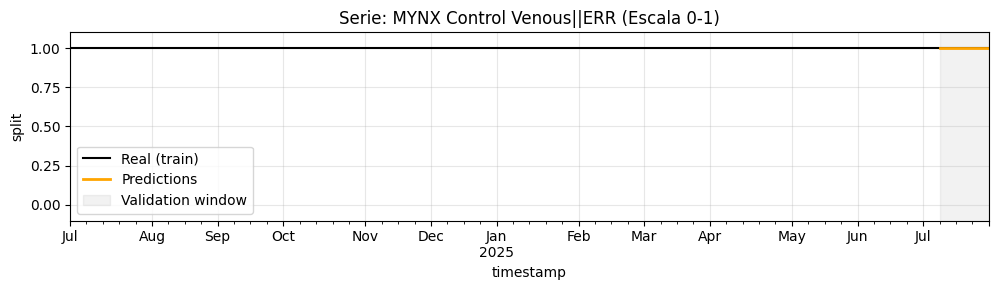


Serie: MYNX GRIP||ERR
       y  pred  abs_error
58   1.0   1.0        0.0
197  1.0   1.0        0.0
336  1.0   1.0        0.0
475  1.0   1.0        0.0
MAE 0.000000


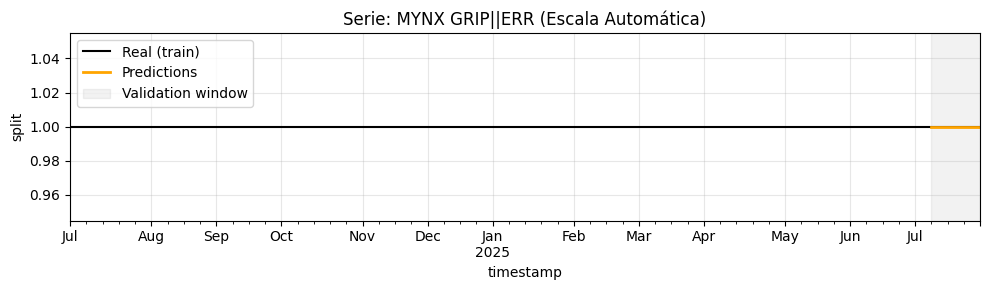

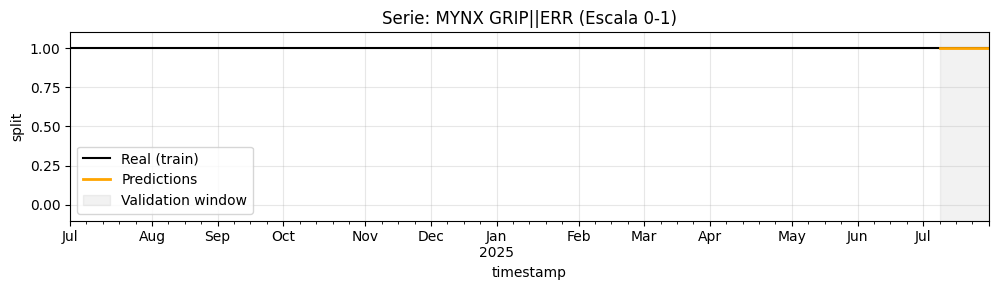


Serie: NEEDLE||EM_O02
            y      pred  abs_error
59   0.127786  0.139759   0.011973
198  0.117853  0.158780   0.040927
337  0.127999  0.164868   0.036869
476  0.135379  0.166439   0.031060
MAE 0.030207


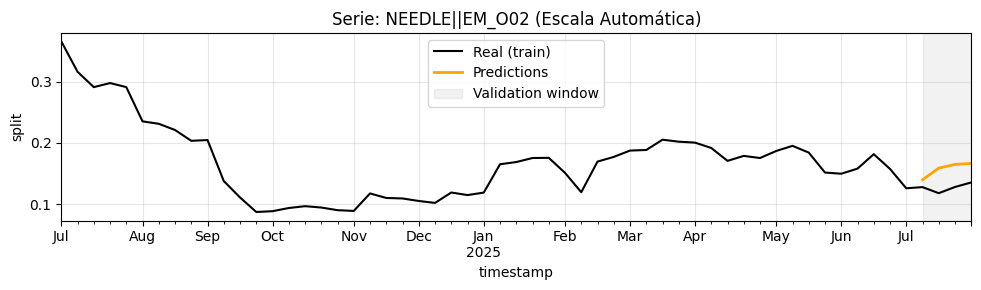

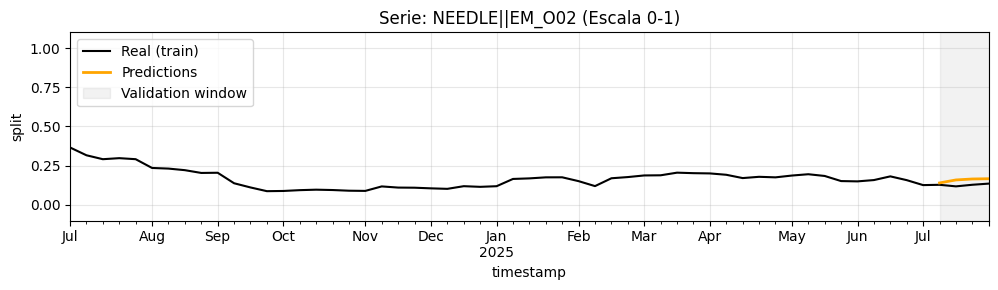


Serie: NEEDLE||EM_O02_NL
       y      pred  abs_error
60   0.0  0.000000   0.000000
199  0.0  0.000023   0.000023
338  0.0  0.000036   0.000036
477  0.0  0.000033   0.000033
MAE 0.000023


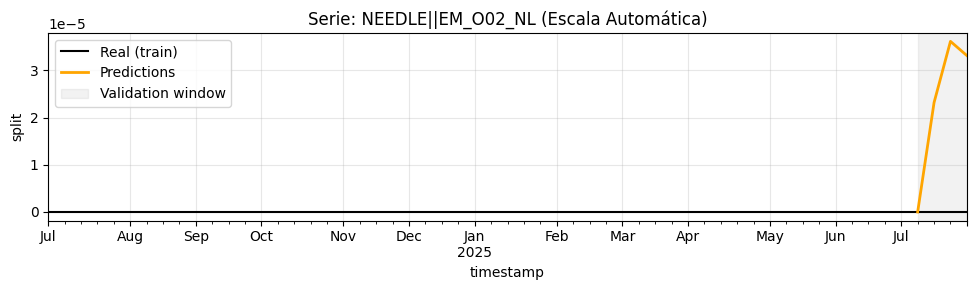

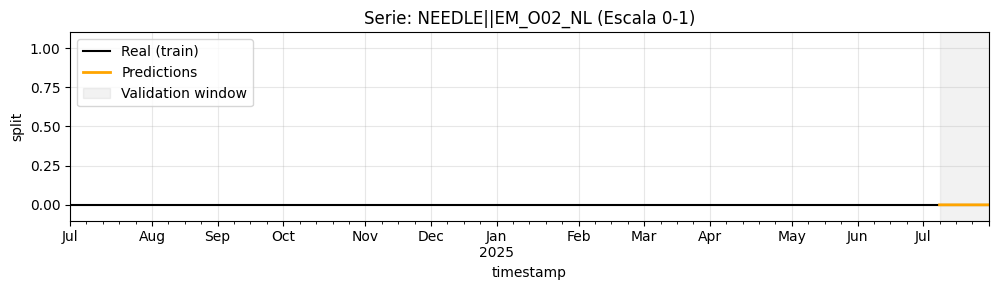


Serie: NEEDLE||EM_O04_NL
            y      pred  abs_error
61   0.872214  0.860241   0.011973
200  0.882147  0.841197   0.040950
339  0.872001  0.835096   0.036906
478  0.864621  0.833528   0.031093
MAE 0.030231


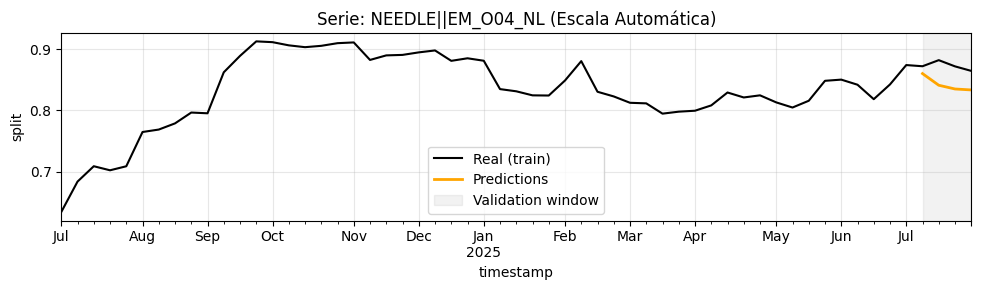

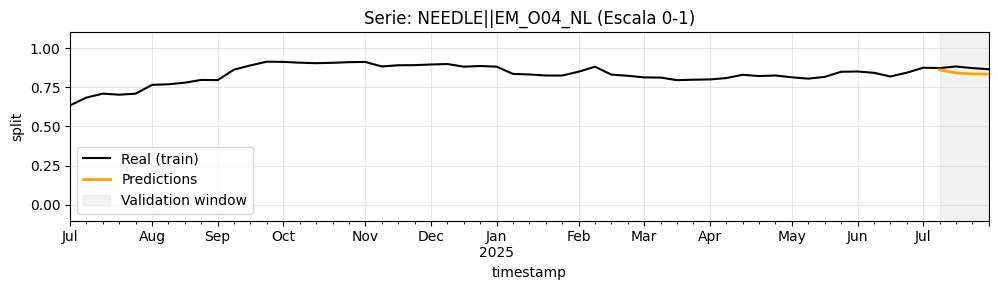


Serie: NEON||EM_O86_NL
       y  pred  abs_error
62   1.0   1.0        0.0
201  1.0   1.0        0.0
340  1.0   1.0        0.0
479  1.0   1.0        0.0
MAE 0.000000


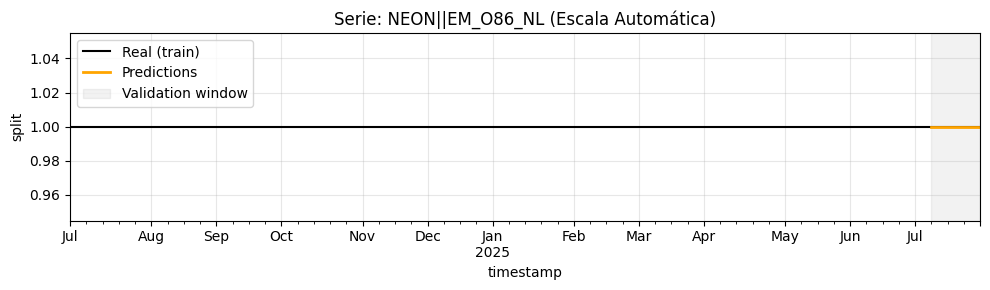

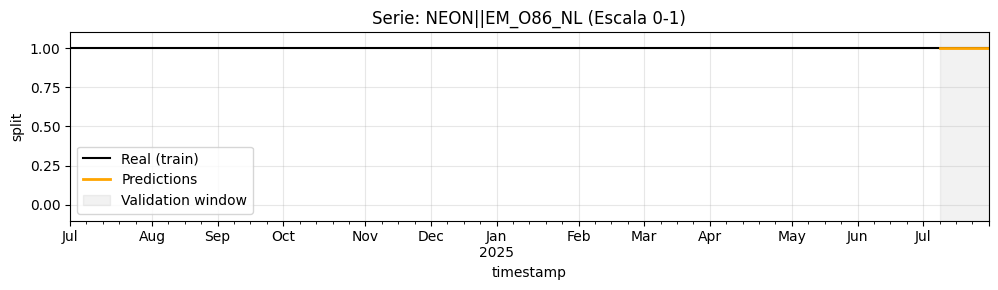


Serie: NEON NC||EM_O86_NL
       y  pred  abs_error
63   1.0   1.0        0.0
202  1.0   1.0        0.0
341  1.0   1.0        0.0
480  1.0   1.0        0.0
MAE 0.000000


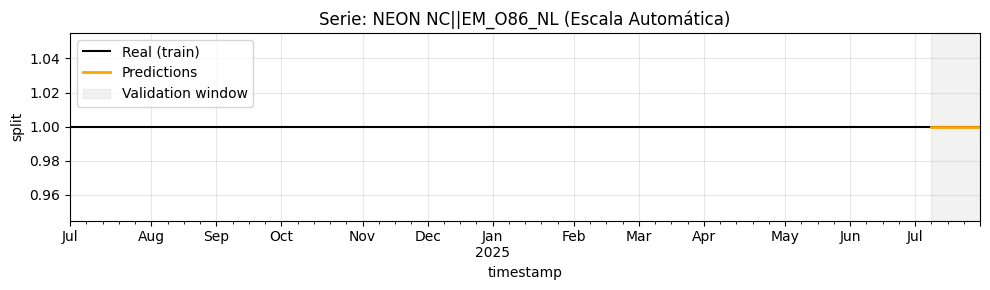

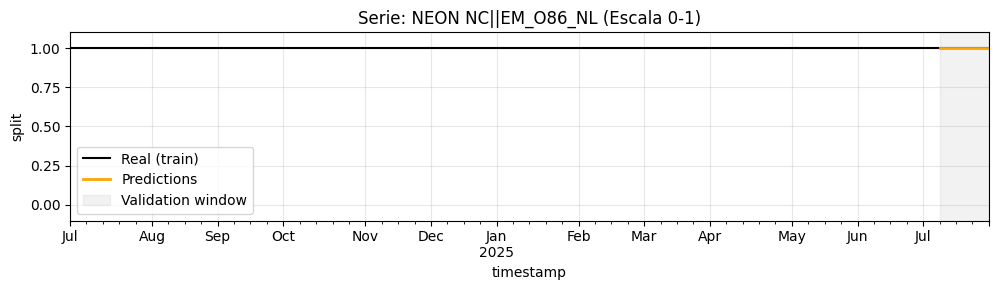


Serie: OPTA PRO||EM_D01
       y  pred  abs_error
64   1.0   1.0        0.0
203  1.0   1.0        0.0
342  1.0   1.0        0.0
481  1.0   1.0        0.0
MAE 0.000000


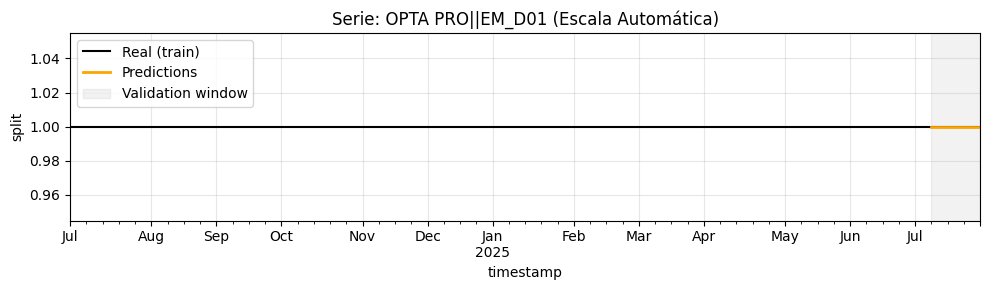

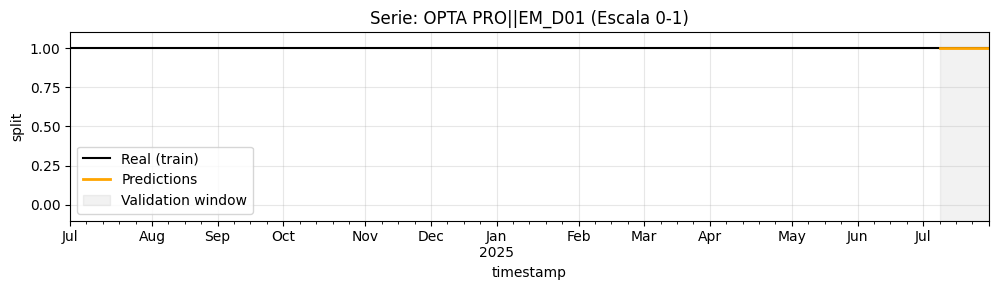


Serie: OPTEASE||P00
       y  pred  abs_error
65   1.0   1.0        0.0
204  1.0   1.0        0.0
343  1.0   1.0        0.0
482  1.0   1.0        0.0
MAE 0.000000


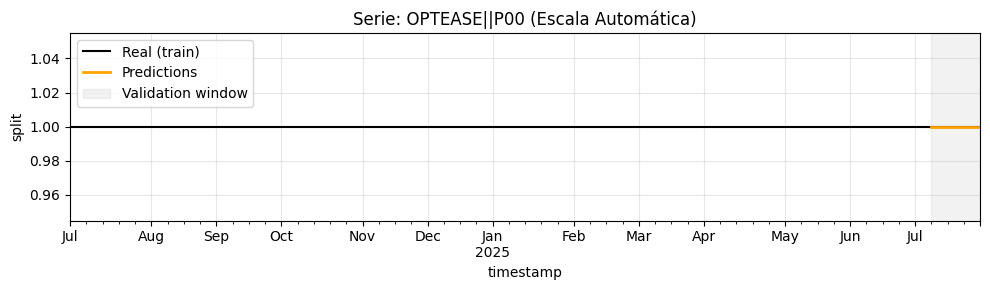

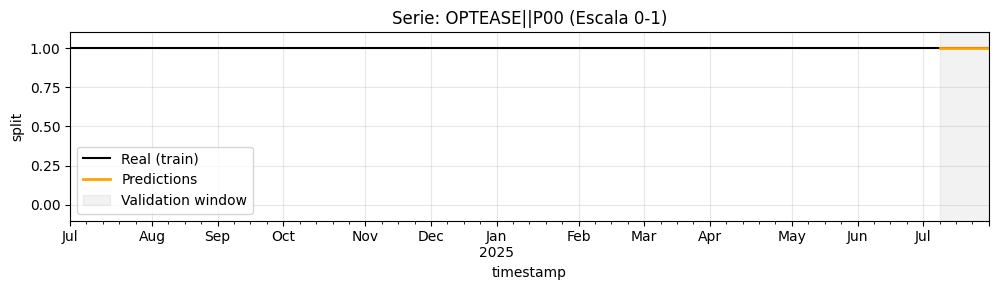


Serie: OPTEASE RETRIEVAL CATHETER||E00C
       y  pred  abs_error
66   1.0   1.0        0.0
205  1.0   1.0        0.0
344  1.0   1.0        0.0
483  1.0   1.0        0.0
MAE 0.000000


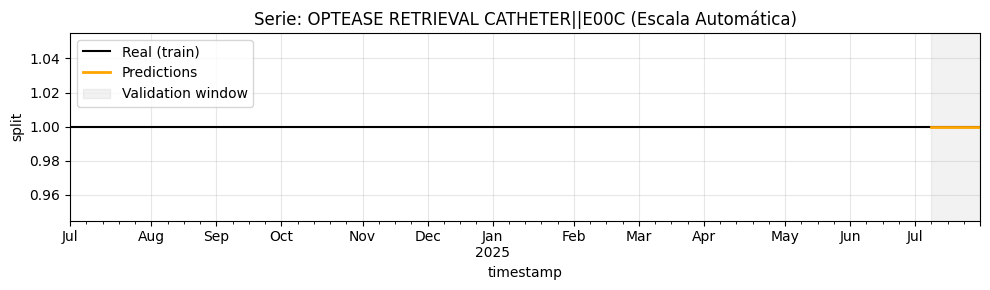

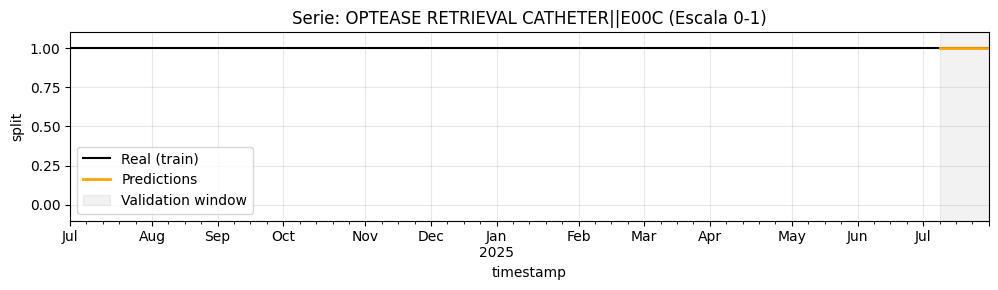


Serie: OUTBACK ELITE||X00
       y  pred  abs_error
67   1.0   1.0        0.0
206  1.0   1.0        0.0
345  1.0   1.0        0.0
484  1.0   1.0        0.0
MAE 0.000000


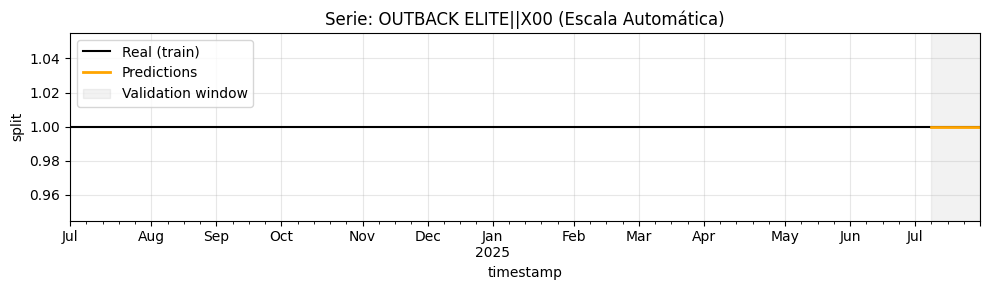

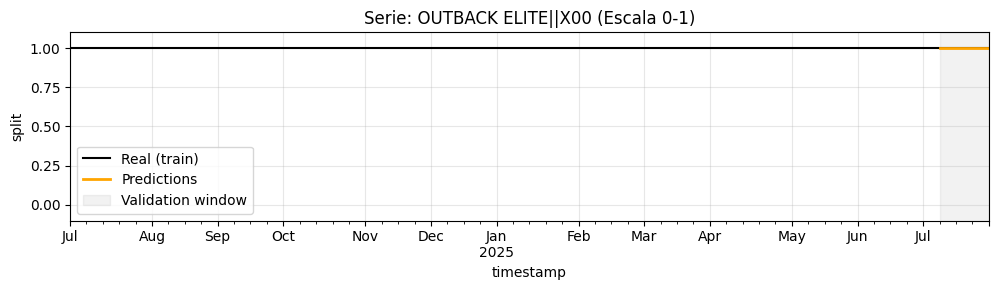


Serie: PALMAZ UNMOUNTED||EM_U90
       y  pred  abs_error
68   1.0   1.0        0.0
207  1.0   1.0        0.0
346  1.0   1.0        0.0
485  1.0   1.0        0.0
MAE 0.000000


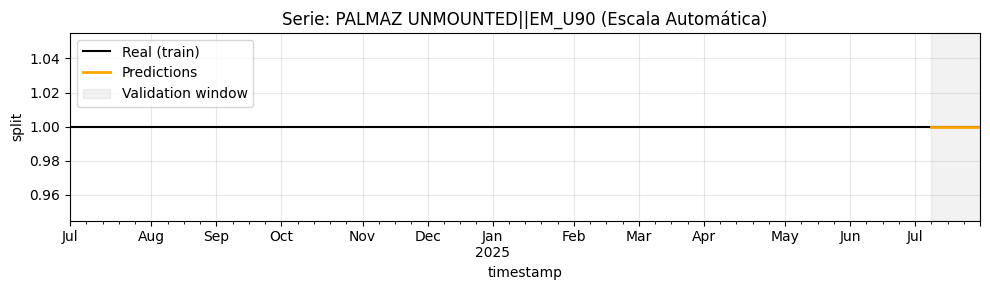

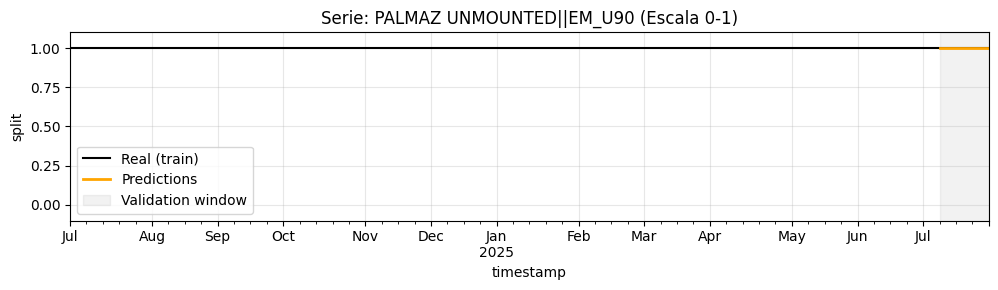


Serie: POWERFLEX EXTREME||EM_D01
       y  pred  abs_error
69   1.0   1.0        0.0
208  1.0   1.0        0.0
347  1.0   1.0        0.0
486  1.0   1.0        0.0
MAE 0.000000


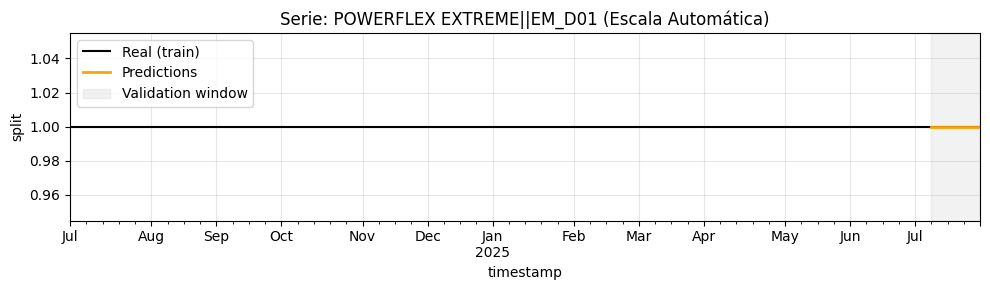

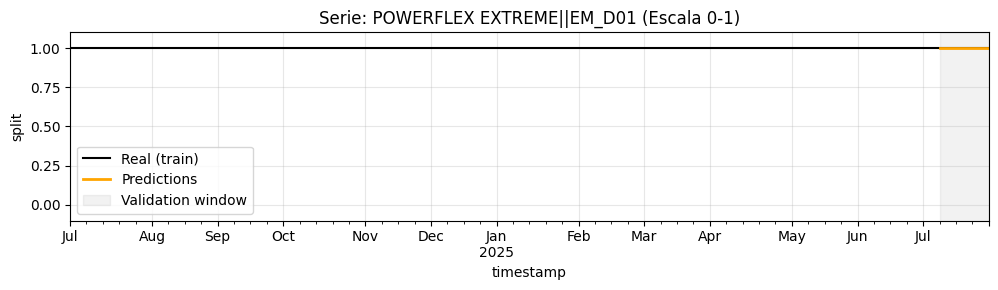


Serie: POWERFLEX P3||EM_D01
       y  pred  abs_error
70   1.0   1.0        0.0
209  1.0   1.0        0.0
348  1.0   1.0        0.0
487  1.0   1.0        0.0
MAE 0.000000


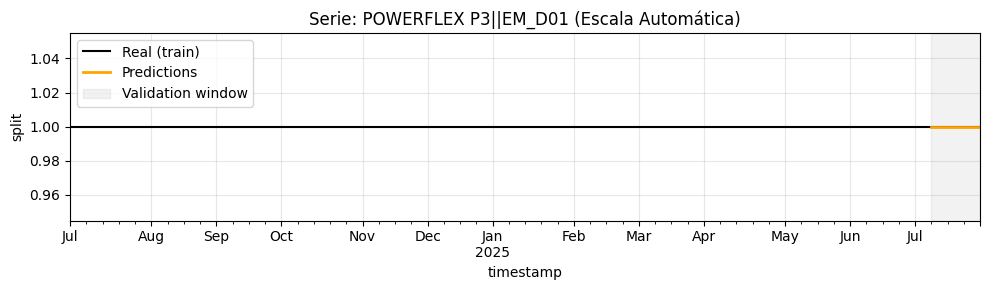

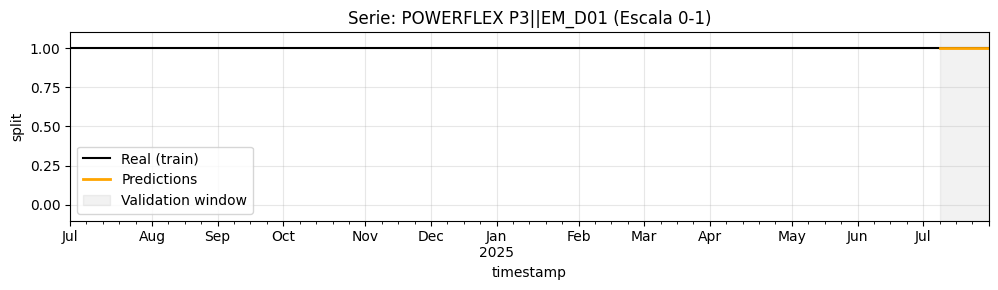


Serie: POWERFLEX PRO||EM_D02
       y  pred  abs_error
71   1.0   1.0        0.0
210  1.0   1.0        0.0
349  1.0   1.0        0.0
488  1.0   1.0        0.0
MAE 0.000000


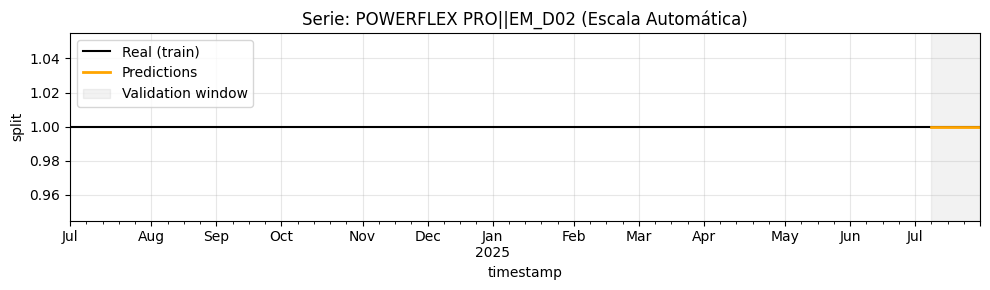

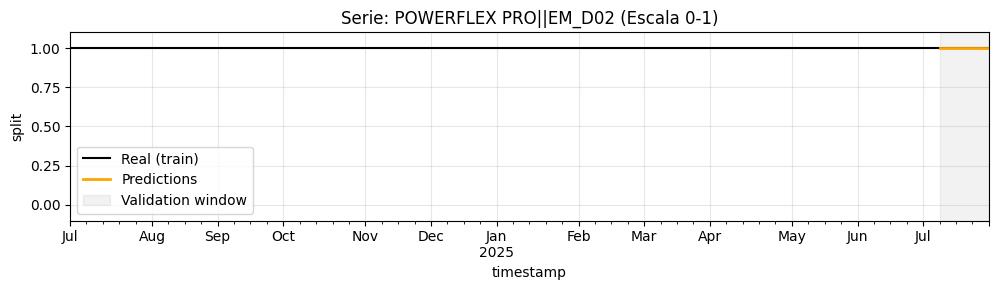


Serie: PRECISE PRO||T02A
       y  pred  abs_error
72   1.0   1.0        0.0
211  1.0   1.0        0.0
350  1.0   1.0        0.0
489  1.0   1.0        0.0
MAE 0.000000


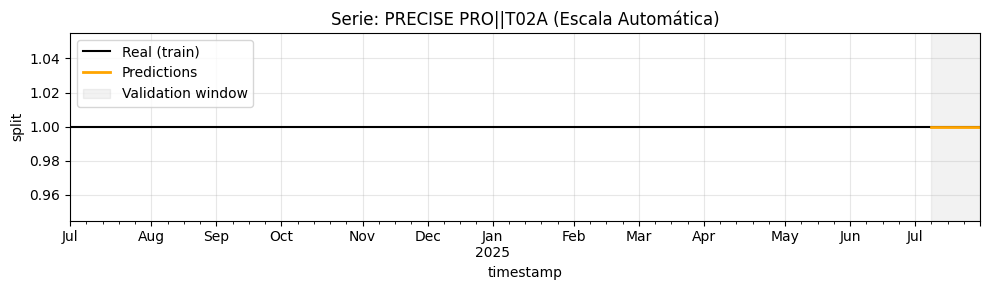

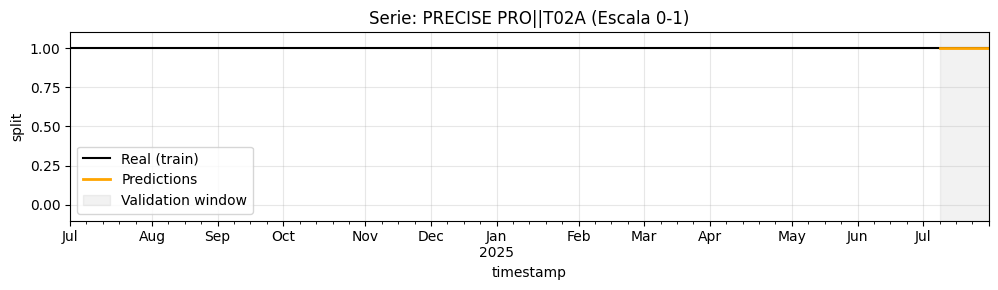


Serie: PREFACE||A01
       y  pred  abs_error
73   1.0   1.0        0.0
212  1.0   1.0        0.0
351  1.0   1.0        0.0
490  1.0   1.0        0.0
MAE 0.000000


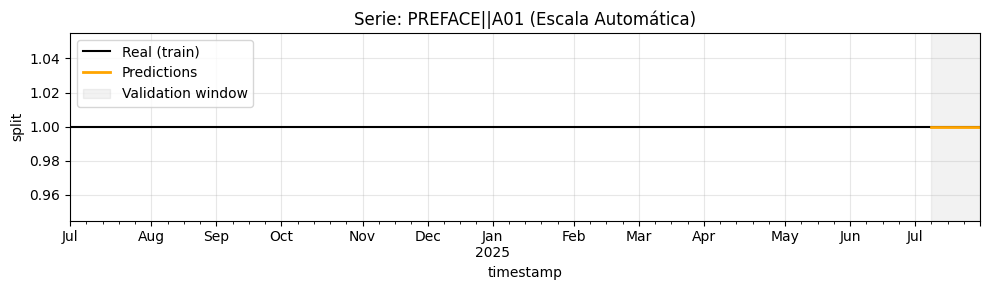

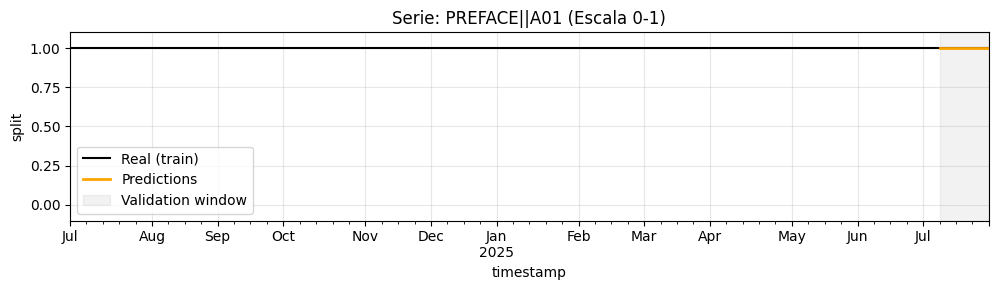


Serie: PRIMOPAC||C04B
       y  pred  abs_error
74   1.0   1.0        0.0
213  1.0   1.0        0.0
352  1.0   1.0        0.0
491  1.0   1.0        0.0
MAE 0.000000


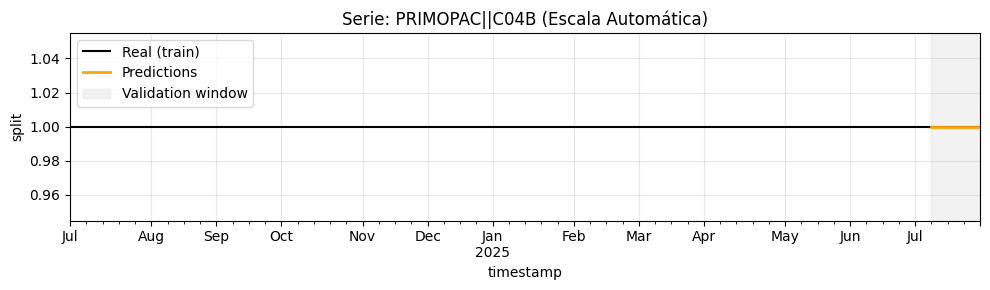

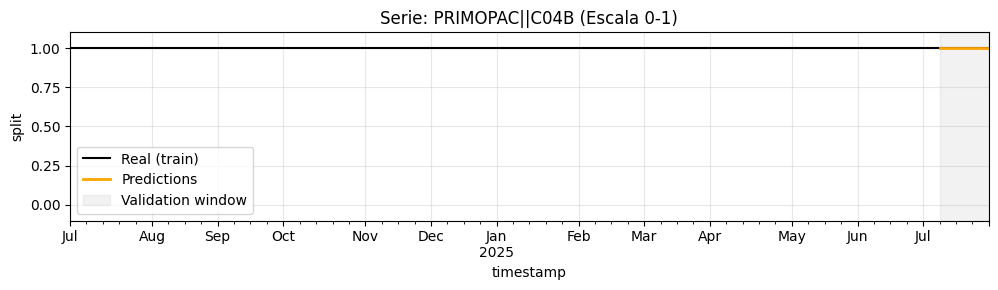


Serie: PRIMOPAC (MODIFIED)||C04B
       y  pred  abs_error
75   1.0   1.0        0.0
214  1.0   1.0        0.0
353  1.0   1.0        0.0
492  1.0   1.0        0.0
MAE 0.000000


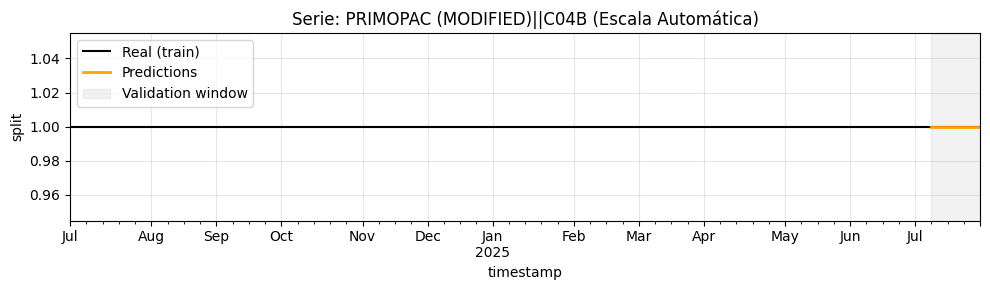

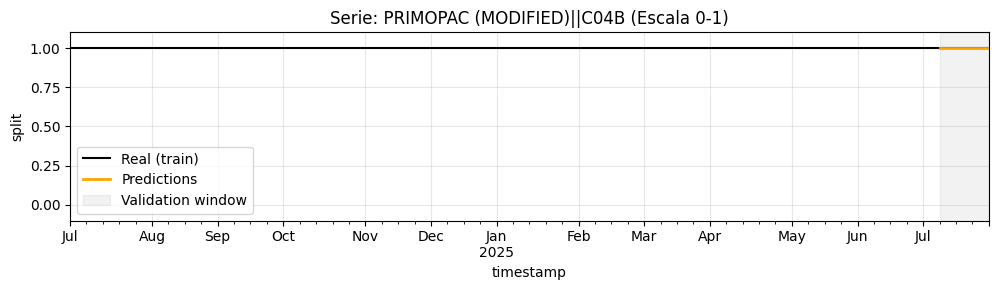


Serie: PROPAC||C04B
       y  pred  abs_error
76   1.0   1.0        0.0
215  1.0   1.0        0.0
354  1.0   1.0        0.0
493  1.0   1.0        0.0
MAE 0.000000


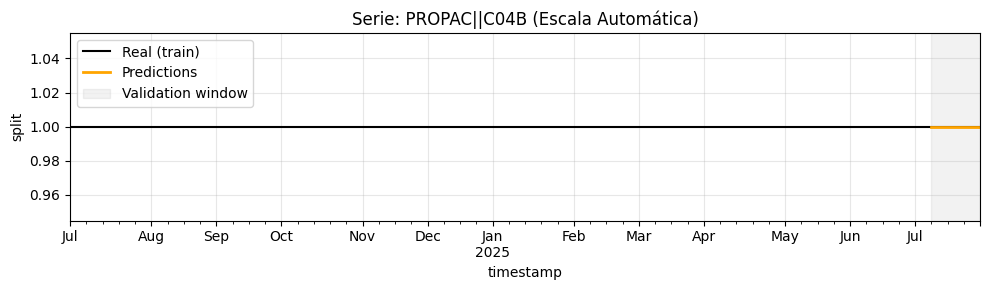

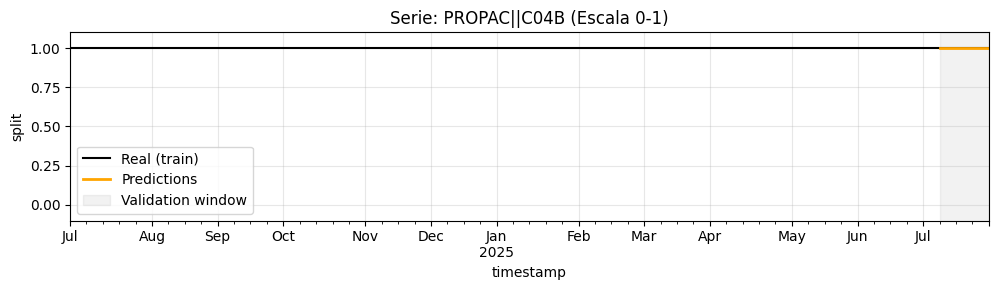


Serie: PROPAC (MODIFIED)||C04B
       y  pred  abs_error
77   1.0   1.0        0.0
216  1.0   1.0        0.0
355  1.0   1.0        0.0
494  1.0   1.0        0.0
MAE 0.000000


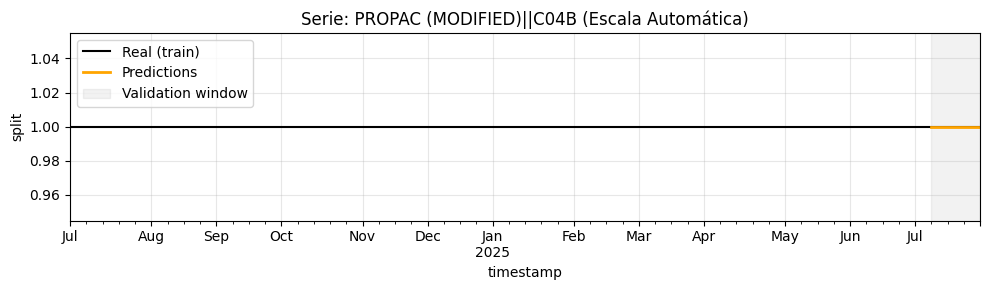

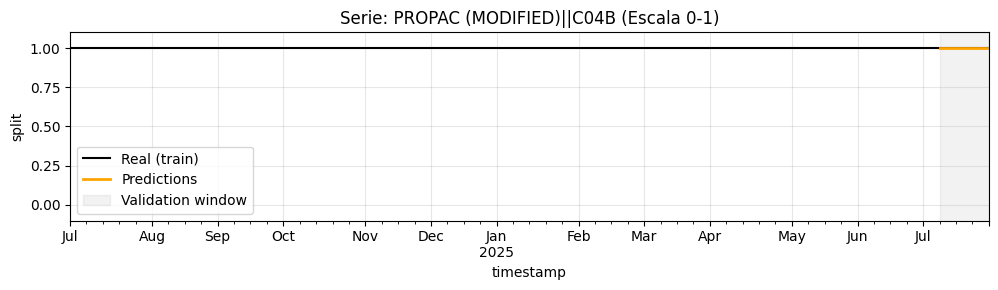


Serie: RAIDEN||EM_O84_NL_CN
       y  pred  abs_error
78   1.0   1.0        0.0
217  1.0   1.0        0.0
356  1.0   1.0        0.0
495  1.0   1.0        0.0
MAE 0.000000


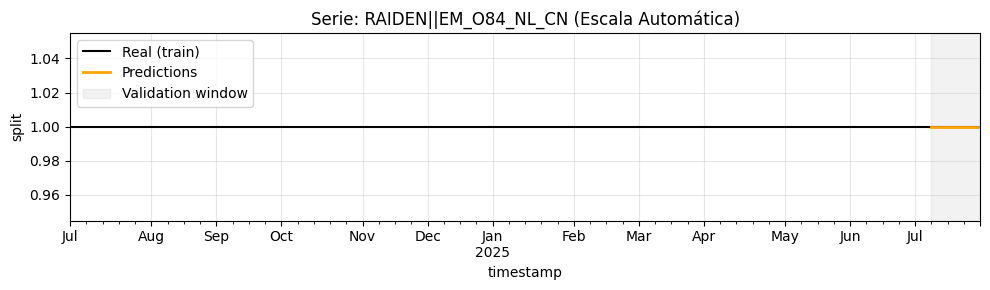

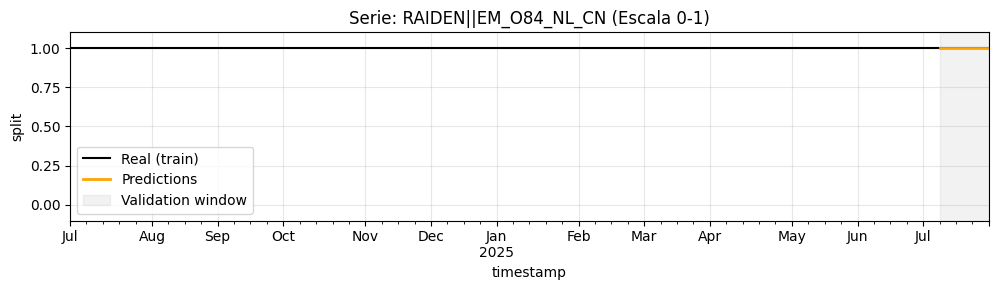


Serie: RAILWAY||A04
       y  pred  abs_error
79   1.0   1.0        0.0
218  1.0   1.0        0.0
357  1.0   1.0        0.0
496  1.0   1.0        0.0
MAE 0.000000


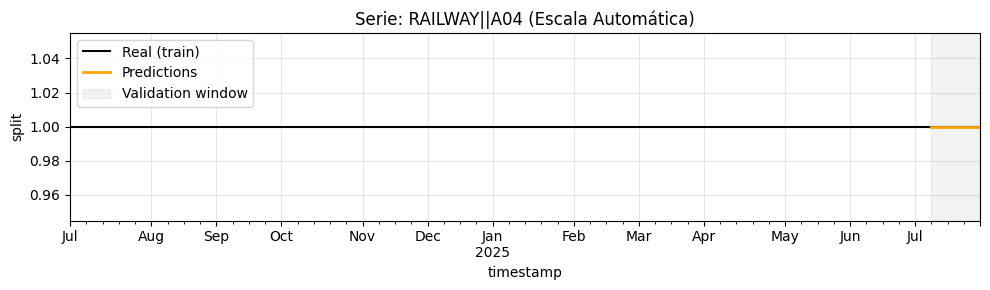

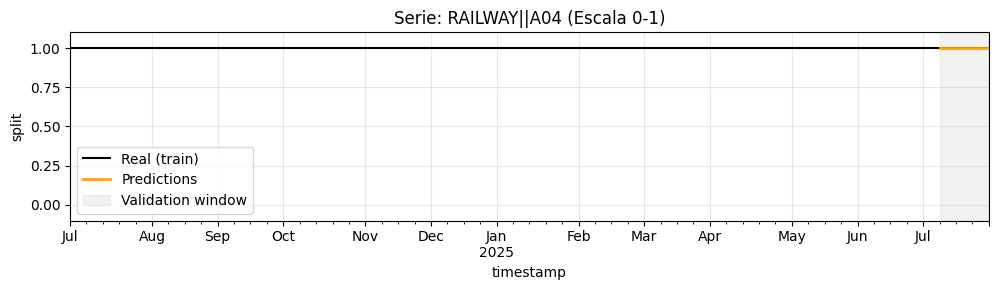


Serie: RAIN Sheath Transradial||A02D
       y  pred  abs_error
80   1.0   1.0        0.0
219  1.0   1.0        0.0
358  1.0   1.0        0.0
497  1.0   1.0        0.0
MAE 0.000000


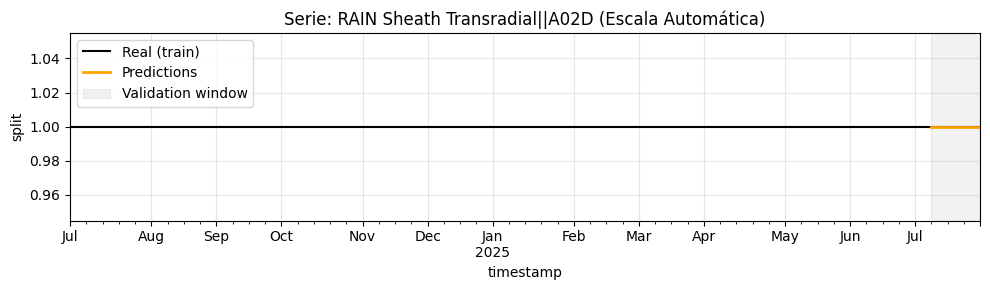

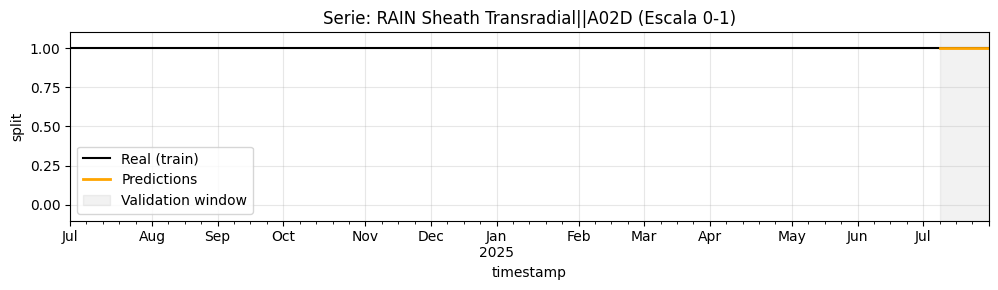


Serie: Rain Tibial/Pedal||A02D
       y  pred  abs_error
81   1.0   1.0        0.0
220  1.0   1.0        0.0
359  1.0   1.0        0.0
498  1.0   1.0        0.0
MAE 0.000000


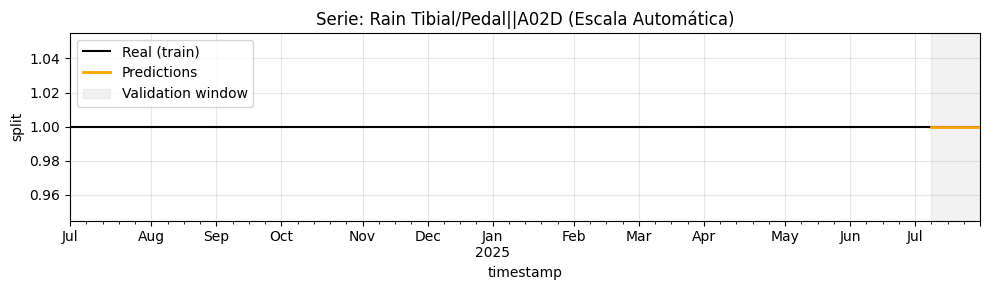

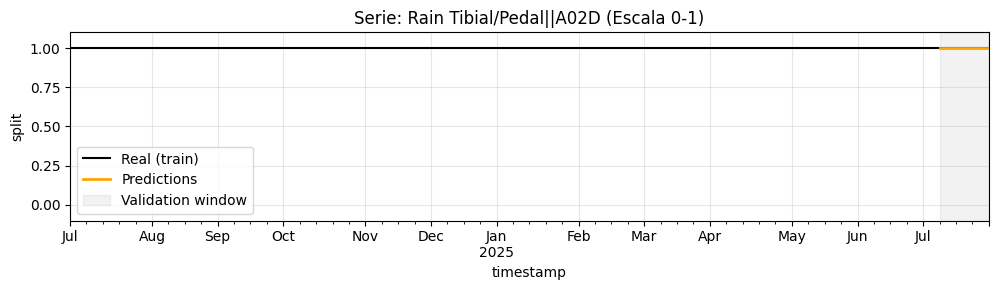


Serie: S.M.A.R.T. RADIANZ||T01D
       y  pred  abs_error
82   1.0   1.0        0.0
221  1.0   1.0        0.0
360  1.0   1.0        0.0
499  1.0   1.0        0.0
MAE 0.000000


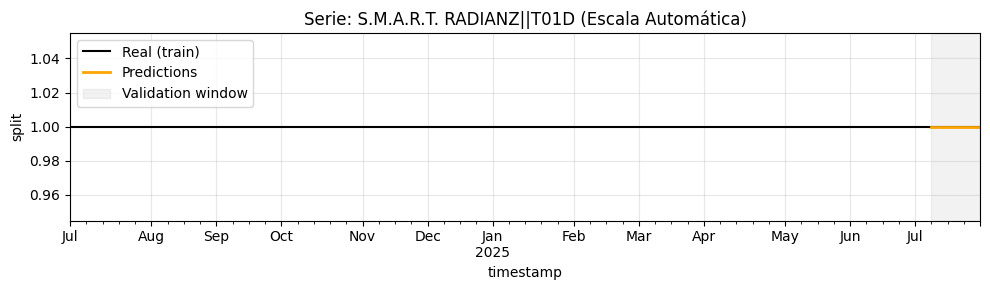

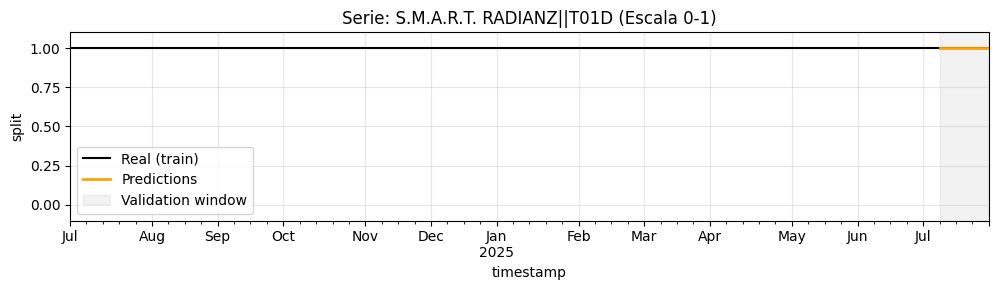


Serie: SABER||EM_D06
       y  pred  abs_error
83   1.0   1.0        0.0
222  1.0   1.0        0.0
361  1.0   1.0        0.0
500  1.0   1.0        0.0
MAE 0.000000


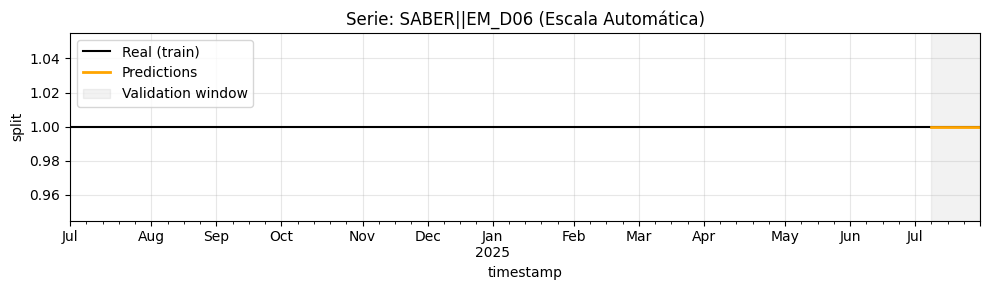

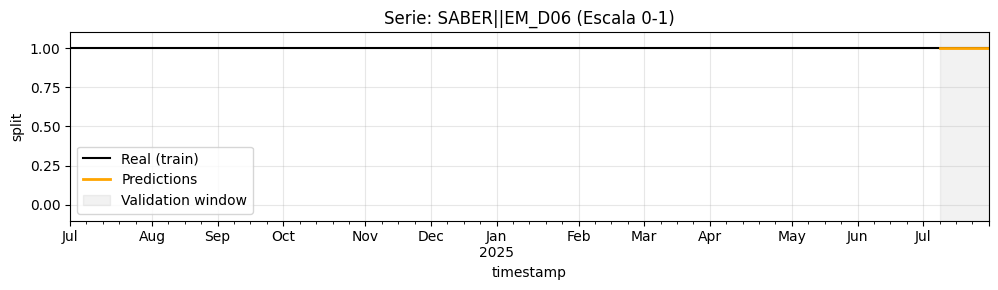


Serie: SABER .014||EM_O91
       y  pred  abs_error
84   1.0   1.0        0.0
223  1.0   1.0        0.0
362  1.0   1.0        0.0
501  1.0   1.0        0.0
MAE 0.000000


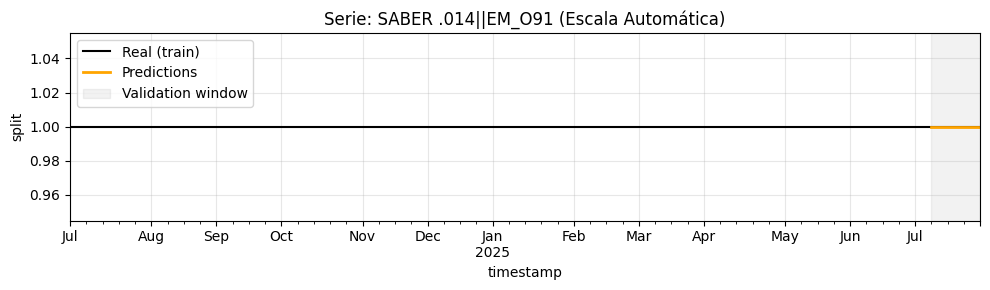

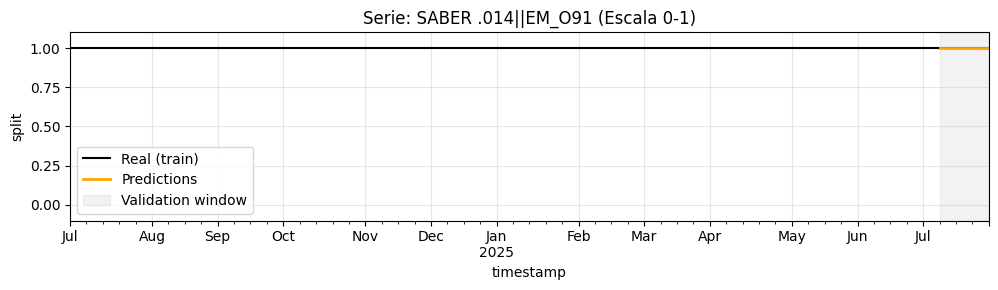


Serie: SABER .035||EM_D04
            y      pred  abs_error
85   0.999911  0.999733   0.000178
224  0.999910  0.999329   0.000581
363  0.999896  0.998190   0.001706
502  0.999891  0.997927   0.001964
MAE 0.001107


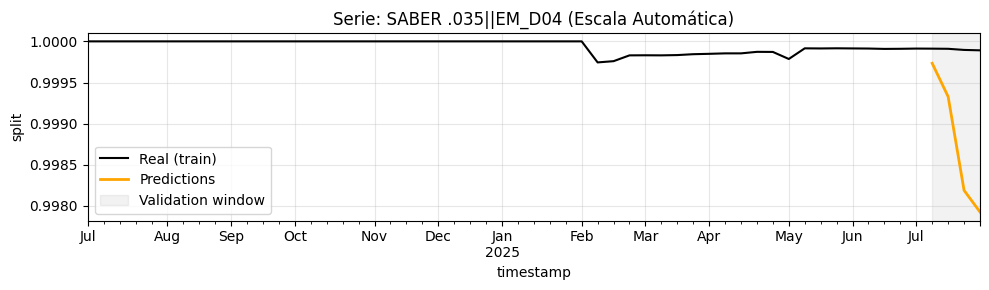

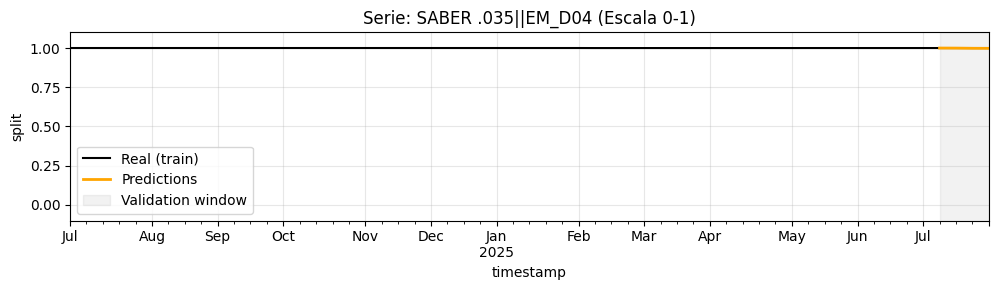


Serie: SABER .035||EM_D06
            y      pred  abs_error
86   0.000089  0.000267   0.000178
225  0.000090  0.000671   0.000581
364  0.000104  0.001810   0.001706
503  0.000109  0.002073   0.001964
MAE 0.001107


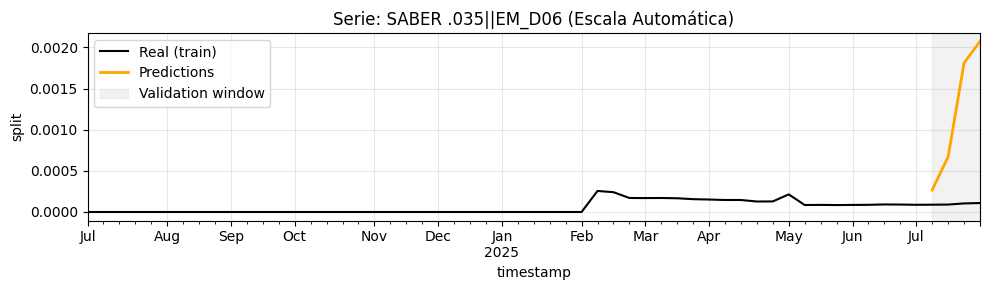

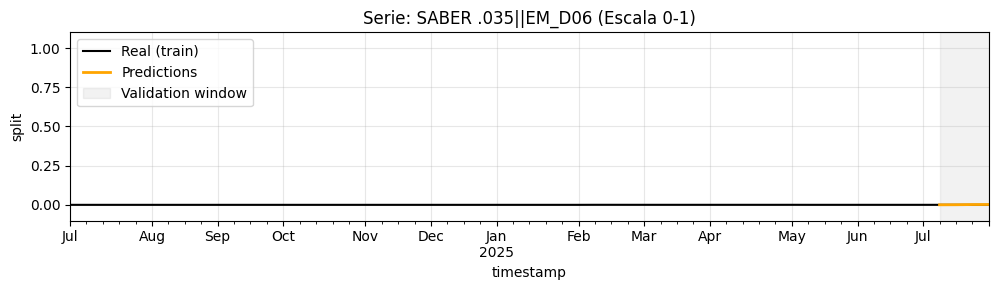


Serie: SABERX .014||EM_O91
       y  pred  abs_error
87   1.0   1.0        0.0
226  1.0   1.0        0.0
365  1.0   1.0        0.0
504  1.0   1.0        0.0
MAE 0.000000


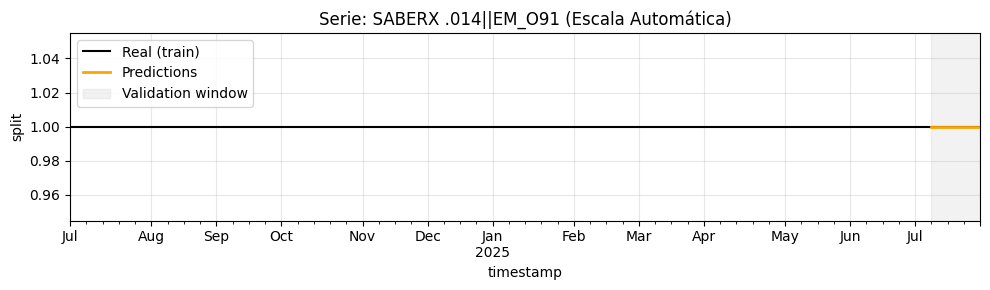

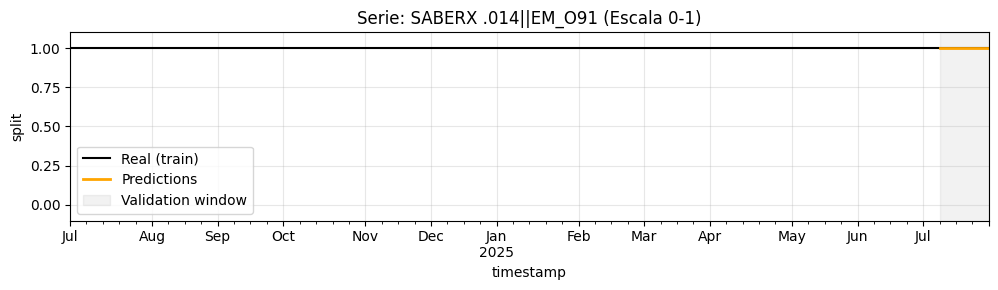


Serie: SABERX RADIANZ||EM_D06
       y  pred  abs_error
88   1.0   1.0        0.0
227  1.0   1.0        0.0
366  1.0   1.0        0.0
505  1.0   1.0        0.0
MAE 0.000000


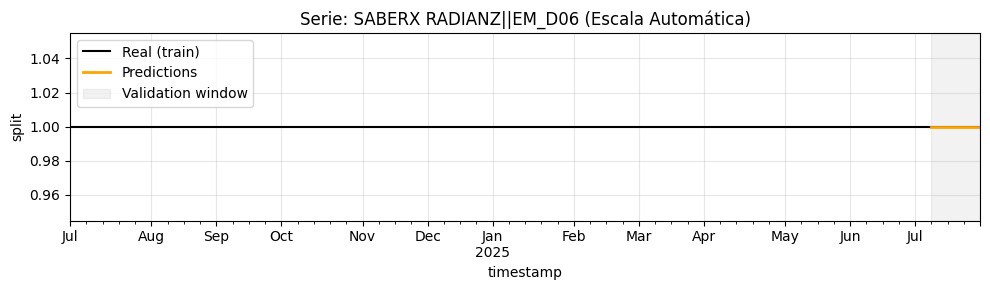

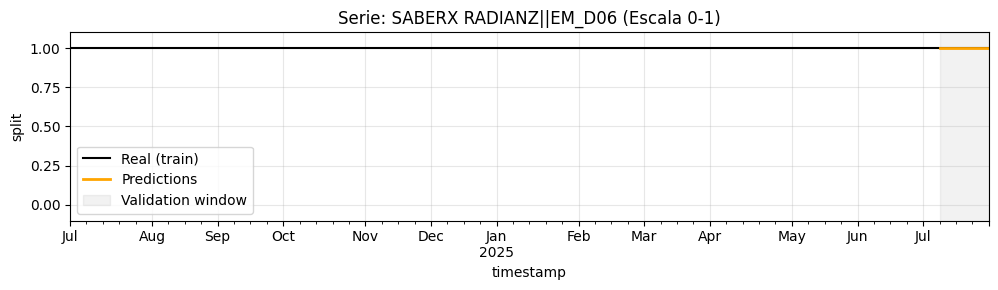


Serie: SHINOBI||EM_L51
       y  pred  abs_error
89   1.0   1.0        0.0
228  1.0   1.0        0.0
367  1.0   1.0        0.0
506  1.0   1.0        0.0
MAE 0.000000


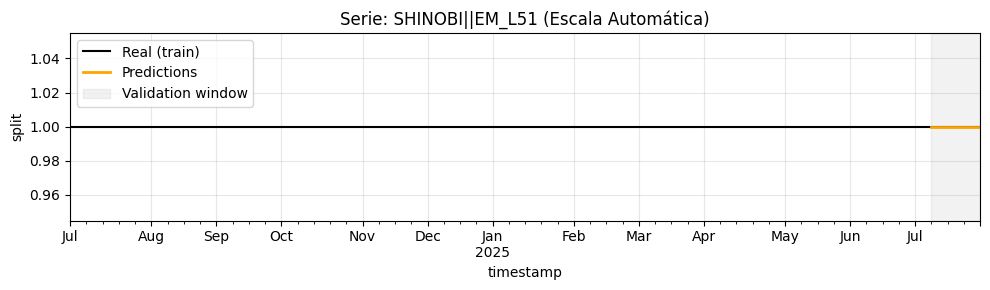

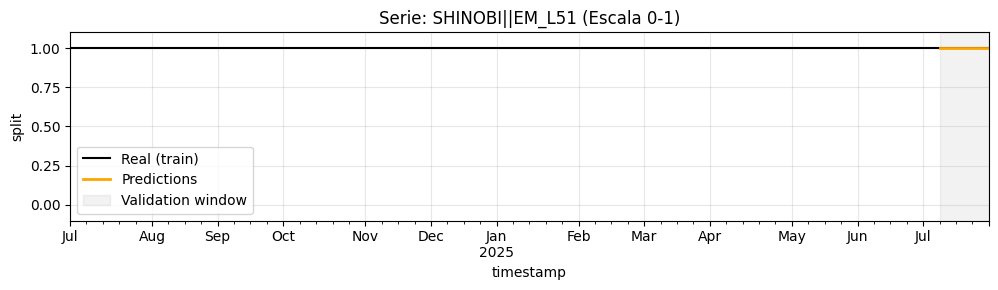


Serie: SLALOM||EM_D03
       y  pred  abs_error
90   1.0   1.0        0.0
229  1.0   1.0        0.0
368  1.0   1.0        0.0
507  1.0   1.0        0.0
MAE 0.000000


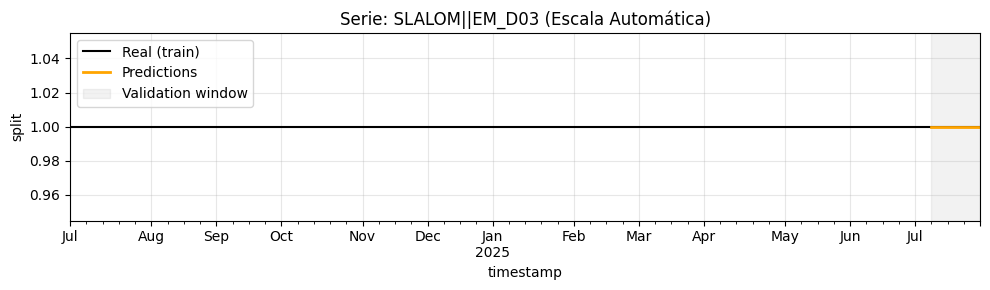

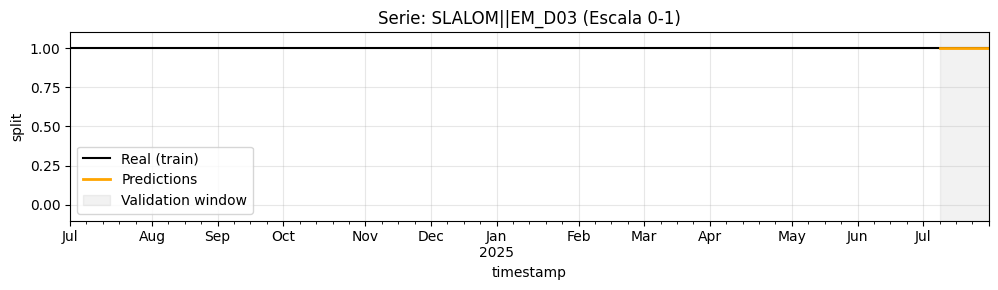


Serie: SLEEK||EM_O07_NL
       y  pred  abs_error
91   1.0   1.0        0.0
230  1.0   1.0        0.0
369  1.0   1.0        0.0
508  1.0   1.0        0.0
MAE 0.000000


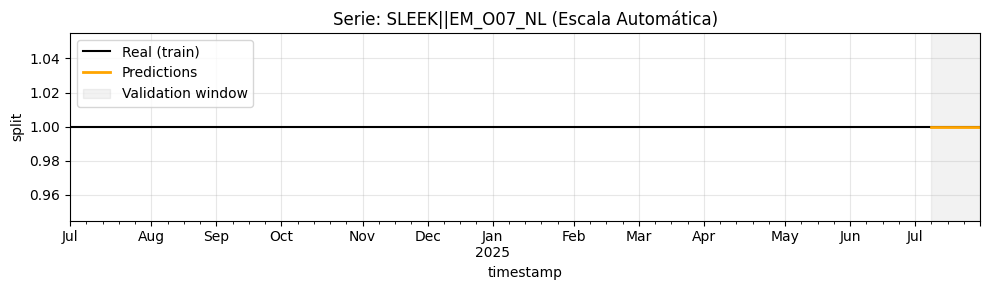

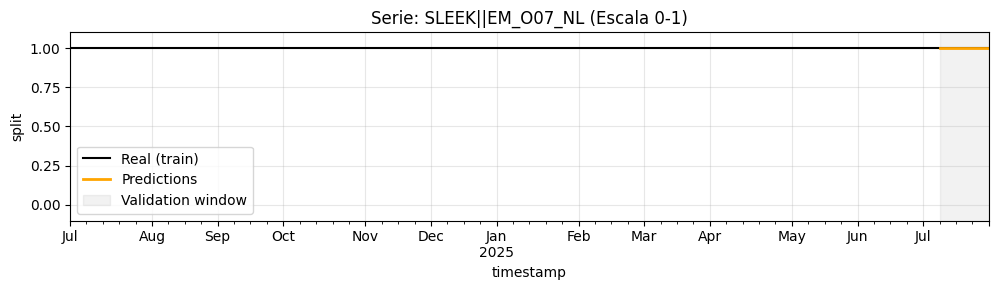


Serie: SLEEK OTW||EM_O07_NL
       y  pred  abs_error
92   1.0   1.0        0.0
231  1.0   1.0        0.0
370  1.0   1.0        0.0
509  1.0   1.0        0.0
MAE 0.000000


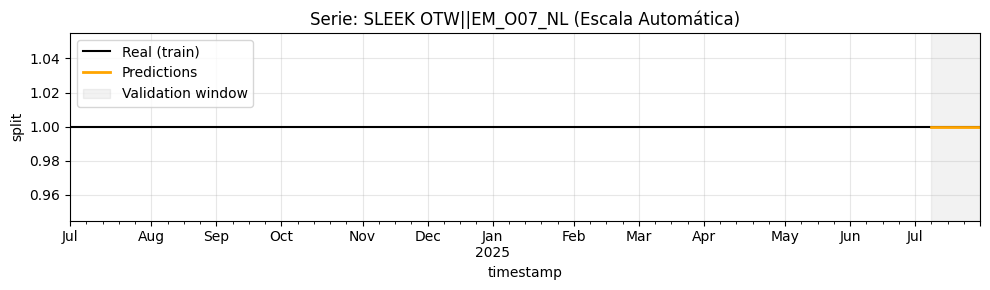

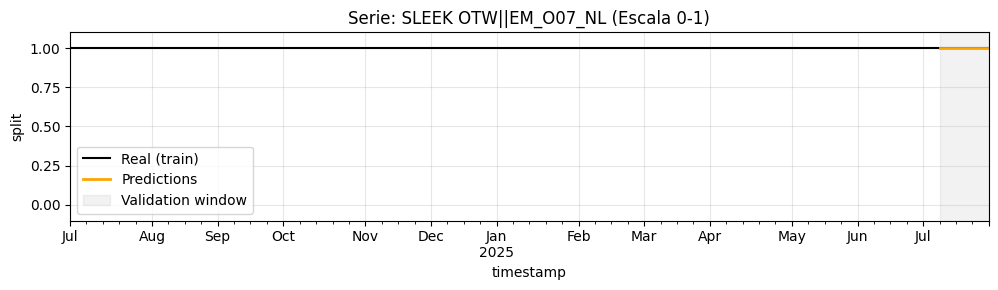


Serie: SMART||T01A
            y      pred  abs_error
93   0.112060  0.112804   0.000744
232  0.110283  0.112961   0.002678
371  0.127303  0.114304   0.013000
510  0.124528  0.113662   0.010866
MAE 0.006822


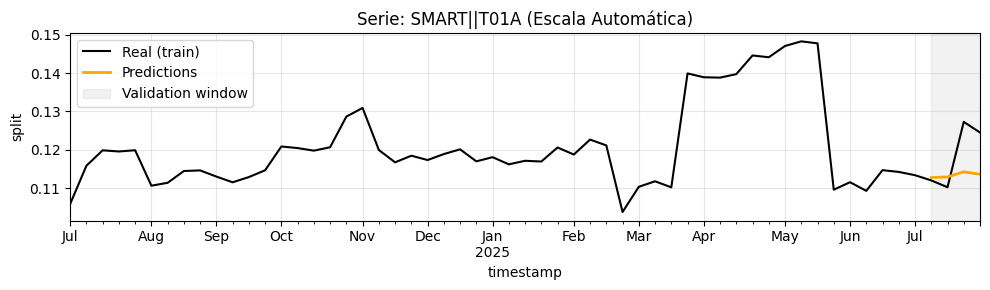

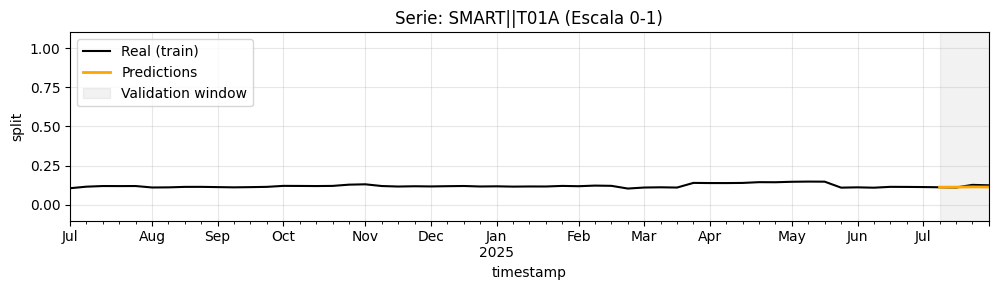


Serie: SMART||T01B
            y      pred  abs_error
94   0.096599  0.098011   0.001412
233  0.098038  0.098596   0.000558
372  0.109524  0.103790   0.005734
511  0.109602  0.106236   0.003365
MAE 0.002767


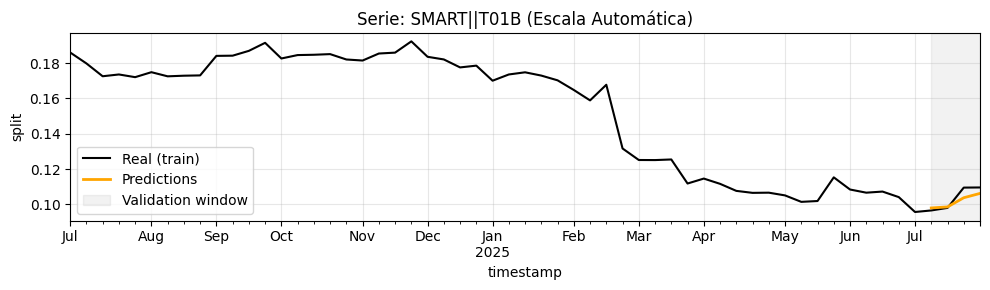

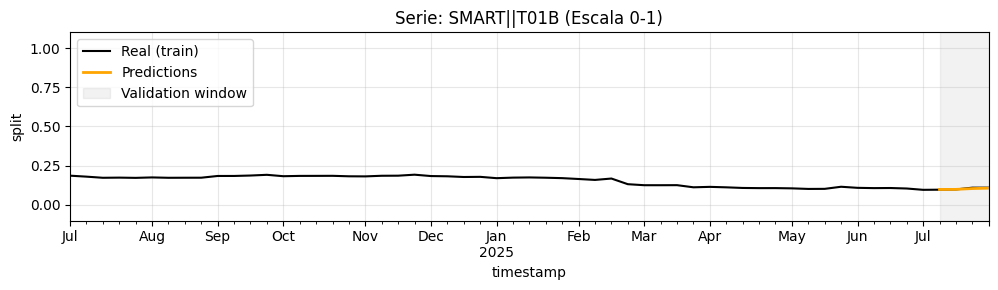


Serie: SMART||T01C
            y      pred  abs_error
95   0.791341  0.789185   0.002156
234  0.791679  0.788442   0.003237
373  0.763173  0.781906   0.018733
512  0.765870  0.780101   0.014231
MAE 0.009589


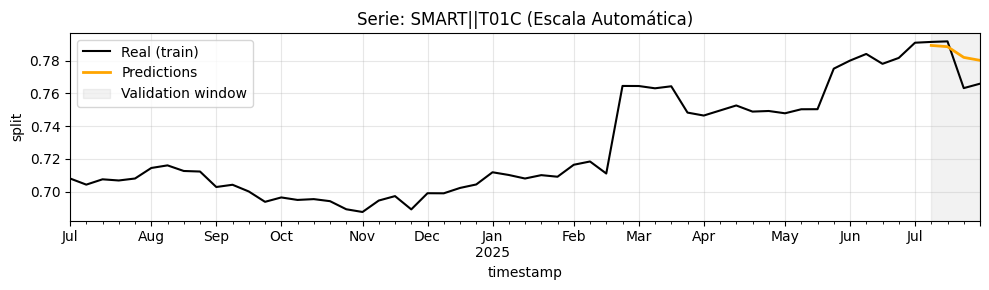

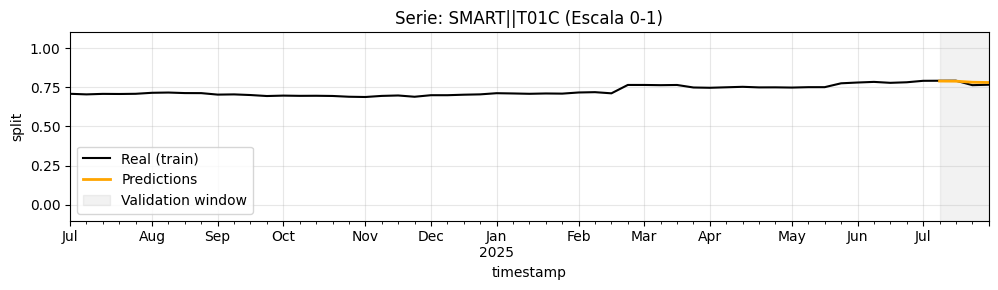


Serie: SMART FLEX||EM_O79
       y  pred  abs_error
96   1.0   1.0        0.0
235  1.0   1.0        0.0
374  1.0   1.0        0.0
513  1.0   1.0        0.0
MAE 0.000000


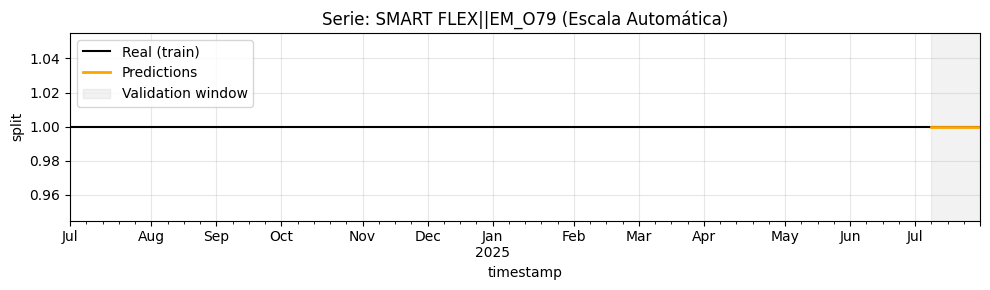

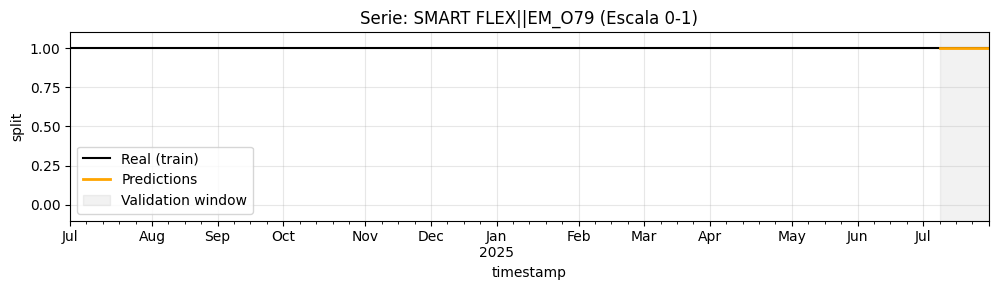


Serie: STABILIZER||EM_K60
       y  pred  abs_error
97   1.0   1.0        0.0
236  1.0   1.0        0.0
375  1.0   1.0        0.0
514  1.0   1.0        0.0
MAE 0.000000


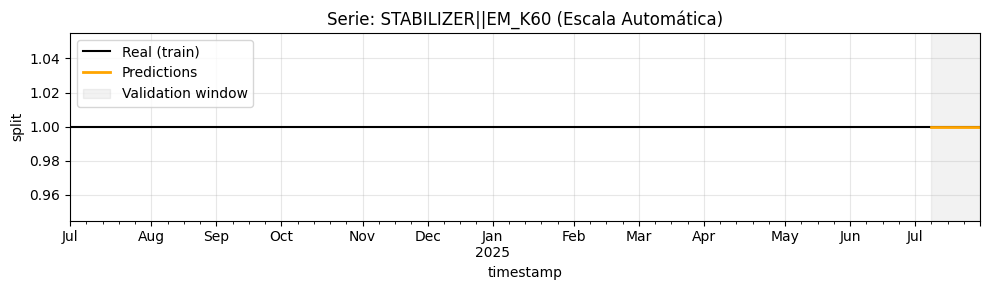

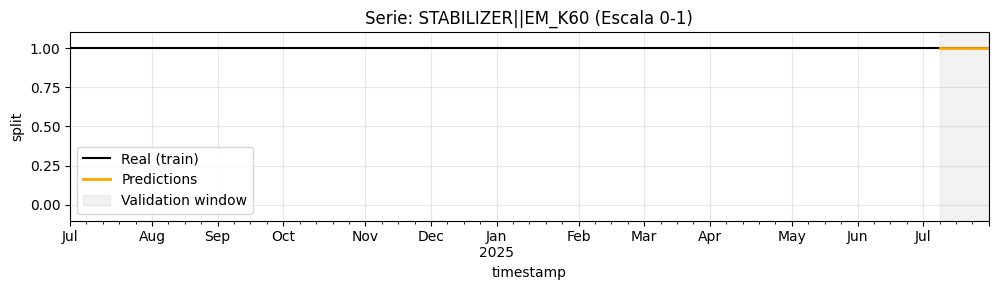


Serie: STORQ||EM_L60
       y  pred  abs_error
98   1.0   1.0        0.0
237  1.0   1.0        0.0
376  1.0   1.0        0.0
515  1.0   1.0        0.0
MAE 0.000000


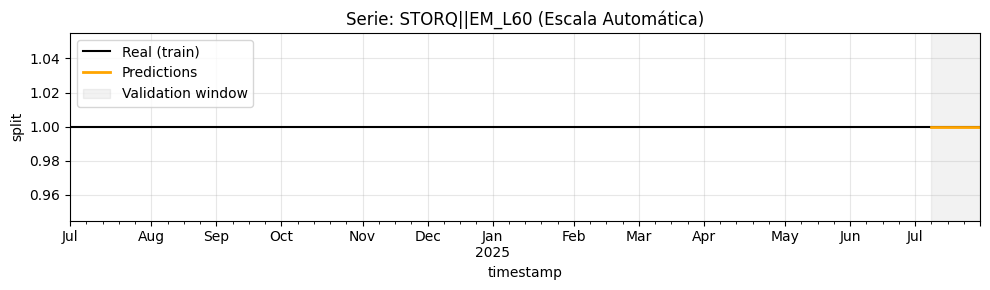

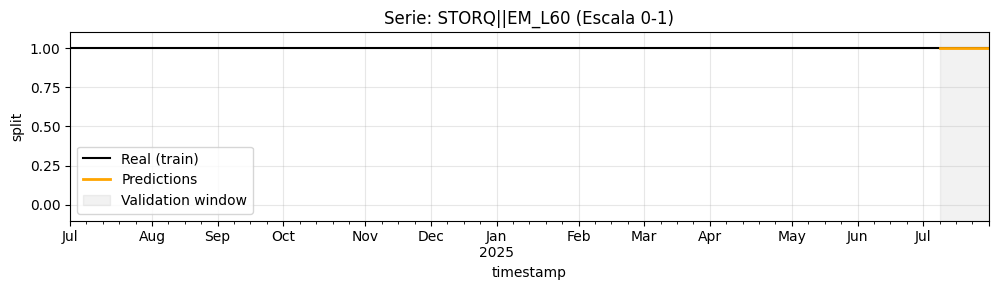


Serie: SUPER TORQUE MARKER BANDS||C04E
       y  pred  abs_error
99   1.0   1.0        0.0
238  1.0   1.0        0.0
377  1.0   1.0        0.0
516  1.0   1.0        0.0
MAE 0.000000


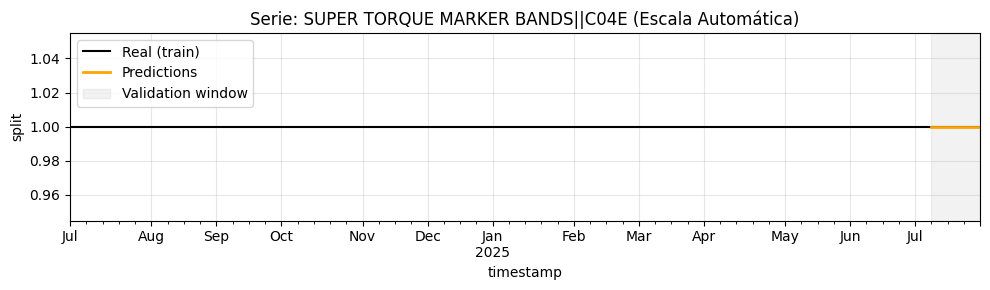

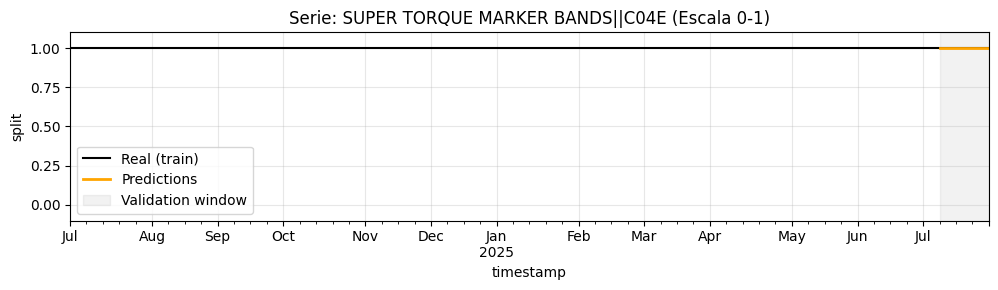


Serie: SUPERTORQUE||C03D
            y      pred  abs_error
100  0.148636  0.153590   0.004954
239  0.152068  0.154594   0.002525
378  0.136866  0.156182   0.019316
517  0.134617  0.156503   0.021886
MAE 0.012170


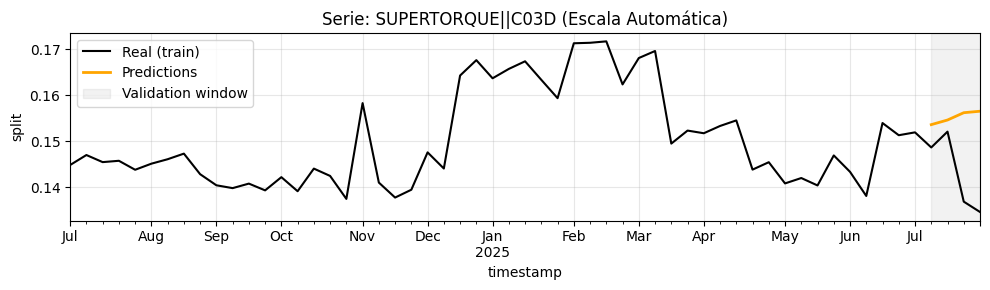

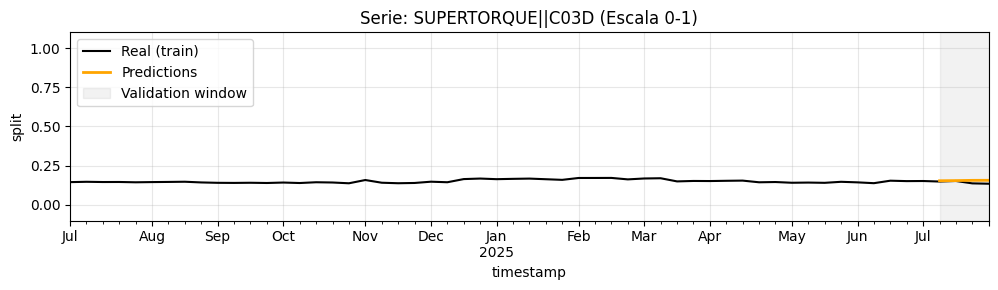


Serie: SUPERTORQUE||C03E
            y      pred  abs_error
101  0.166872  0.165651   0.001221
240  0.166801  0.164914   0.001887
379  0.176183  0.165173   0.011009
518  0.174841  0.165353   0.009488
MAE 0.005901


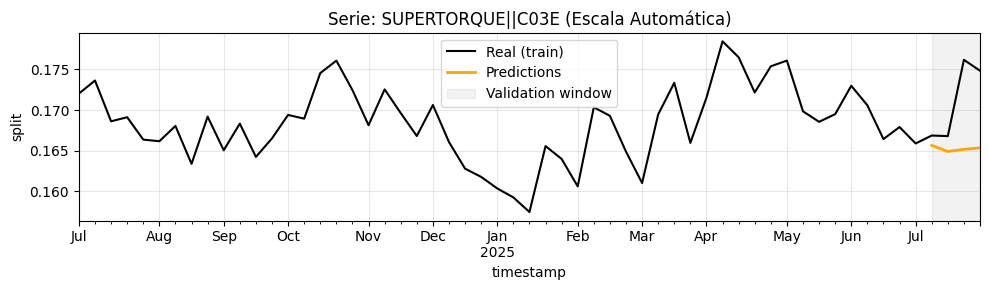

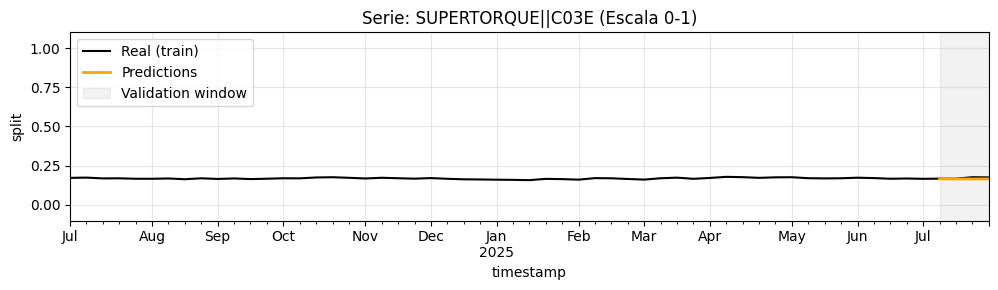


Serie: SUPERTORQUE||C04A
            y      pred  abs_error
102  0.005983  0.004945   0.001038
241  0.005950  0.004695   0.001255
380  0.001357  0.004435   0.003078
519  0.001410  0.004553   0.003143
MAE 0.002129


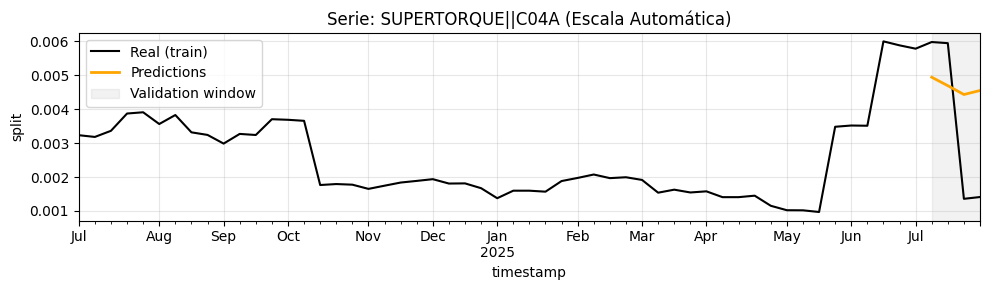

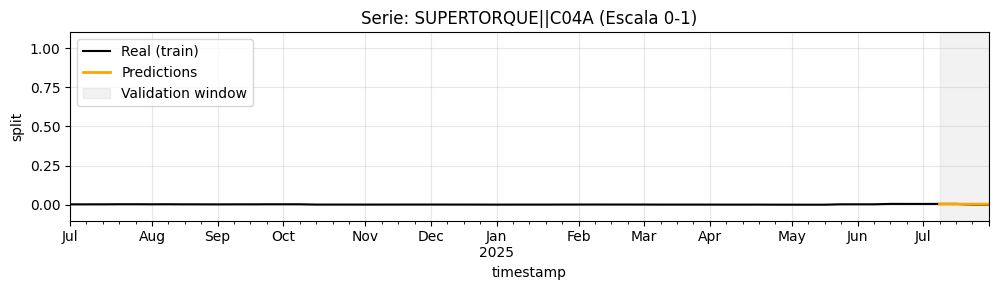


Serie: SUPERTORQUE||C12C
            y      pred  abs_error
103  0.678509  0.675814   0.002695
242  0.675181  0.675798   0.000617
381  0.685595  0.674210   0.011384
520  0.689132  0.673591   0.015541
MAE 0.007559


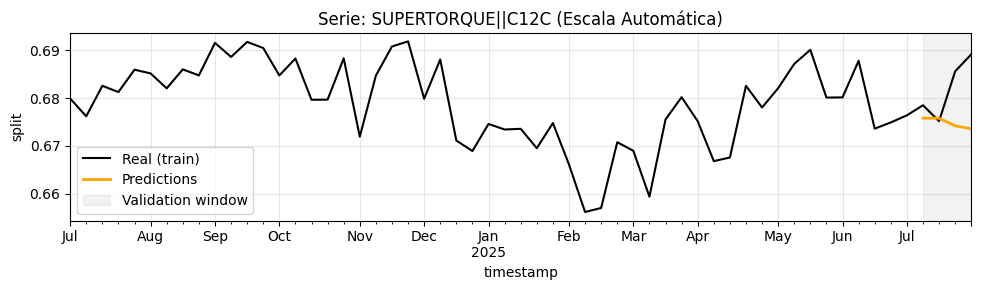

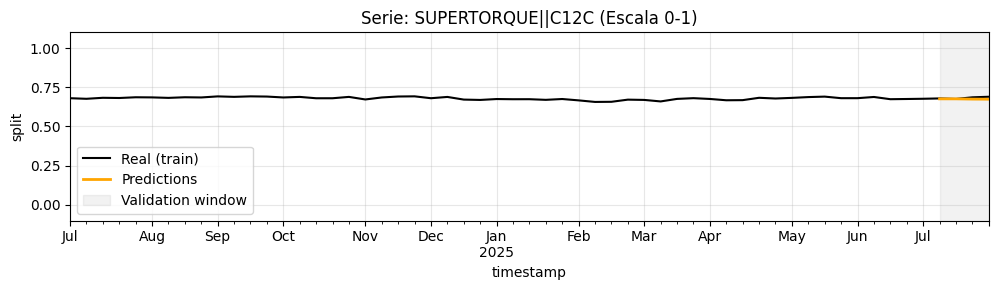


Serie: SUPERTORQUE (MODIFIED)||C05
       y  pred  abs_error
104  1.0   1.0        0.0
243  1.0   1.0        0.0
382  1.0   1.0        0.0
521  1.0   1.0        0.0
MAE 0.000000


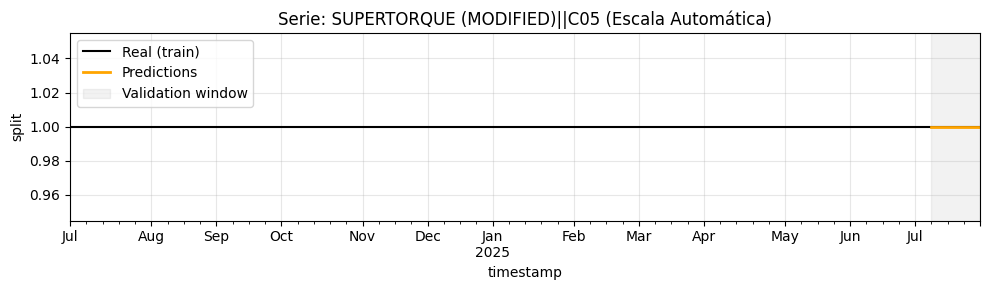

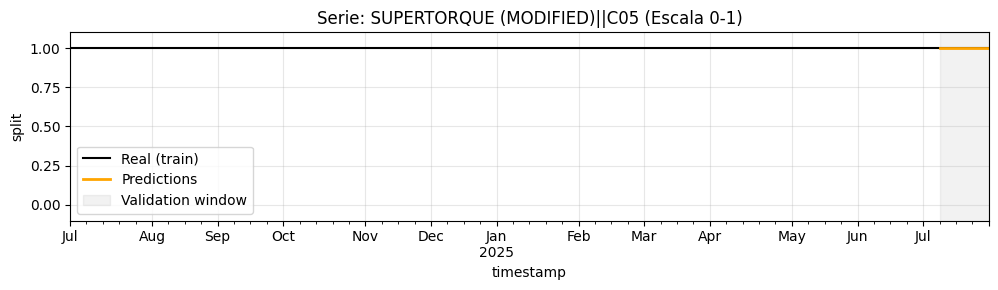


Serie: SUPERTORQUE PLUS||C03C
            y      pred  abs_error
105  0.506665  0.513675   0.007010
244  0.503464  0.511389   0.007925
383  0.514391  0.509307   0.005084
522  0.511249  0.508267   0.002982
MAE 0.005750


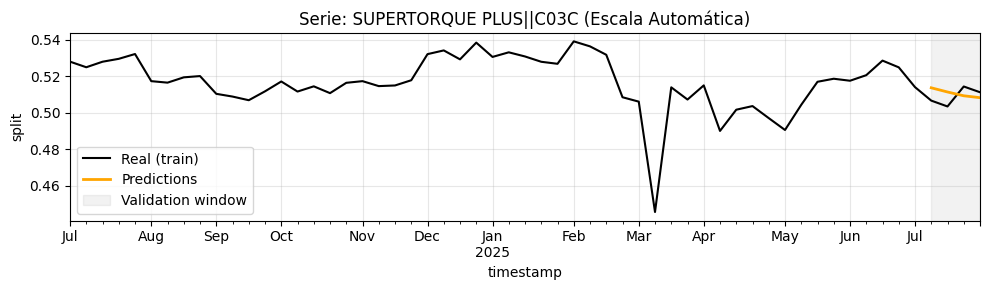

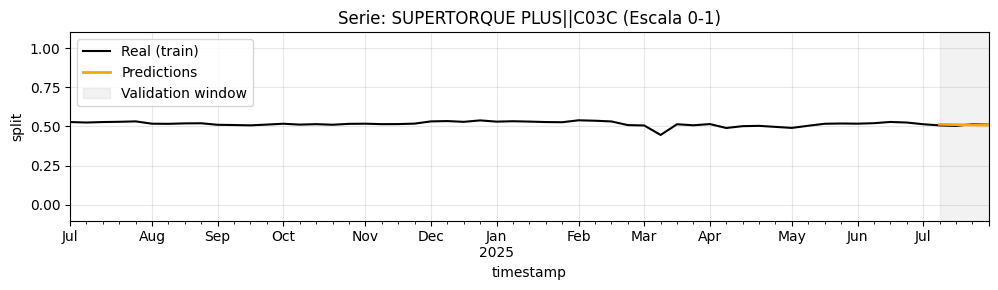


Serie: SUPERTORQUE PLUS||C04B
       y      pred  abs_error
106  0.0  0.000000   0.000000
245  0.0  0.000000   0.000000
384  0.0  0.000002   0.000002
523  0.0  0.000003   0.000003
MAE 0.000001


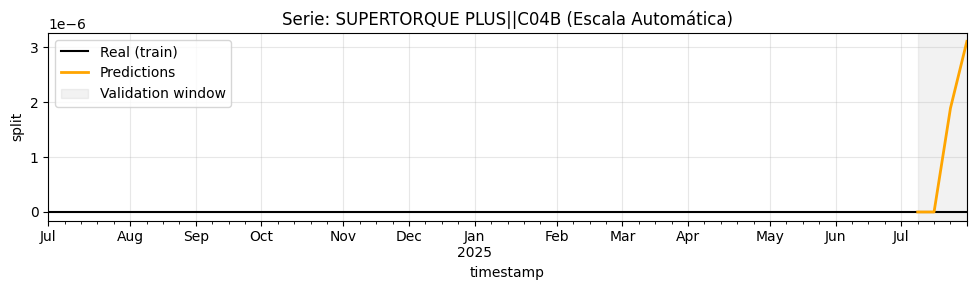

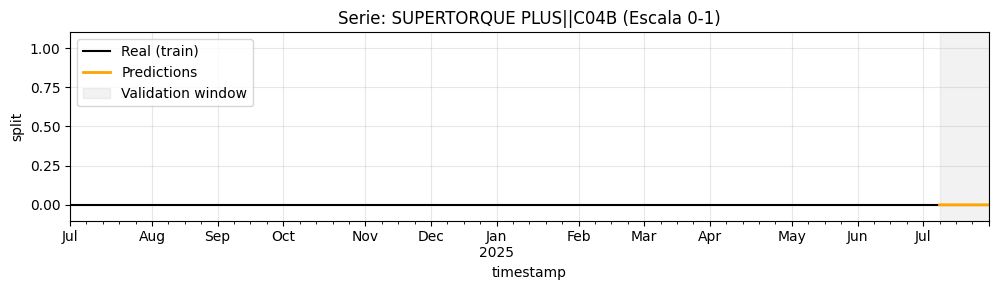


Serie: SUPERTORQUE PLUS||C04C
            y      pred  abs_error
107  0.008536  0.008758   0.000222
246  0.008509  0.008755   0.000246
385  0.008983  0.008789   0.000194
524  0.008951  0.008788   0.000163
MAE 0.000206


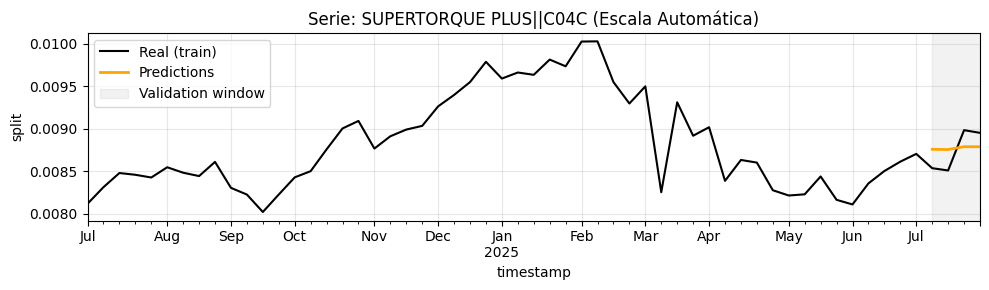

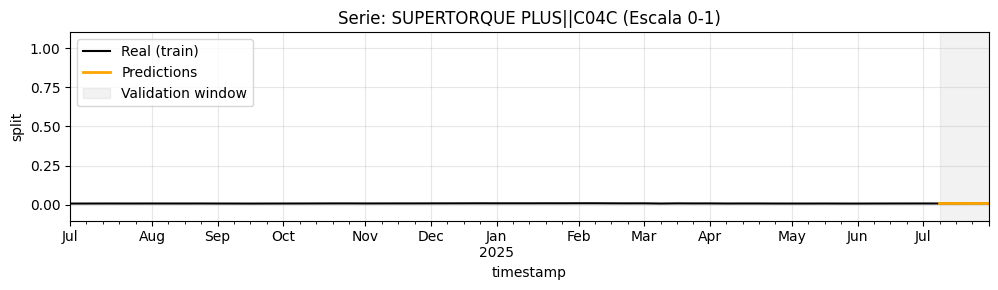


Serie: SUPERTORQUE PLUS||C12D
            y      pred  abs_error
108  0.484799  0.477567   0.007232
247  0.488027  0.479856   0.008171
386  0.476626  0.481903   0.005277
525  0.479799  0.482941   0.003142
MAE 0.005955


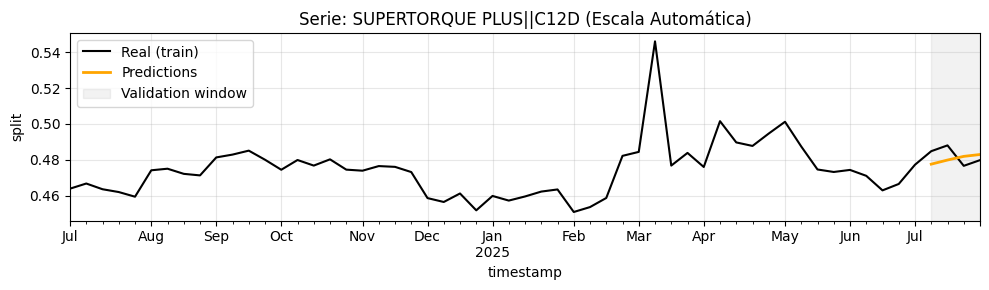

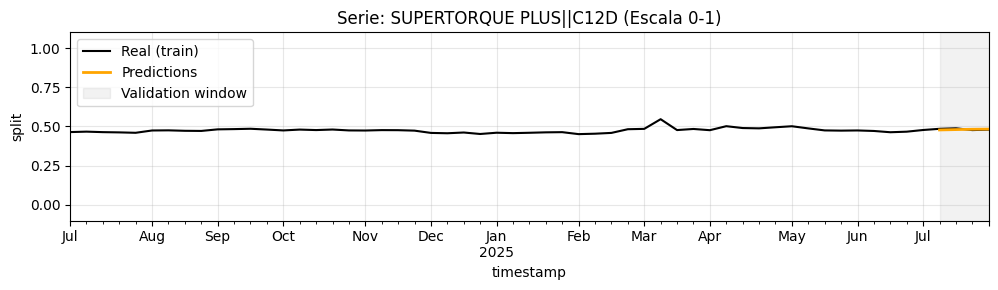


Serie: SUPERTORQUE PLUS (MODIFIED)||C04B
            y      pred  abs_error
109  0.187729  0.195375   0.007646
248  0.183224  0.198789   0.015565
387  0.193582  0.203811   0.010229
526  0.190611  0.204409   0.013798
MAE 0.011810


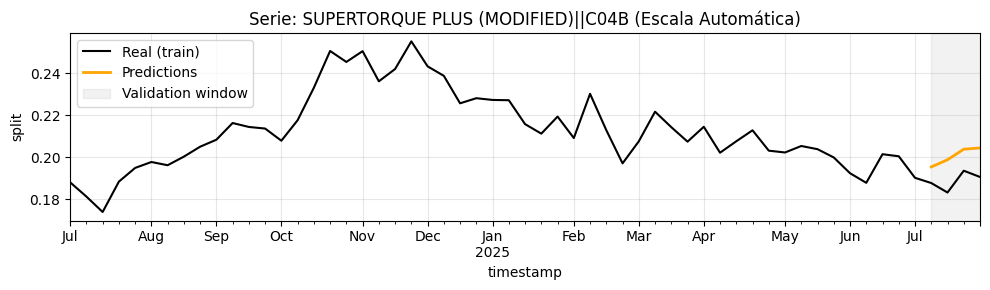

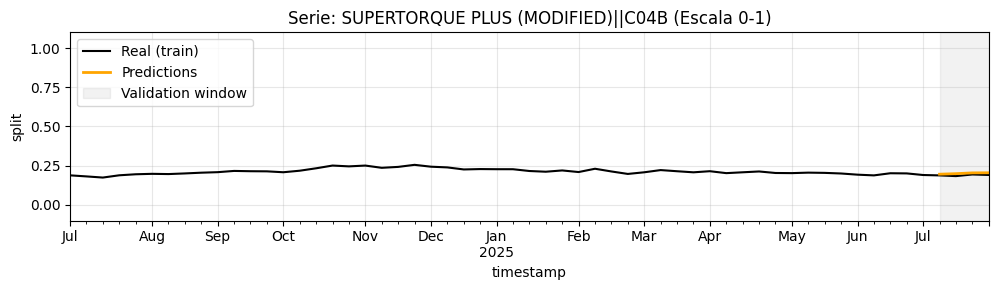


Serie: SUPERTORQUE PLUS (MODIFIED)||C05
            y      pred  abs_error
110  0.812271  0.804625   0.007646
249  0.816776  0.801211   0.015565
388  0.806418  0.796189   0.010229
527  0.809389  0.795591   0.013798
MAE 0.011810


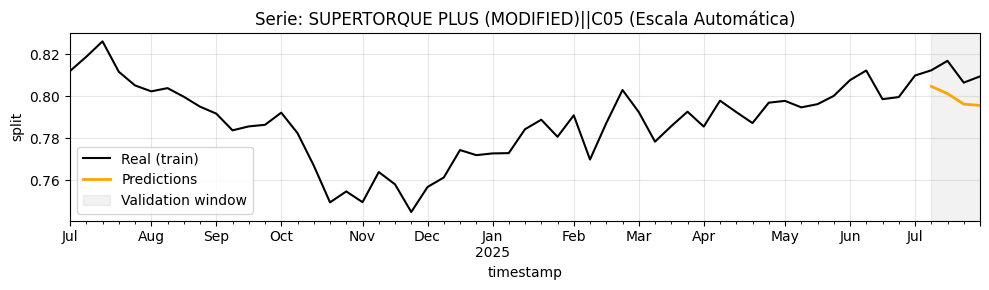

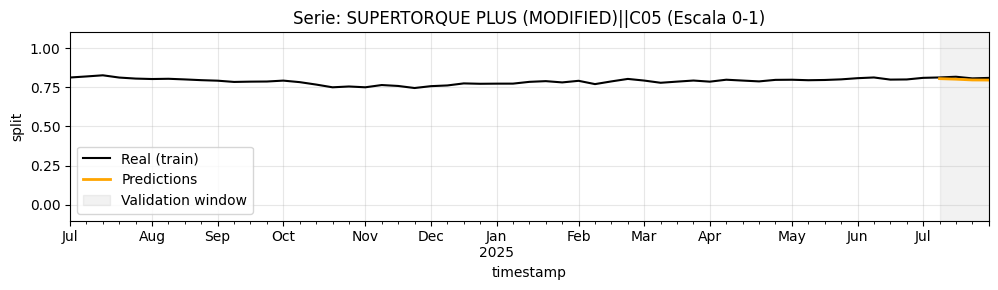


Serie: SV WIRE||EM_K60
       y  pred  abs_error
111  1.0   1.0        0.0
250  1.0   1.0        0.0
389  1.0   1.0        0.0
528  1.0   1.0        0.0
MAE 0.000000


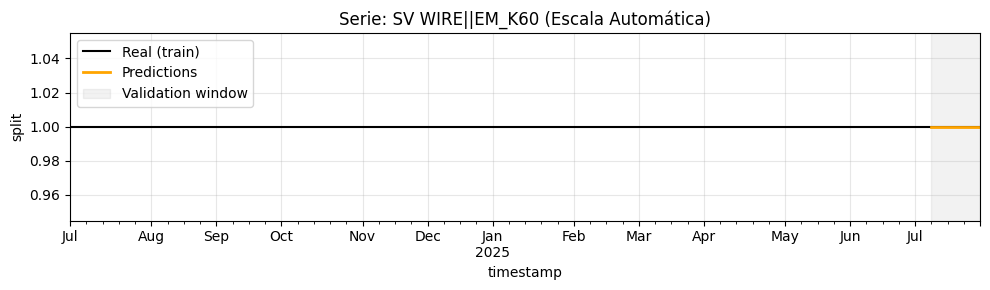

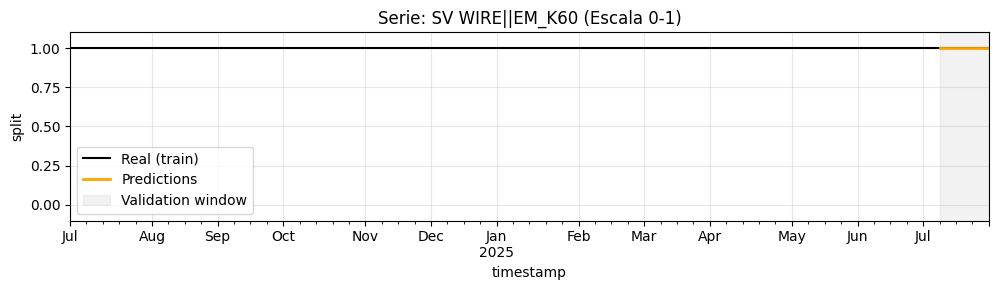


Serie: Selution SLR BTK 2-3.5||EM_O92
       y  pred  abs_error
112  1.0   1.0        0.0
251  1.0   1.0        0.0
390  1.0   1.0        0.0
529  1.0   1.0        0.0
MAE 0.000000


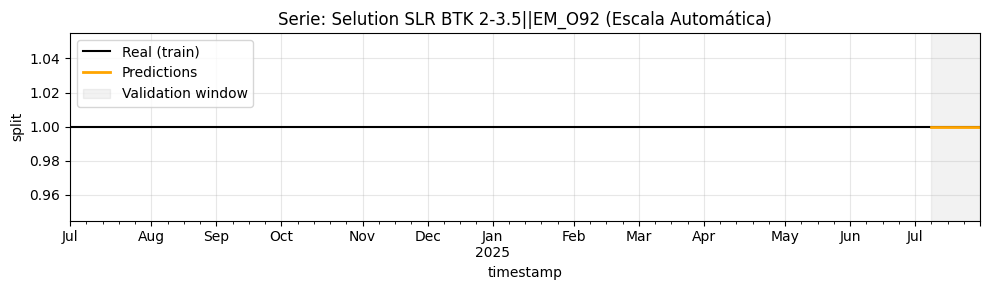

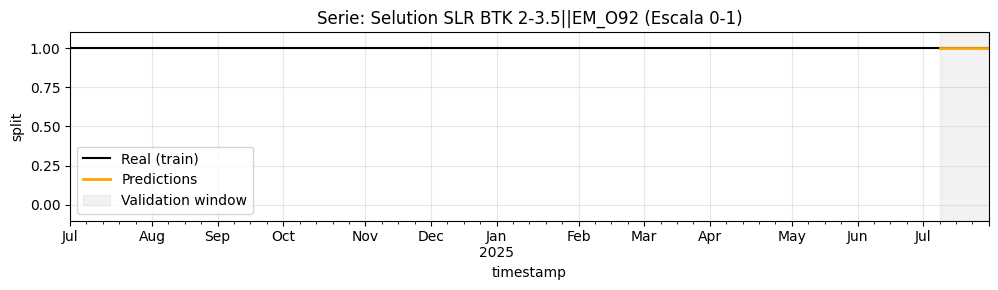


Serie: Selution SLR Coronary||EM_O92
       y  pred  abs_error
113  1.0   1.0        0.0
252  1.0   1.0        0.0
391  1.0   1.0        0.0
530  1.0   1.0        0.0
MAE 0.000000


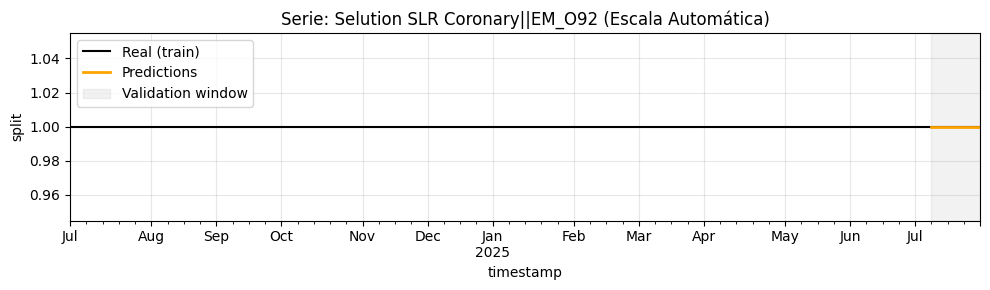

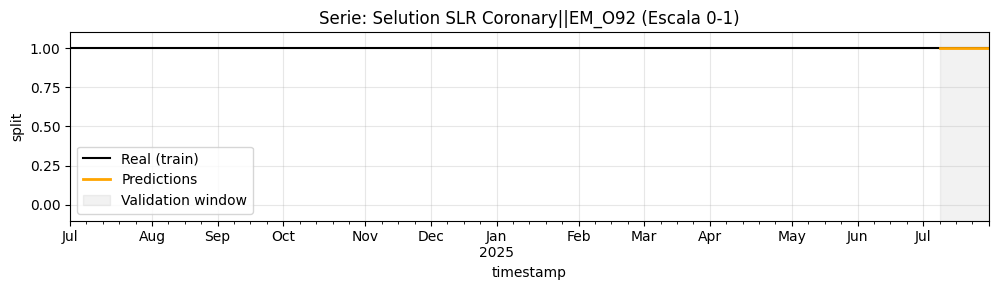


Serie: Selution SLR SFA 4-7||EM_O92
       y  pred  abs_error
114  1.0   1.0        0.0
253  1.0   1.0        0.0
392  1.0   1.0        0.0
531  1.0   1.0        0.0
MAE 0.000000


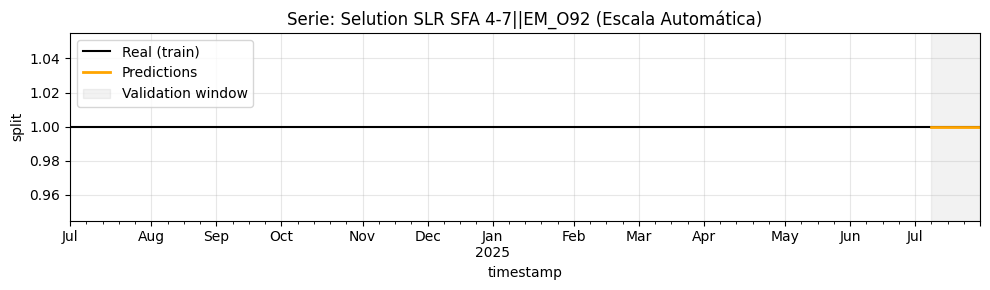

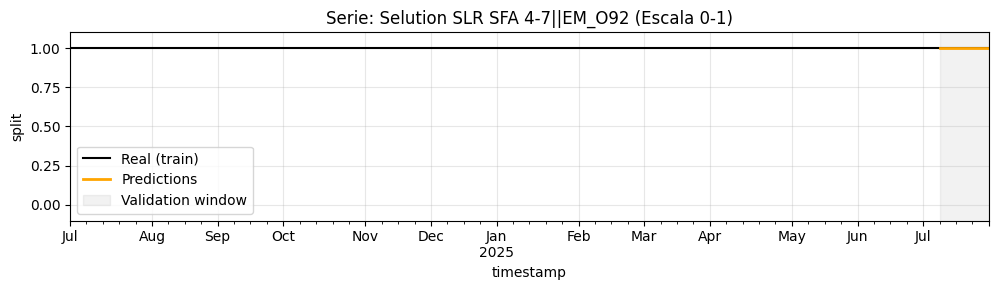


Serie: TEMPO||C03F
            y      pred  abs_error
115  0.298109  0.305982   0.007872
254  0.299414  0.303819   0.004406
393  0.325883  0.307902   0.017981
532  0.327137  0.307741   0.019397
MAE 0.012414


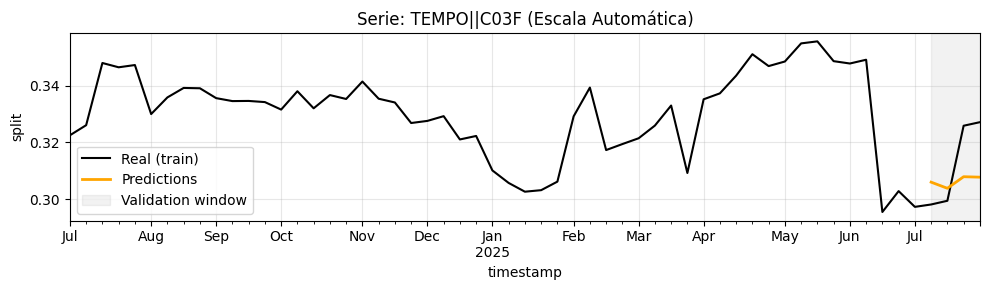

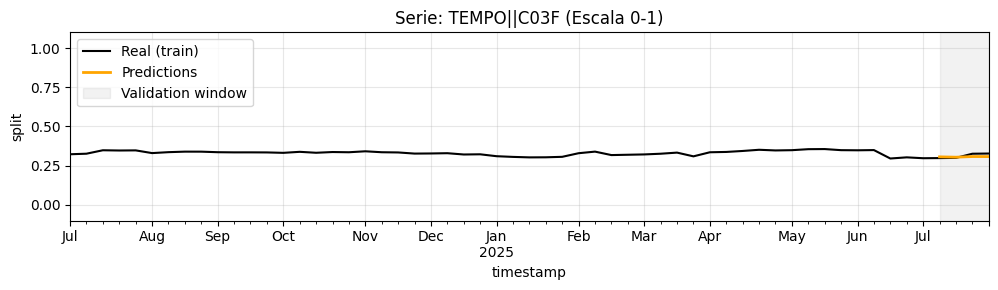


Serie: TEMPO||C03G
            y      pred  abs_error
116  0.701891  0.694018   0.007872
255  0.700586  0.696181   0.004406
394  0.674117  0.692098   0.017981
533  0.672863  0.692259   0.019397
MAE 0.012414


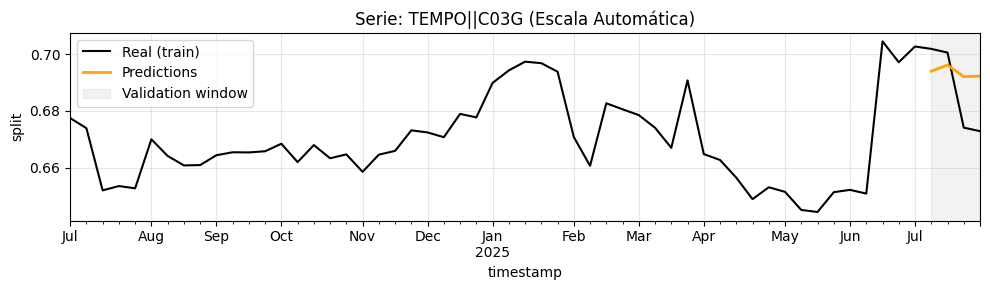

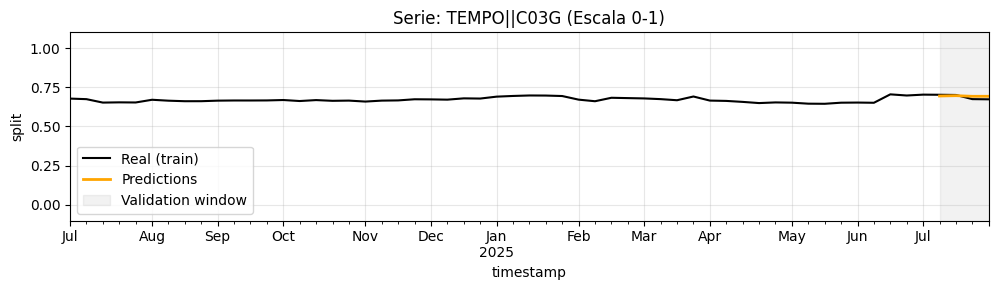


Serie: TEMPO (MODIFIED)||C05
       y  pred  abs_error
117  1.0   1.0        0.0
256  1.0   1.0        0.0
395  1.0   1.0        0.0
534  1.0   1.0        0.0
MAE 0.000000


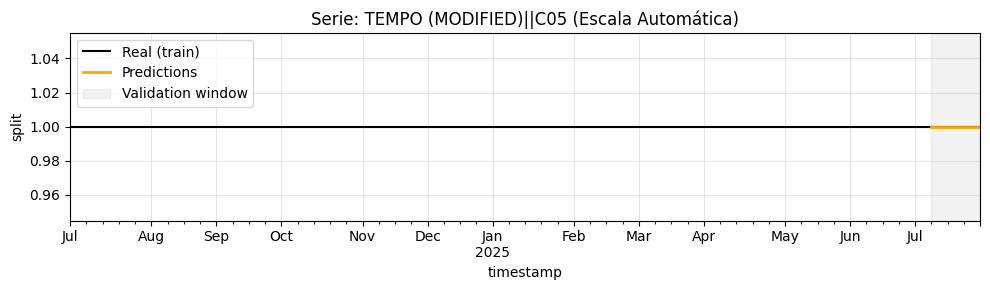

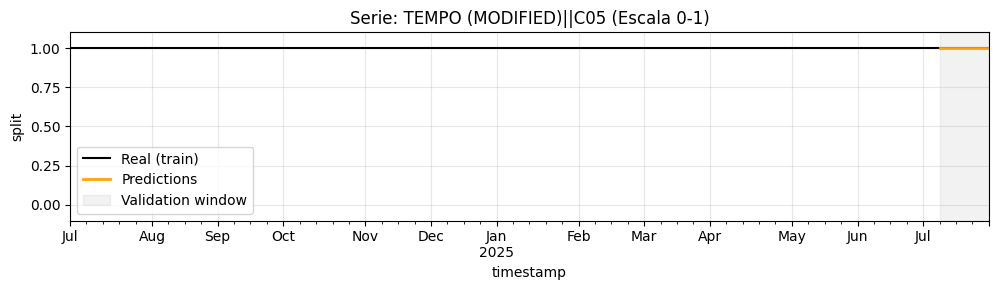


Serie: TEMPO AQUA||C03H
       y  pred  abs_error
118  1.0   1.0        0.0
257  1.0   1.0        0.0
396  1.0   1.0        0.0
535  1.0   1.0        0.0
MAE 0.000000


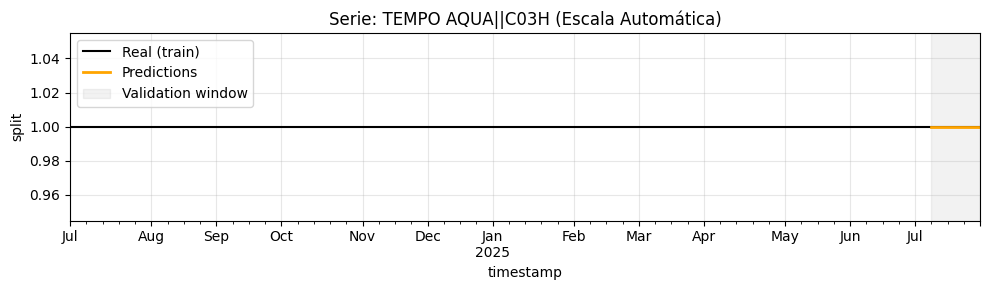

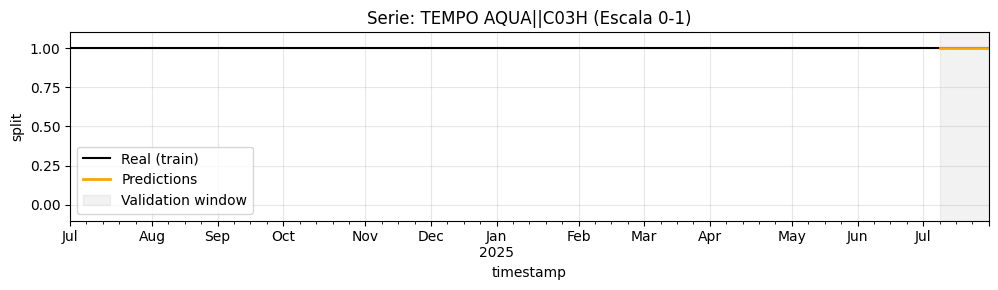


Serie: TEMPO AQUA (MODIFIED)||C05
       y  pred  abs_error
119  1.0   1.0        0.0
258  1.0   1.0        0.0
397  1.0   1.0        0.0
536  1.0   1.0        0.0
MAE 0.000000


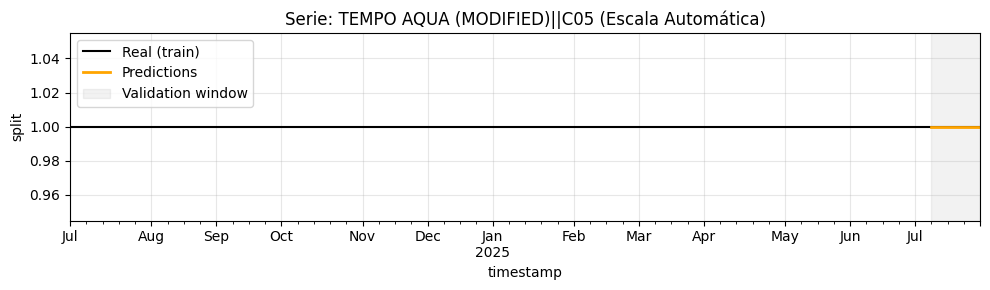

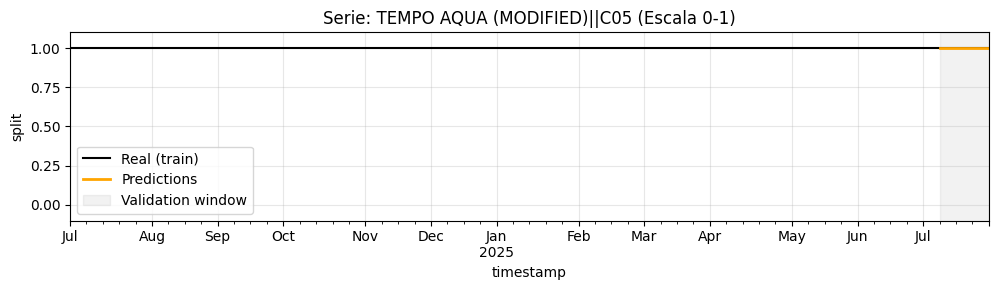


Serie: TORQUE DEVICE||EM_O02_NL
       y  pred  abs_error
120  1.0   1.0        0.0
259  1.0   1.0        0.0
398  1.0   1.0        0.0
537  1.0   1.0        0.0
MAE 0.000000


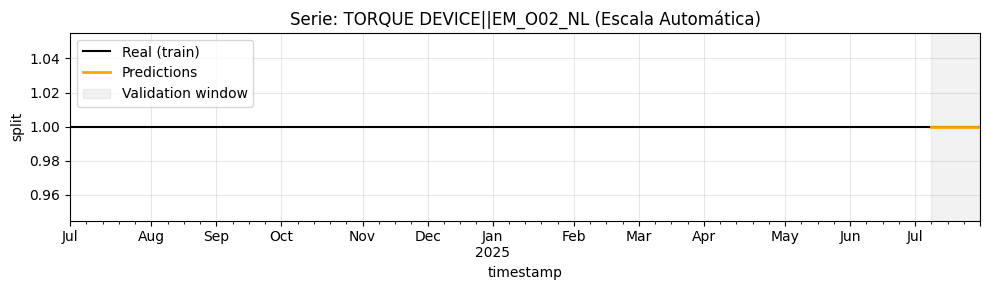

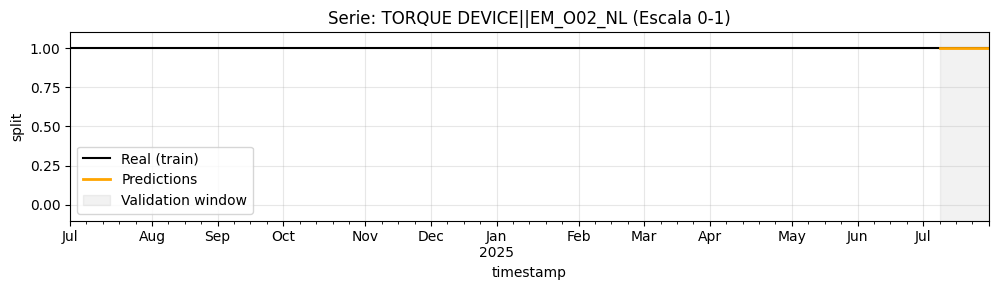


Serie: TRAPEASE||P00
       y  pred  abs_error
121  1.0   1.0        0.0
260  1.0   1.0        0.0
399  1.0   1.0        0.0
538  1.0   1.0        0.0
MAE 0.000000


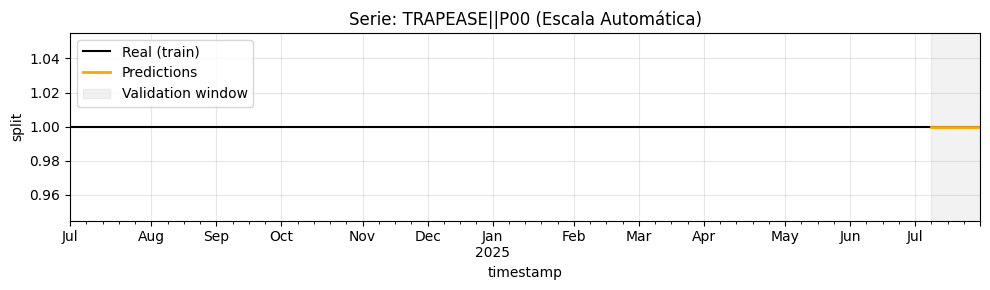

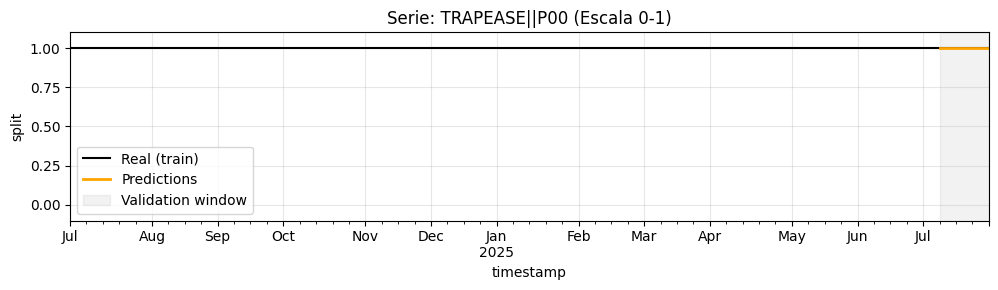


Serie: VASSALLO GT .014||EM_O90
       y  pred  abs_error
122  1.0   1.0        0.0
261  1.0   1.0        0.0
400  1.0   1.0        0.0
539  1.0   1.0        0.0
MAE 0.000000


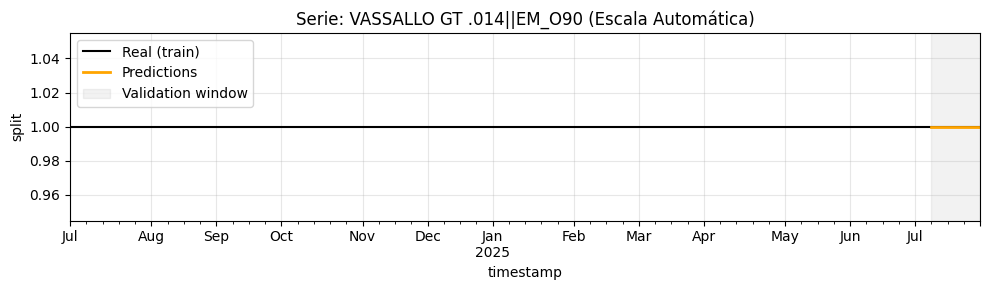

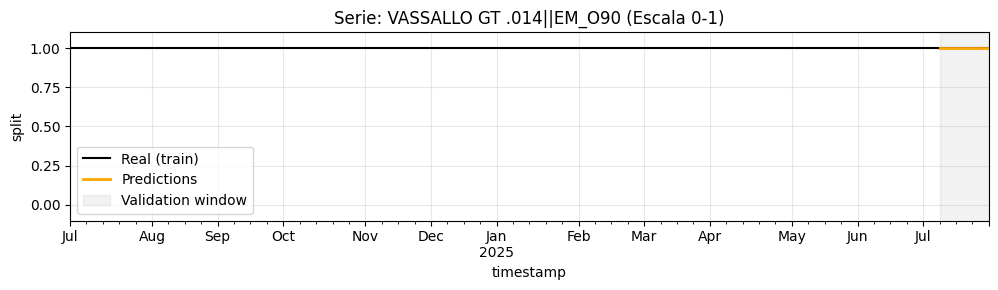


Serie: VASSALLO GT .018||EM_O90
       y  pred  abs_error
123  1.0   1.0        0.0
262  1.0   1.0        0.0
401  1.0   1.0        0.0
540  1.0   1.0        0.0
MAE 0.000000


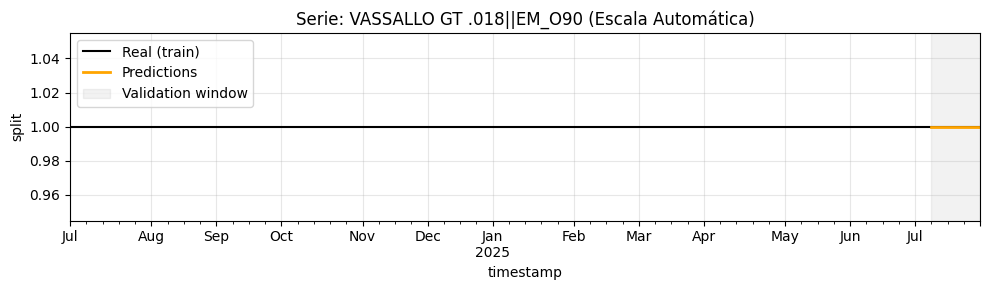

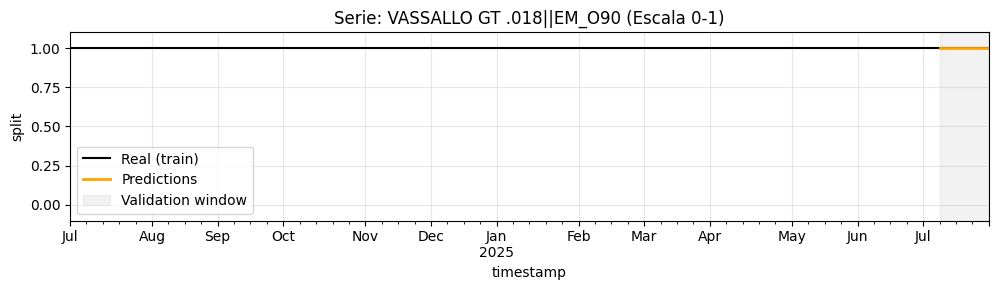


Serie: VASSALLO GT EXT GW||EM_O90
       y  pred  abs_error
124  1.0   1.0        0.0
263  1.0   1.0        0.0
402  1.0   1.0        0.0
541  1.0   1.0        0.0
MAE 0.000000


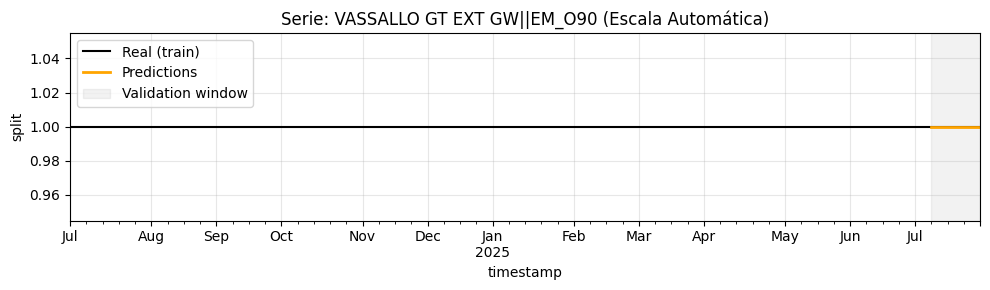

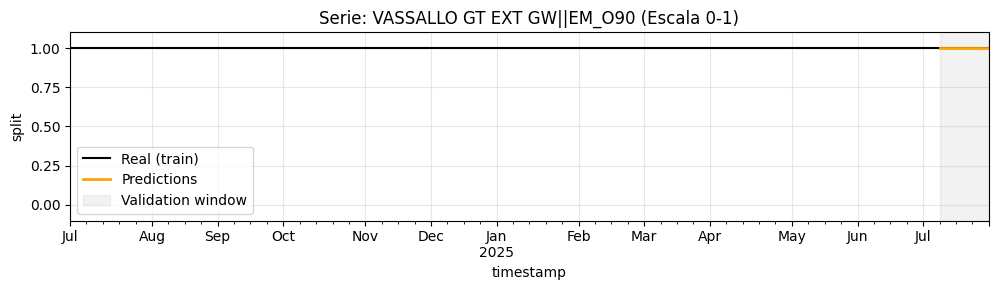


Serie: VESSEL DILATOR||A00B
       y  pred  abs_error
125  1.0   1.0        0.0
264  1.0   1.0        0.0
403  1.0   1.0        0.0
542  1.0   1.0        0.0
MAE 0.000000


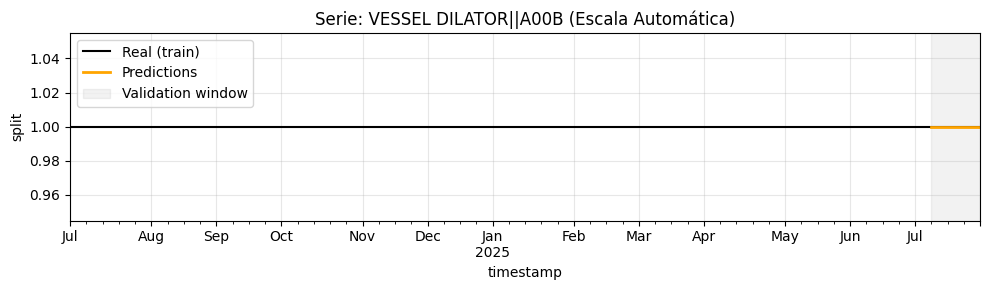

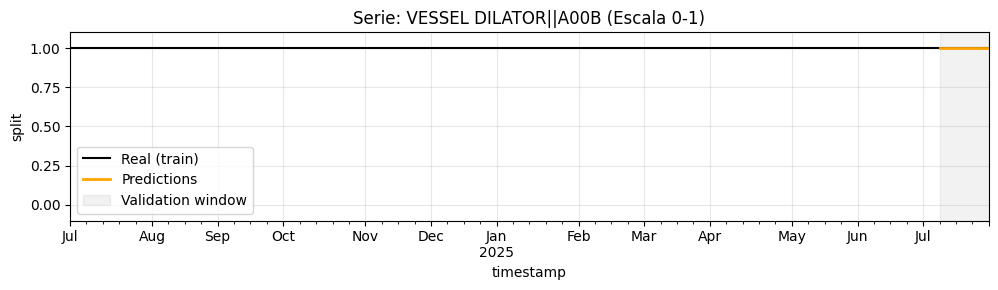


Serie: VISTA BRITE TIP||A01
            y      pred  abs_error
126  0.004333  0.003951   0.000382
265  0.004456  0.003747   0.000709
404  0.003779  0.003538   0.000241
543  0.003644  0.003431   0.000213
MAE 0.000386


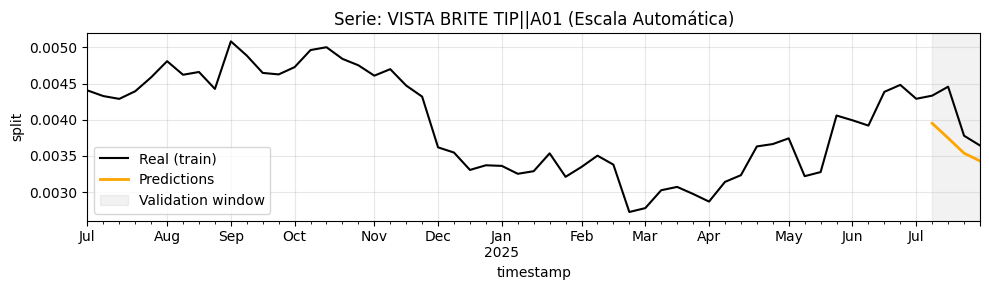

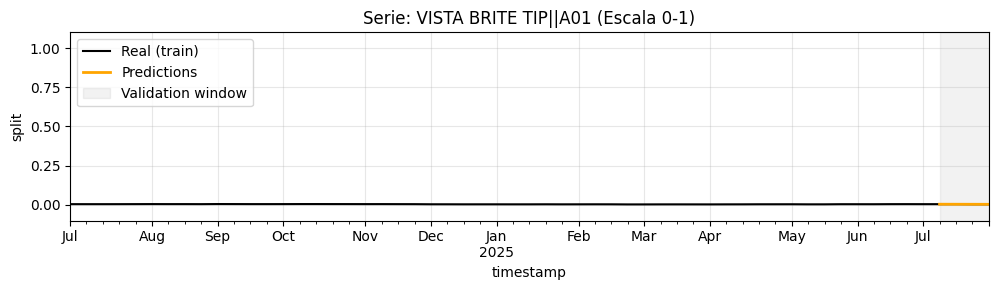


Serie: VISTA BRITE TIP||E00C
            y      pred  abs_error
127  0.000756  0.000690   0.000066
266  0.000777  0.000712   0.000065
405  0.002344  0.000803   0.001541
544  0.002397  0.000855   0.001542
MAE 0.000803


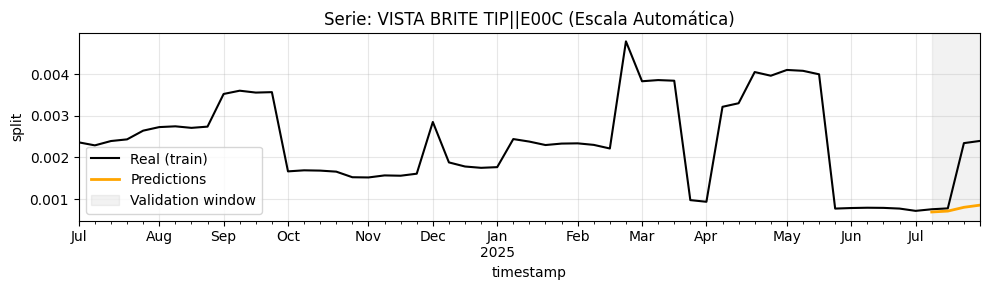

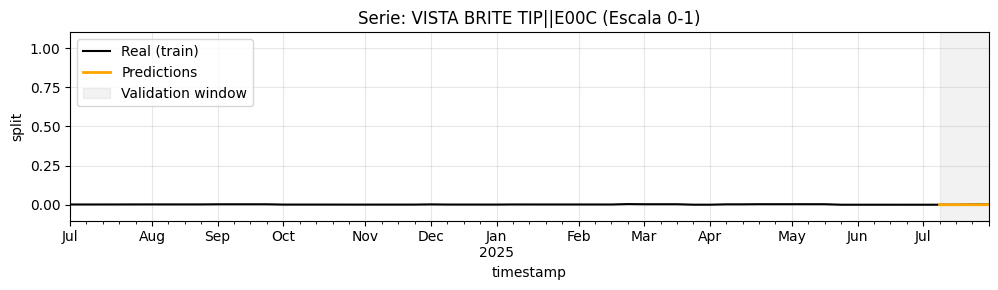


Serie: VISTA BRITE TIP||E01A
            y      pred  abs_error
128  0.023560  0.026409   0.002849
267  0.022896  0.026963   0.004067
406  0.024173  0.027618   0.003444
545  0.024115  0.027393   0.003277
MAE 0.003410


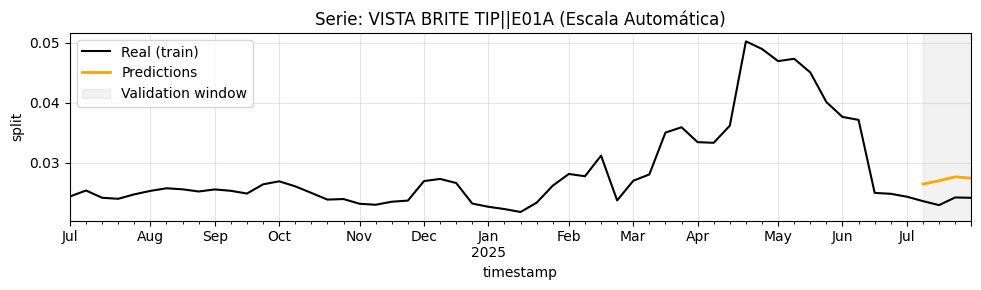

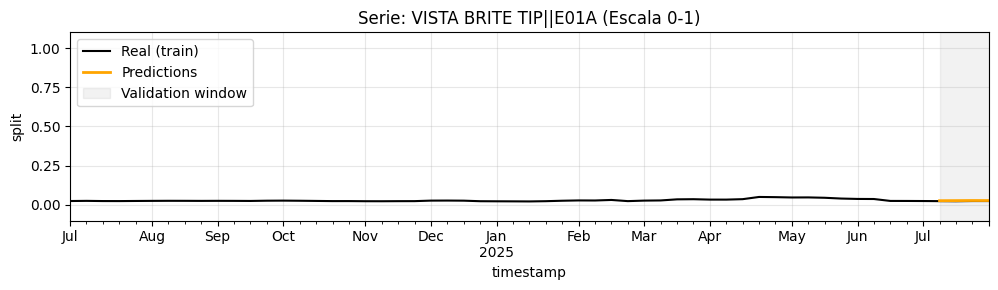


Serie: VISTA BRITE TIP||E01B
            y      pred  abs_error
129  0.544731  0.556462   0.011731
268  0.553119  0.559719   0.006600
407  0.545001  0.562668   0.017666
546  0.548014  0.563840   0.015825
MAE 0.012956


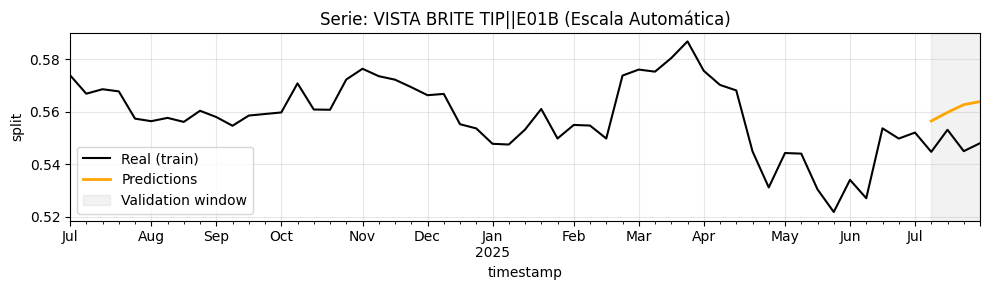

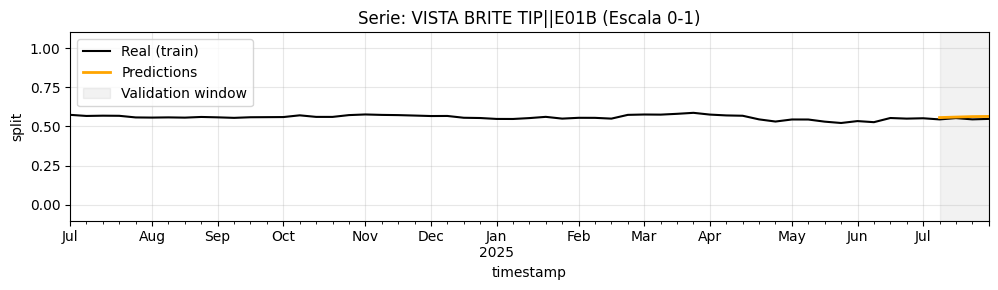


Serie: VISTA BRITE TIP||E02A
            y      pred  abs_error
130  0.275546  0.267859   0.007686
269  0.275295  0.267894   0.007401
408  0.276944  0.265450   0.011495
547  0.278510  0.262864   0.015645
MAE 0.010557


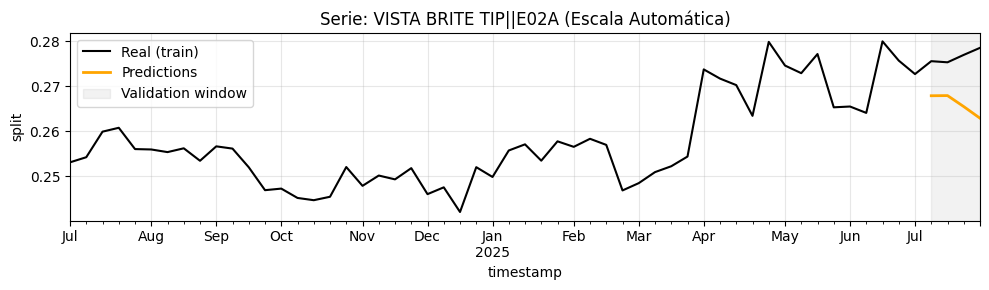

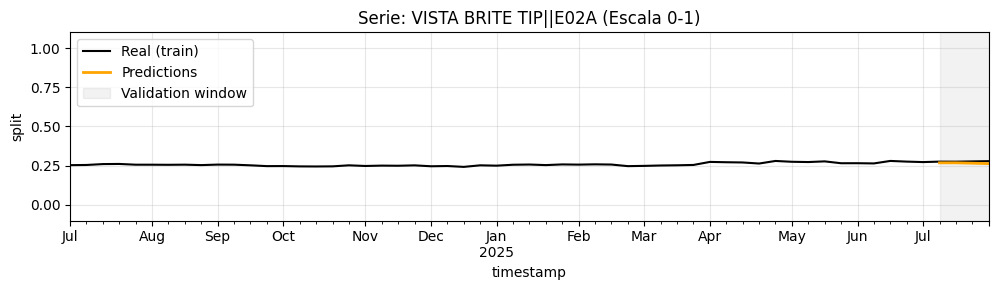


Serie: VISTA BRITE TIP||E02B
            y      pred  abs_error
131  0.104579  0.101763   0.002816
270  0.096514  0.097302   0.000788
409  0.104326  0.095200   0.009126
548  0.098050  0.095934   0.002116
MAE 0.003711


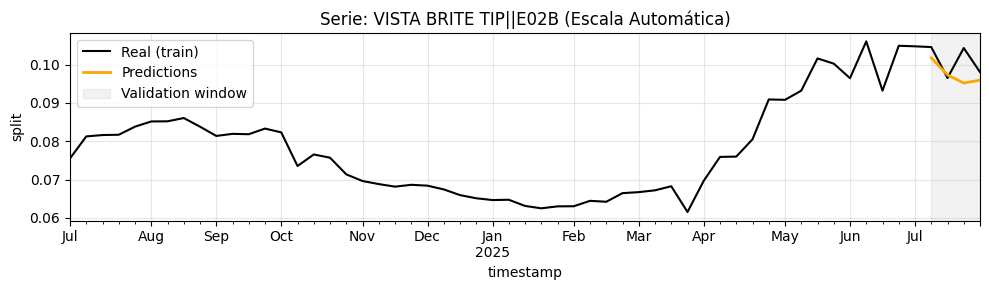

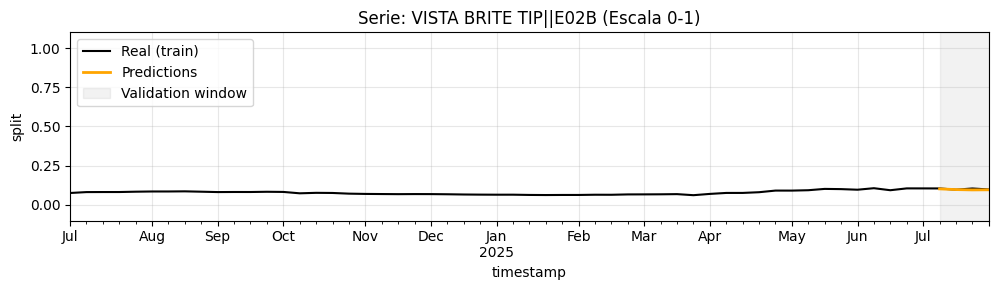


Serie: VISTA BRITE TIP||E02C
            y      pred  abs_error
132  0.046497  0.042866   0.003631
271  0.046942  0.043663   0.003279
410  0.043432  0.044724   0.001292
549  0.045270  0.045683   0.000413
MAE 0.002154


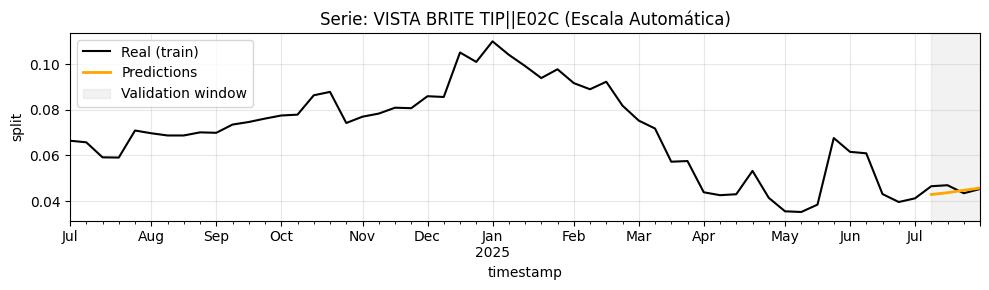

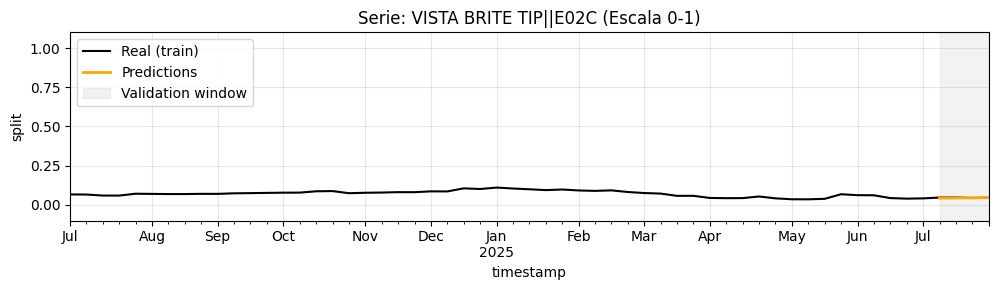


Serie: VISTA BRITE TIP (MODIFIED)||A00B
       y      pred  abs_error
133  0.0  0.000000   0.000000
272  0.0  0.000340   0.000340
411  0.0  0.000636   0.000636
550  0.0  0.000893   0.000893
MAE 0.000467


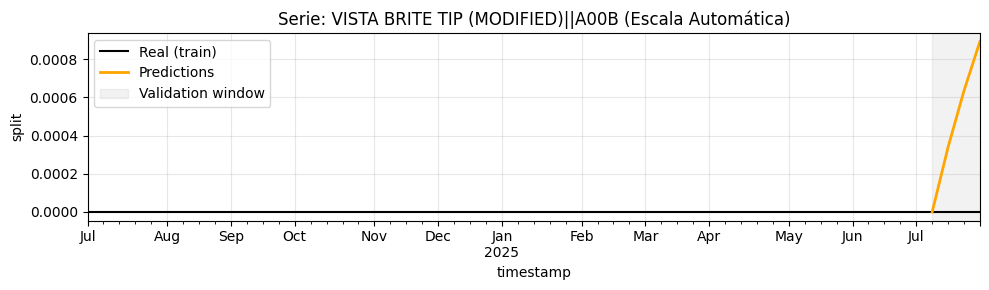

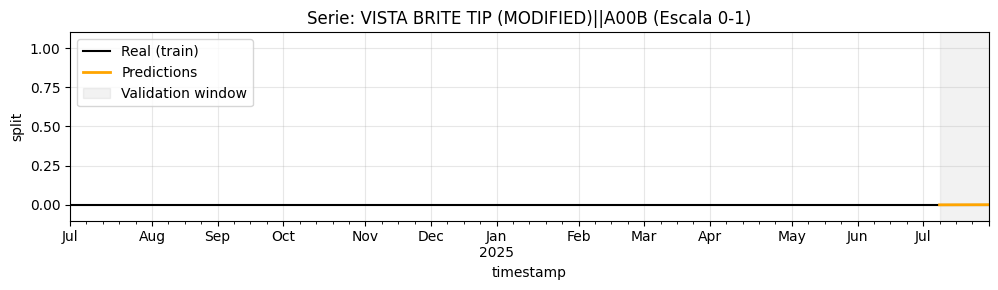


Serie: VISTA BRITE TIP (MODIFIED)||A01
       y      pred  abs_error
134  0.0  0.002619   0.002619
273  0.0  0.002501   0.002501
412  0.0  0.002491   0.002491
551  0.0  0.002429   0.002429
MAE 0.002510


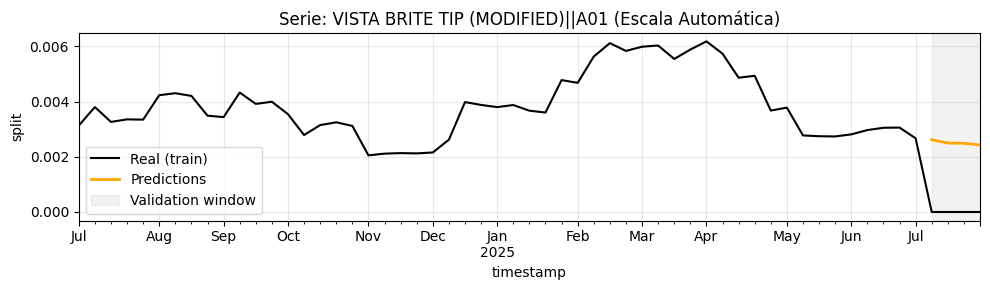

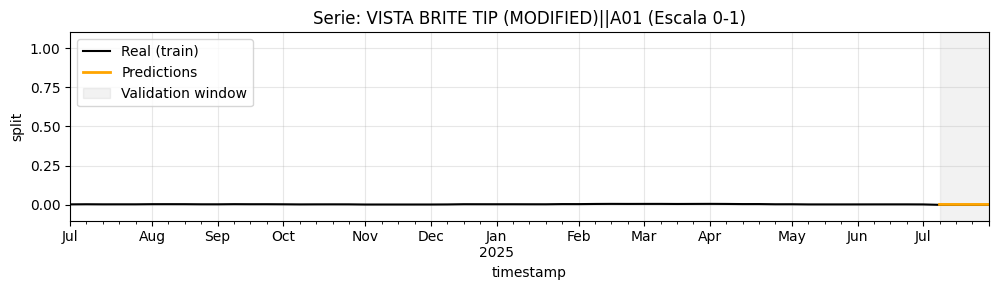


Serie: VISTA BRITE TIP (MODIFIED)||E00D
       y      pred  abs_error
135  1.0  0.997381   0.002619
274  1.0  0.997159   0.002841
413  1.0  0.996873   0.003127
552  1.0  0.996678   0.003322
MAE 0.002978


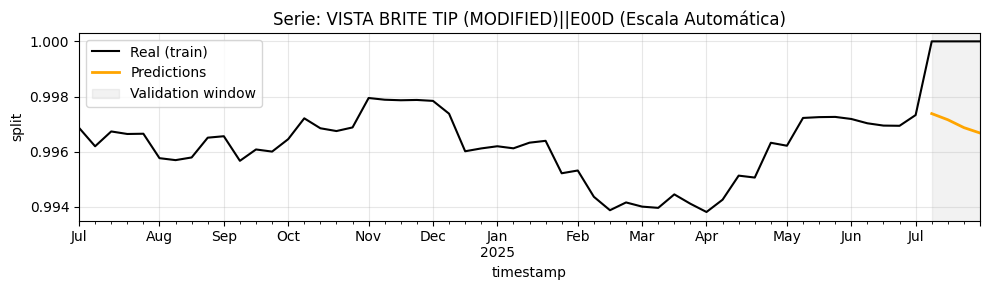

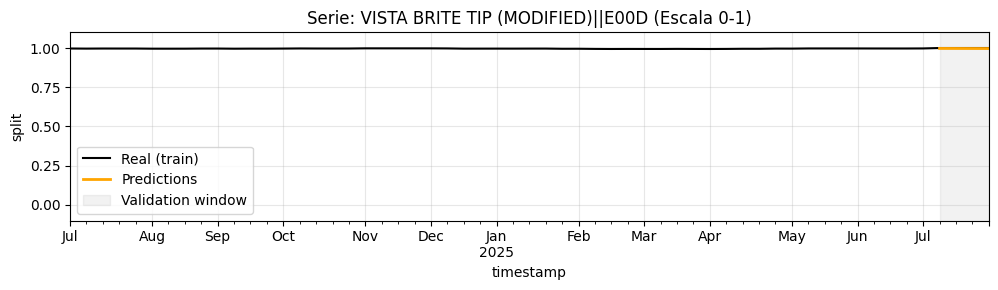


Serie: WIZDOM||EM_K60
       y      pred  abs_error
136  1.0  0.999797   0.000203
275  1.0  0.997195   0.002805
414  1.0  0.993667   0.006333
553  1.0  0.992971   0.007029
MAE 0.004093


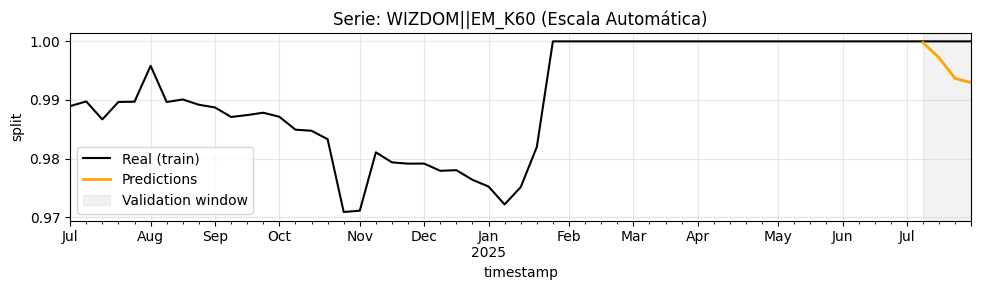

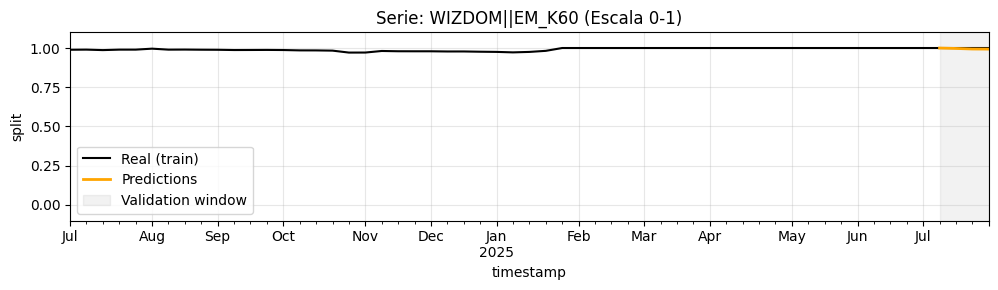


Serie: WIZDOM||EM_K60_NL
       y      pred  abs_error
137  0.0  0.000203   0.000203
276  0.0  0.002805   0.002805
415  0.0  0.006333   0.006333
554  0.0  0.007029   0.007029
MAE 0.004093


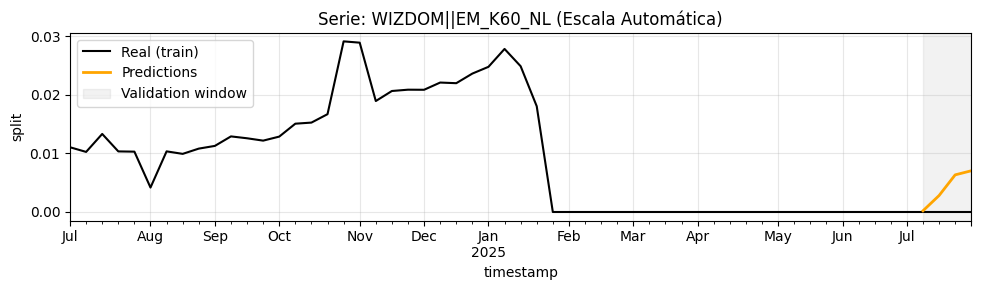

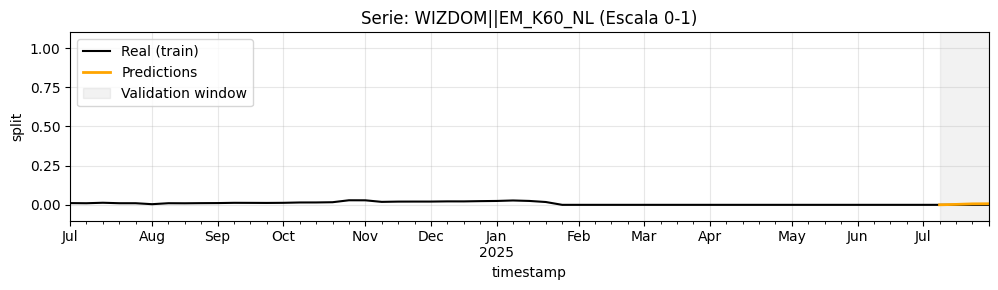


Serie: ZEPHYR||EM_O89
       y  pred  abs_error
138  1.0   1.0        0.0
277  1.0   1.0        0.0
416  1.0   1.0        0.0
555  1.0   1.0        0.0
MAE 0.000000


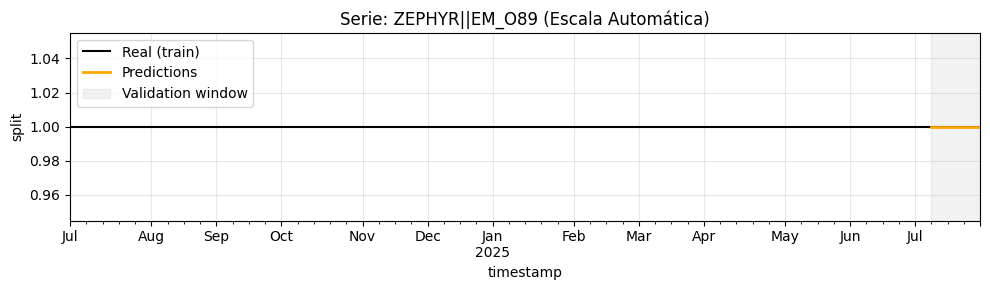

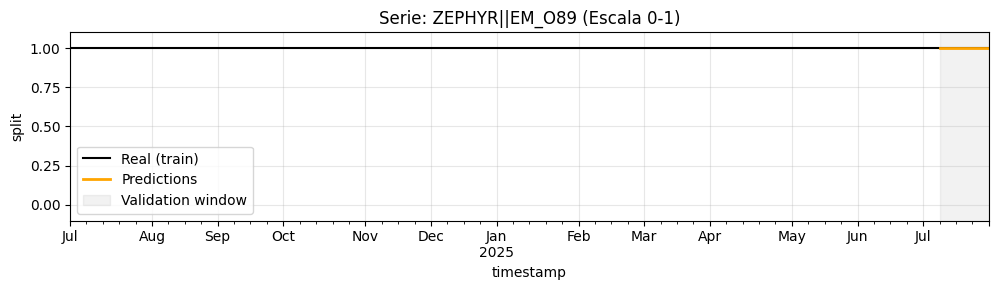

In [55]:
plot_results_dual_scale(predictions_df=final_df, 
             n_val_weeks = 4, 
             real_serie=df_full,
             n_plots=2, 
             specific_series=all_skus,
             col='split')